In [ ]:
# ============ Paths: unzip from Drive to local ============
from google.colab import drive
drive.mount('/content/drive')

!unzip -q -o "/content/drive/MyDrive/Full_Dataset/Full_Dataset/Set1.zip" -d /content/

# %% Trial 2 (improved): Affine-STN + CRNN-CTC (+ Style Head) w/ OneCycle, EMA, Beam Search
# ====================== Installs ======================
!pip -q install albumentations==1.4.7 editdistance==0.8.1 tqdm

# ====================== Imports & Setup ======================
import os, time, random, unicodedata, warnings, math
from pathlib import Path
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2, editdistance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import albumentations as A
from torchvision import models

warnings.filterwarnings("ignore", category=UserWarning)
cv2.setNumThreads(0)

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

def human(n): return f"{n:,}"
def autocast_cuda(): return torch.amp.autocast("cuda", enabled=(DEVICE=="cuda"))

# ====================== Paths (unzipped locally) ======================
EXTRACT_DIR = Path("/content/Set1")
IMAGES_DIR = EXTRACT_DIR / "images"
CSV_PATH   = EXTRACT_DIR / "labels_fixed.csv"
assert IMAGES_DIR.exists(), f"Images dir not found: {IMAGES_DIR}"
assert CSV_PATH.exists(),   f"CSV not found: {CSV_PATH}"
print("Images dir:", IMAGES_DIR)
print("CSV:", CSV_PATH)

# ====================== Load CSV & Basic Cleanup ======================
df = pd.read_csv(CSV_PATH)
# Expecting: img_name (B), class (C), label (Arabic text)
assert {'img_name','label','class'}.issubset(df.columns), df.columns

def normalize_label(s: str) -> str:
    return unicodedata.normalize("NFC", str(s)).strip()

df['label'] = df['label'].astype(str).apply(normalize_label)
df['img_path'] = df['img_name'].apply(lambda n: str(IMAGES_DIR / n))

# drop rows with missing files
df = df[df['img_path'].apply(lambda p: Path(p).exists())].reset_index(drop=True)

# build charset from all labels (avoid OOV at eval)
char_counts = Counter()
for s in df['label']:
    for ch in s: char_counts[ch]+=1
# Keep <BLANK> at 0 for CTCLoss
charset  = ['<BLANK>'] + sorted(char_counts.keys(), key=lambda c: (-char_counts[c], ord(c)))
char2idx = {c:i for i,c in enumerate(charset)}
idx2char = {i:c for c,i in char2idx.items()}
BLANK_IDX = 0
print(f"Rows: {human(len(df))} | Charset size(incl <BLANK>): {len(charset)}")

# style classes
style_names = sorted(df['class'].fillna("Unknown").unique().tolist())
style2idx = {s:i for i,s in enumerate(style_names)}
idx2style = {i:s for s,i in style2idx.items()}
print(f"Styles ({len(style_names)}):", style_names)

# drop empty-after-encoding labels (CTC cannot train on empty targets)
def encode_label(text, rtl_reverse=True):
    if rtl_reverse: text = text[::-1]
    ids = [char2idx[ch] for ch in text if ch in char2idx and ch != '<BLANK>']
    return ids

RTL_REVERSE = True
df['enc_len'] = df['label'].apply(lambda s: len(encode_label(s, RTL_REVERSE)))
before = len(df); df = df[df['enc_len']>0].reset_index(drop=True)
print(f"Filtered empty labels: {human(before)} -> {human(len(df))}")

# ====================== Split ======================
train_df, test_df = train_test_split(
    df, test_size=0.10, random_state=SEED, stratify=df['class'].fillna("Unknown")
)
train_df, val_df  = train_test_split(
    train_df, test_size=0.1111, random_state=SEED, stratify=train_df['class'].fillna("Unknown")
)
print(f"Train: {human(len(train_df))} | Val: {human(len(val_df))} | Test: {human(len(test_df))}")

# ====================== Image & Token utils ======================
H_TARGET = 64
W_MAX    = 512            # a bit wider cap to give CTC more T-steps
MEAN, STD = 0.5, 0.5

def decode_pred(indices, rtl_reverse=RTL_REVERSE):
    res, prev = [], None
    for idx in indices:
        if idx != BLANK_IDX and idx != prev:
            res.append(idx2char[idx])
        prev = idx
    s = "".join(res)
    return s[::-1] if rtl_reverse else s

# Ensure enough time-steps for CTC: T >= label_len * factor
MIN_PX_PER_CHAR = 8

def resize_keep_ar_enforced(gray, h=H_TARGET, label_len=0,
                            min_px_per_char=MIN_PX_PER_CHAR, min_w=16, w_max=W_MAX):
    h0, w0 = gray.shape[:2]
    base_scale = h / float(h0)
    req_w = max(min_w, min(w_max, max(min_w, label_len * min_px_per_char)))
    scale_w = req_w / float(w0)
    scale = max(base_scale, scale_w)
    new_w = int(np.clip(np.ceil(w0 * scale), min_w, w_max))
    interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
    return cv2.resize(gray, (new_w, h), interpolation=interp)

def pad_width_to_multiple(img, multiple=4, pad_value=255):
    h, w = img.shape
    pad_w = (multiple - (w % multiple)) % multiple
    if pad_w == 0: return img
    return cv2.copyMakeBorder(img, 0, 0, 0, pad_w, cv2.BORDER_CONSTANT, value=pad_value)

# ====================== Augmentations (stronger but safe) ======================
AUG_P = 0.35

def stroke_thickness_jitter(img, p=0.5):
    if random.random() > p: return img
    k = random.choice([1,1,2])
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*k+1, 2*k+1))
    if random.random() < 0.5: img = cv2.erode(img, kernel, iterations=1)
    else: img = cv2.dilate(img, kernel, iterations=1)
    return img

def cutwidthout(img, max_stripes=3, max_frac=0.12, p=0.4):
    # randomly mask vertical stripes (simulate occlusion / scans)
    if random.random() > p: return img
    h, w = img.shape
    n = random.randint(1, max_stripes)
    for _ in range(n):
        stripe_w = max(2, int(random.random() * max(3, w*max_frac)))
        x0 = random.randint(0, max(0, w-stripe_w))
        img[:, x0:x0+stripe_w] = 255
    return img

train_aug = A.Compose([
    A.ImageCompression(quality_lower=60, quality_upper=95, p=AUG_P),
    A.MotionBlur(blur_limit=3, p=AUG_P*0.8),
    A.GaussNoise(var_limit=(5.0, 25.0), p=AUG_P*0.9),
    A.Perspective(scale=(0.02, 0.06), keep_size=True, pad_mode=cv2.BORDER_REPLICATE, p=AUG_P),
    A.GridDistortion(num_steps=5, distort_limit=0.2, p=AUG_P*0.6),
    A.RandomGamma(gamma_limit=(80,120), p=AUG_P*0.8),
    A.GaussianBlur(blur_limit=(3,5), p=AUG_P*0.5),
    A.RandomBrightnessContrast(brightness_limit=0.08, contrast_limit=0.08, p=AUG_P*0.9),
])

def apply_train_aug(img):
    img = stroke_thickness_jitter(img, p=0.5)
    img = cutwidthout(img, p=0.35)
    return train_aug(image=img)["image"]

# ====================== Dataset / Collate (bucketed by width) ======================
class OCRDataset(Dataset):
    def __init__(self, frame: pd.DataFrame, training=True):
        self.df = frame.reset_index(drop=True)
        self.training = training
    def __len__(self): return len(self.df)
    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = cv2.imread(row['img_path'], cv2.IMREAD_GRAYSCALE)
        assert img is not None, f"Failed to read {row['img_path']}"
        label_str = row['label']
        label_ids = encode_label(label_str, RTL_REVERSE)
        style_idx = style2idx[row['class']]
        img = resize_keep_ar_enforced(img, H_TARGET, label_len=len(label_ids))
        if self.training: img = apply_train_aug(img)
        img = pad_width_to_multiple(img, multiple=4, pad_value=255)
        img = img.astype(np.float32)/255.0
        img = (img - MEAN) / STD
        img_t = torch.from_numpy(img)[None, ...]  # (1,H,W)
        return img_t, torch.tensor(label_ids, dtype=torch.long), label_str, torch.tensor(style_idx), row['class'], img_t.shape[-1]

def collate_fn(batch):
    # sort by width (desc) ⇒ better packing for LSTM
    batch = sorted(batch, key=lambda x: x[-1], reverse=True)
    imgs, labels, label_strs, style_idxs, style_names_b, widths = zip(*batch)
    max_w = max(widths); bsz = len(imgs)
    padded = torch.full((bsz, 1, H_TARGET, max_w), (0.0 - MEAN)/STD, dtype=torch.float32)
    for i, im in enumerate(imgs):
        w = im.shape[-1]
        padded[i, :, :, :w] = im
    label_lens = torch.tensor([len(l) for l in labels], dtype=torch.long)
    labels_concat = torch.cat(labels, dim=0) if len(labels) and sum(label_lens).item()>0 else torch.tensor([], dtype=torch.long)
    return padded, labels_concat, label_lens, label_strs, torch.stack(style_idxs), style_names_b, torch.tensor(widths, dtype=torch.long)

# ====================== Model ======================
try:
    _IMAGENET_WEIGHTS = models.ResNet34_Weights.IMAGENET1K_V1
except Exception:
    _IMAGENET_WEIGHTS = "IMAGENET1K_V1"

class AffineSTN(nn.Module):
    """ Lightweight affine STN to de-skew and normalize horizontally. """
    def __init__(self, in_ch=1):
        super().__init__()
        self.loc = nn.Sequential(
            nn.Conv2d(in_ch, 16, 3, padding=1), nn.ReLU(True),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(True),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(True),
            nn.AdaptiveAvgPool2d((4,16)),
        )
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64*4*16, 128), nn.ReLU(True),
            nn.Linear(128, 6)
        )
        # initialize to identity transform
        with torch.no_grad():
            self.fc[-1].weight.zero_()
            self.fc[-1].bias.copy_(torch.tensor([1,0,0, 0,1,0], dtype=torch.float))

    def forward(self, x):
        B, C, H, W = x.shape
        theta = self.fc(self.loc(x)).view(-1, 2, 3)
        grid = F.affine_grid(theta, size=x.size(), align_corners=False)
        x = F.grid_sample(x, grid, mode='bilinear', padding_mode='border', align_corners=False)
        return x

class ResNet34OCRFeaturePretrained(nn.Module):
    def __init__(self, in_ch=1, use_stn=True):
        super().__init__()
        self.stn = AffineSTN(in_ch) if use_stn else nn.Identity()
        try:
            m = models.resnet34(weights=_IMAGENET_WEIGHTS)
        except TypeError:
            m = models.resnet34(pretrained=True)
        # adapt to 1ch by averaging RGB weights
        with torch.no_grad():
            w = m.conv1.weight.data
            new_w = w.mean(dim=1, keepdim=True)
        m.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=(2,1), padding=3, bias=False)
        with torch.no_grad():
            m.conv1.weight.copy_(new_w)
        m.maxpool = nn.MaxPool2d(kernel_size=3, stride=(2,1), padding=1)
        def set_layer_height_only(layer):
            b0 = layer[0]
            b0.conv1.stride = (2,1)
            if b0.downsample is not None and isinstance(b0.downsample, nn.Sequential):
                ds0 = b0.downsample[0]
                if isinstance(ds0, nn.Conv2d): ds0.stride = (2,1)
        set_layer_height_only(m.layer2); set_layer_height_only(m.layer3); set_layer_height_only(m.layer4)

        self.stem   = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1 = m.layer1
        self.layer2 = m.layer2
        self.layer3 = m.layer3
        self.layer4 = m.layer4
        self.out    = nn.AdaptiveAvgPool2d((1, None))  # collapse height

    def forward(self, x):
        x = self.stn(x)
        x = self.stem(x)
        x = self.layer1(x); x = self.layer2(x); x = self.layer3(x); x = self.layer4(x)
        fmap = x                                          # (B, 512, H', W)
        seq  = self.out(fmap).squeeze(2).permute(2,0,1)   # (T=W, B, 512)
        return seq, fmap

class BiLSTMStack(nn.Module):
    def __init__(self, in_dim, hidden=320, num_layers=3, dropout=0.3):
        super().__init__()
        layers=[]
        for i in range(num_layers):
            inp = in_dim if i==0 else hidden*2
            layers.append(nn.LSTM(inp, hidden, bidirectional=True, batch_first=False))
            layers.append(nn.Dropout(dropout))
        self.layers = nn.ModuleList(layers)
    def forward(self, x):
        for i in range(0,len(self.layers),2):
            x,_ = self.layers[i](x); x = self.layers[i+1](x)
        return x

class OCR_MultiTask(nn.Module):
    """
    Shared CNN (+STN) -> sequence.
    Head 1: CTC recognition (BiLSTM + linear).
    Head 2: Style classification (global pool over width, linear).
    """
    def __init__(self, num_chars, num_styles, blank_idx=0, use_stn=True):
        super().__init__()
        self.backbone = ResNet34OCRFeaturePretrained(in_ch=1, use_stn=use_stn)
        self.seq = BiLSTMStack(in_dim=512, hidden=320, num_layers=3, dropout=0.3)
        self.ctc_head = nn.Linear(640, num_chars)   # 320*2
        self.style_head = nn.Sequential(
            nn.AdaptiveAvgPool2d((1,1)), nn.Flatten(),
            nn.Dropout(0.3),
            nn.Linear(512, max(256, num_styles*4)), nn.ReLU(True),
            nn.Linear(max(256, num_styles*4), num_styles)
        )
        # bias-down blank to avoid trivial blank decoding
        with torch.no_grad():
            if isinstance(self.ctc_head.bias, torch.Tensor):
                self.ctc_head.bias.zero_()
                self.ctc_head.bias[blank_idx] = -3.0

    def forward(self, x):
        seq_feats, fmap = self.backbone(x)   # seq_feats: (T,B,512), fmap: (B,512,H',W)
        seq_out = self.seq(seq_feats)        # (T,B,640)
        ctc_logits = self.ctc_head(seq_out)  # (T,B,Cchars)
        style_logits = self.style_head(fmap) # (B, Cstyles)
        return ctc_logits, style_logits

# ====================== Dataloaders & Model Setup ======================
BATCH_SIZE   = 64
EPOCHS       = 110
INIT_LR_HEAD = 8e-4      # base (OneCycle will peak above)
INIT_LR_BB   = 2e-4
WEIGHT_DECAY = 5e-5      # slightly lower
MAX_NORM     = 1.0

train_ds = OCRDataset(train_df, training=True)
val_ds   = OCRDataset(val_df,   training=False)
test_ds  = OCRDataset(test_df,  training=False)

NUM_WORKERS = 2
loader_kwargs = dict(collate_fn=collate_fn, pin_memory=True, num_workers=NUM_WORKERS, persistent_workers=False)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  **loader_kwargs)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)

num_chars  = len(charset)
num_styles = len(style_names)
model = OCR_MultiTask(num_chars, num_styles, blank_idx=BLANK_IDX, use_stn=True).to(DEVICE)

ctc_loss  = nn.CTCLoss(blank=BLANK_IDX, reduction='mean', zero_infinity=True)
cls_loss  = nn.CrossEntropyLoss()

# param groups: smaller LR on backbone
bb_params   = list(model.backbone.parameters())
lstm_params = list(model.seq.parameters())
head_params = list(model.ctc_head.parameters()) + list(model.style_head.parameters())
optimizer = torch.optim.AdamW(
    [{"params": bb_params,   "lr": INIT_LR_BB},
     {"params": lstm_params, "lr": INIT_LR_HEAD},
     {"params": head_params, "lr": INIT_LR_HEAD}],
    weight_decay=WEIGHT_DECAY, betas=(0.9, 0.98)
)

# OneCycleLR — step per batch; peak lrs ~5x base
steps_per_epoch = max(1, len(train_loader))
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=[INIT_LR_BB*5.0, INIT_LR_HEAD*5.0, INIT_LR_HEAD*5.0],
    epochs=EPOCHS, steps_per_epoch=steps_per_epoch, pct_start=0.15,
    div_factor=5.0, final_div_factor=20.0, three_phase=False
)
scaler    = torch.amp.GradScaler("cuda", enabled=(DEVICE=="cuda"))

# EMA for stabler validation / better generalization
class ModelEMA:
    def __init__(self, model, decay=0.999):
        self.decay = decay
        self.shadow = {}
        self.backup = {}
        for name, p in model.named_parameters():
            if p.requires_grad:
                self.shadow[name] = p.data.clone()
    @torch.no_grad()
    def update(self, model):
        for name, p in model.named_parameters():
            if p.requires_grad:
                assert name in self.shadow
                new_average = (1.0 - self.decay) * p.data + self.decay * self.shadow[name]
                self.shadow[name] = new_average.clone()
    def apply_shadow(self, model):
        self.backup = {}
        for name, p in model.named_parameters():
            if p.requires_grad:
                self.backup[name] = p.data.clone()
                p.data = self.shadow[name].clone()
    def restore(self, model):
        for name, p in model.named_parameters():
            if p.requires_grad and name in self.backup:
                p.data = self.backup[name].clone()
        self.backup = {}

ema = ModelEMA(model, decay=0.999)

total_params = sum(p.numel() for p in model.parameters())
print(f"Parameters: {human(total_params)}")

def ctc_time_lengths(widths):
    # width preserved through backbone (stride width=1 everywhere)
    return torch.clamp(widths, min=1)

# ====================== Decoding & Metrics ======================
@torch.no_grad()
def greedy_decode_ctc(logits, out_lens):
    max_idxs = logits.softmax(dim=-1).argmax(dim=-1)  # (T,B)
    T,B = max_idxs.shape
    dec=[]
    for b in range(B):
        L = int(out_lens[b])
        seq = max_idxs[:L, b].tolist()
        dec.append(decode_pred(seq))
    return dec

@torch.no_grad()
def prefix_beam_search_single(log_probs_TxC, beam_size=10, blank=BLANK_IDX):
    # log_probs: (T, C) log-softmax per time-step
    T, C = log_probs_TxC.shape
    # Each entry: (prefix_tuple) -> (p_blank, p_non_blank)
    Beam = defaultdict(lambda: (-float('inf'), -float('inf')))
    empty = ()
    Beam[empty] = (0.0, -float('inf'))  # log(1)=0
    for t in range(T):
        next_Beam = defaultdict(lambda: (-float('inf'), -float('inf')))
        logp = log_probs_TxC[t]  # (C,)
        # speed-up: restrict to top-K symbols for this time step
        topk = torch.topk(logp, k=min(beam_size*2, C)).indices.tolist()
        for prefix, (pb, pnb) in Beam.items():
            # stay at blank
            p_b = logp[blank].item()
            nb_pb = torch.logsumexp(torch.tensor([pb + p_b, pnb + p_b]), dim=0).item()
            old_pb, old_pnb = next_Beam[prefix]
            next_Beam[prefix] = (max(old_pb, nb_pb), old_pnb)

            # extend with top symbols
            for c in topk:
                if c == blank:
                    continue
                p_c = logp[c].item()
                last = prefix[-1] if len(prefix)>0 else None
                if c == last:
                    # repeat last char -> only from blank
                    new_pnb = pb + p_c
                    old_pb2, old_pnb2 = next_Beam[prefix]
                    next_Beam[prefix] = (old_pb2, torch.logsumexp(torch.tensor([old_pnb2, new_pnb]), dim=0).item())
                else:
                    new_prefix = prefix + (c,)
                    old_pb2, old_pnb2 = next_Beam[new_prefix]
                    new_pnb = torch.logsumexp(torch.tensor([old_pnb2, pb + p_c, pnb + p_c]), dim=0).item()
                    next_Beam[new_prefix] = (old_pb2, new_pnb)
        # prune
        Beam = dict(sorted(next_Beam.items(), key=lambda kv: torch.logsumexp(torch.tensor(kv[1]), dim=0).item(), reverse=True)[:beam_size])
    # best
    best = max(Beam.items(), key=lambda kv: torch.logsumexp(torch.tensor(kv[1]), dim=0).item())[0]
    # collapse repeats already handled; just map to string
    return decode_pred(best)

def cer(ref, hyp):
    return 0.0 if (len(ref)==0 and len(hyp)==0) else editdistance.eval(ref, hyp)/max(1,len(ref))
def wer(ref, hyp):
    r, h = ref.split(), hyp.split()
    return 0.0 if (len(r)==0 and len(h)==0) else editdistance.eval(r, h)/max(1,len(r))

# ====================== Eval (recognition + style) ======================
@torch.no_grad()
def evaluate(model, loader, use_beam=True, ema_obj=None):
    model.eval()
    if ema_obj is not None: ema_obj.apply_shadow(model)
    tot_loss = tot_cer = tot_wer = 0.0; cnt = 0
    cls_correct = 0; cls_total = 0
    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in loader:
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)

        with autocast_cuda():
            ctc_logits, style_logits = model(imgs)
            log_probs = ctc_logits.log_softmax(2)

        # losses
        if len(labels_concat)>0:
            loss_ctc = ctc_loss(log_probs, labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
        else:
            loss_ctc = torch.tensor(0., device=DEVICE)
        loss_cls = cls_loss(style_logits, style_idxs)
        loss = loss_ctc + current_lambda_cls(0) * loss_cls  # lambda value irrelevant for eval; use current func

        B = imgs.size(0); tot_loss += loss.item()*B; cnt += B

        # recognition metrics (beam gives better CER)
        T, B_, C = ctc_logits.shape
        if use_beam:
            probs = log_probs.detach().cpu()  # (T,B,C)
            preds=[]
            for b in range(B_):
                L = int(input_lens[b])
                preds.append(prefix_beam_search_single(probs[:L, b, :], beam_size=10, blank=BLANK_IDX))
        else:
            preds = greedy_decode_ctc(ctc_logits, input_lens)

        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr); tot_wer += wer(gt, pr)

        # style accuracy
        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total   += B

    if ema_obj is not None: ema_obj.restore(model)
    return {
        "loss": (tot_loss/cnt) if cnt else None,
        "cer":  (tot_cer/cnt) if cnt else None,
        "wer":  (tot_wer/cnt) if cnt else None,
        "style_acc": (cls_correct/cls_total) if cls_total>0 else None
    }

# ====================== Training ======================
SAVE_DIR = Path("./checkpoints"); SAVE_DIR.mkdir(parents=True, exist_ok=True)
BEST_PATH = SAVE_DIR / "ocr_multitask_best.pt"
history = {"train_loss": [], "val_loss": [], "val_cer": [], "val_wer": [], "val_style_acc": []}
best_cer = float('inf')

def gpu_mem():
    if DEVICE=="cuda":
        a = torch.cuda.memory_allocated()/1e9; r = torch.cuda.memory_reserved()/1e9
        return f"GPU: alloc={a:.2f}G resv={r:.2f}G"
    return "CPU"

# freeze backbone for 1 epoch warm-up (heads/LSTMs only)
for p in model.backbone.parameters(): p.requires_grad = False
print("Backbone frozen for warmup epoch.")

# style loss ramp: start small to let CTC settle
def current_lambda_cls(epoch_idx):
    # ramp from 0.1 → 0.5 by epoch 10, then hold
    return 0.1 if epoch_idx<=0 else (0.1 + min(1.0, epoch_idx/10.0) * (0.5-0.1))

print(f"[Train] epochs={EPOCHS}, batches/epoch={len(train_loader)}, device={DEVICE}")
global_step = 0
for epoch in range(1, EPOCHS+1):
    model.train()
    running = 0.0; seen = 0
    t0 = time.time()

    if epoch == 2:
        for p in model.backbone.parameters(): p.requires_grad = True
        print("Backbone unfrozen.")

    lam_cls = current_lambda_cls(epoch)

    pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch:02d}", leave=False)
    for bidx, (imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths) in pbar:
        imgs = imgs.to(DEVICE, non_blocking=True)
        style_idxs = style_idxs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)

        optimizer.zero_grad(set_to_none=True)
        with autocast_cuda():
            ctc_logits, style_logits = model(imgs)
            log_probs = ctc_logits.log_softmax(2)
            if len(labels_concat)>0:
                loss_ctc = ctc_loss(log_probs, labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
            else:
                loss_ctc = torch.tensor(0., device=DEVICE)
            loss_cls = cls_loss(style_logits, style_idxs)
            loss = loss_ctc + lam_cls*loss_cls

        scaler.scale(loss).backward()
        nn.utils.clip_grad_norm_(model.parameters(), MAX_NORM)
        scaler.step(optimizer); scaler.update()
        scheduler.step(); global_step += 1
        ema.update(model)

        running += loss.item() * imgs.size(0); seen += imgs.size(0)
        pbar.set_postfix(loss=f"{loss.item():.3f}", avg=f"{(running/max(1,seen)):.3f}",
                         lam_cls=f"{lam_cls:.2f}")

    train_loss = running / max(1, seen)
    history["train_loss"].append(train_loss)

    # EMA-weighted validation with beam decoding
    val_metrics = evaluate(model, val_loader, use_beam=True, ema_obj=ema)
    history["val_loss"].append(val_metrics["loss"])
    history["val_cer"].append(val_metrics["cer"])
    history["val_wer"].append(val_metrics["wer"])
    history["val_style_acc"].append(val_metrics["style_acc"])

    dt = time.time()-t0
    print(f"Epoch {epoch:02d}/{EPOCHS} | train={train_loss:.3f} | "
          f"val_loss={val_metrics['loss']:.3f} | val_CER={val_metrics['cer']:.3f} | "
          f"val_WER={val_metrics['wer']:.3f} | val_style_acc={val_metrics['style_acc']:.3f} | {dt:.1f}s | {gpu_mem()}")

    if val_metrics["cer"] is not None and val_metrics["cer"] < best_cer:
        best_cer = val_metrics["cer"]
        torch.save({
            "model": model.state_dict(),
            "charset": charset, "style_names": style_names,
            "config": {"H_TARGET": H_TARGET, "RTL_REVERSE": RTL_REVERSE}
        }, BEST_PATH)
        print(f"  ↳ New best CER={best_cer:.4f} — saved to {BEST_PATH}")

print("[Train] Done.")

# ====================== Curves ======================
plt.figure(figsize=(6,4)); plt.plot(history["train_loss"], label="train"); plt.plot(history["val_loss"], label="val")
plt.title("Loss"); plt.xlabel("Epoch"); plt.legend(); plt.show()

plt.figure(figsize=(6,4)); plt.plot(history["val_cer"], label="val_CER"); plt.plot(history["val_wer"], label="val_WER")
plt.title("Recognition"); plt.xlabel("Epoch"); plt.legend(); plt.show()

plt.figure(figsize=(6,4)); plt.plot(history["val_style_acc"], label="val_style_acc")
plt.title("Style accuracy"); plt.xlabel("Epoch"); plt.legend(); plt.show()

# ====================== Test Evaluation (EMA + beam) ======================
ckpt = torch.load(BEST_PATH, map_location=DEVICE)
model.load_state_dict(ckpt["model"]); model.eval()

# Wrap with a fresh EMA shadow from loaded model (identity) to reuse evaluate()
ema_test = ModelEMA(model, decay=0.0)  # shadow = current weights
test_metrics = evaluate(model, test_loader, use_beam=True, ema_obj=ema_test)
print(f"TEST — CER={test_metrics['cer']:.3f} | WER={test_metrics['wer']:.3f} | "
      f"loss={test_metrics['loss']:.3f} | style_acc={test_metrics['style_acc']:.3f}")

# ====================== Qualitative Samples ======================
@torch.no_grad()
def show_samples(model, loader, k=6):
    model.eval()
    imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths = next(iter(loader))
    imgs = imgs.to(DEVICE)
    ema_test.apply_shadow(model)
    ctc_logits, style_logits = model(imgs)
    ema_test.restore(model)
    log_probs = ctc_logits.log_softmax(2)
    preds=[]
    for i in range(imgs.size(0)):
        L = int(ctc_time_lengths(widths)[i])
        preds.append(prefix_beam_search_single(log_probs[:L, i, :].cpu(), beam_size=10, blank=BLANK_IDX))
    style_pred = style_logits.softmax(1).argmax(1).cpu().tolist()
    for i in range(min(k, imgs.size(0))):
        im = imgs[i,0].cpu().numpy()
        im = np.clip(im*STD + MEAN, 0, 1)
        plt.figure(figsize=(7,2))
        plt.imshow(im, cmap='gray'); plt.axis('off')
        gt_style = style_names_b[i]
        pr_style = idx2style[style_pred[i]]
        plt.title(f"GT style: {gt_style} | PR style: {pr_style}\nGT: {label_strs[i]}\nPR: {preds[i]}")
        plt.show()

show_samples(model, test_loader, k=6)
print("✅ Finished end-to-end (improved).")


Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.7/155.7 kB 8.8 MB/s eta 0:00:00
Device: cuda
Images dir: /content/Set1/images
CSV: /content/Set1/labels_fixed.csv
Rows: 1,598 | Charset size(incl <BLANK>): 48
Styles (5): ['Diwani', 'Kufic', 'Muhaquaq', 'Naskh', 'Thuluth']
Filtered empty labels: 1,598 -> 1,598
Train: 1,278 | Val: 160 | Test: 160
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 180MB/s]


Parameters: 29,050,747
Backbone frozen for warmup epoch.
[Train] epochs=110, batches/epoch=20, device=cuda


Epoch 01:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/110 | train=16.823 | val_loss=33.622 | val_CER=9.084 | val_WER=1.767 | val_style_acc=0.594 | 821.9s | GPU: alloc=0.36G resv=1.19G
  ↳ New best CER=9.0843 — saved to checkpoints/ocr_multitask_best.pt
Backbone unfrozen.


Epoch 02:   0%|          | 0/20 [00:00<?, ?it/s]

KeyboardInterrupt: 

## Attempt 2

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cuda
Images dir: /content/Set1/images
CSV: /content/Set1/labels_fixed.csv
Rows: 1,598 | Charset size(incl <BLANK>): 48
Styles (5): ['Diwani', 'Kufic', 'Muhaquaq', 'Naskh', 'Thuluth']
Filtered empty labels: 1,598 -> 1,598
Train: 1,278 | Val: 160 | Test: 160
Parameters: 30,384,421
Backbone frozen for warmup epoch.
[Train] epochs=80, batches/epoch=20, device=cuda


Epoch 01:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/80 | train=20.284 | val_raw: loss=6.949 CER=0.957 WER=1.000 style=0.631 | val_EMA: CER=1.559 WER=1.005 style=0.050 | 12.2s | GPU: alloc=0.84G resv=2.76G
  ↳ New best EMA CER=1.5587 — saved to checkpoints/ocr_multitask_best_ema.pt
Backbone unfrozen.


Epoch 02:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/80 | train=7.994 | val_raw: loss=6.178 CER=0.905 WER=1.038 style=0.644 | val_EMA: CER=1.463 WER=1.008 style=0.269 | 39.1s | GPU: alloc=1.11G resv=4.05G
  ↳ New best EMA CER=1.4626 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 03:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/80 | train=7.173 | val_raw: loss=5.183 CER=0.948 WER=1.000 style=0.706 | val_EMA: CER=1.294 WER=1.007 style=0.500 | 14.8s | GPU: alloc=1.11G resv=6.87G
  ↳ New best EMA CER=1.2943 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 04:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/80 | train=6.347 | val_raw: loss=4.867 CER=0.944 WER=1.000 style=0.688 | val_EMA: CER=0.911 WER=1.010 style=0.588 | 14.8s | GPU: alloc=1.11G resv=7.02G
  ↳ New best EMA CER=0.9110 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 05:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/80 | train=4.993 | val_raw: loss=3.646 CER=0.996 WER=1.000 style=0.700 | val_EMA: CER=0.860 WER=1.005 style=0.613 | 14.9s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.8598 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 06:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/80 | train=4.340 | val_raw: loss=3.611 CER=1.000 WER=1.000 style=0.637 | val_EMA: CER=0.918 WER=1.000 style=0.631 | 14.5s | GPU: alloc=1.11G resv=7.17G


Epoch 07:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/80 | train=4.169 | val_raw: loss=3.493 CER=1.000 WER=1.000 style=0.631 | val_EMA: CER=0.945 WER=1.000 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 08:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/80 | train=4.079 | val_raw: loss=3.481 CER=1.000 WER=1.000 style=0.694 | val_EMA: CER=0.950 WER=1.002 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 09:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/80 | train=4.026 | val_raw: loss=3.406 CER=0.968 WER=1.000 style=0.650 | val_EMA: CER=0.949 WER=1.000 style=0.631 | 14.6s | GPU: alloc=1.11G resv=7.17G


Epoch 10:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/80 | train=3.971 | val_raw: loss=3.347 CER=0.968 WER=1.000 style=0.731 | val_EMA: CER=0.947 WER=0.999 style=0.631 | 15.1s | GPU: alloc=1.11G resv=7.17G


Epoch 11:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/80 | train=3.916 | val_raw: loss=3.375 CER=0.966 WER=1.000 style=0.731 | val_EMA: CER=0.954 WER=0.997 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 12:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/80 | train=3.849 | val_raw: loss=3.280 CER=0.965 WER=1.000 style=0.706 | val_EMA: CER=0.955 WER=0.997 style=0.631 | 15.1s | GPU: alloc=1.11G resv=7.17G


Epoch 13:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/80 | train=3.774 | val_raw: loss=3.181 CER=0.886 WER=1.000 style=0.812 | val_EMA: CER=0.955 WER=0.997 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 14:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/80 | train=3.688 | val_raw: loss=3.090 CER=0.846 WER=1.000 style=0.713 | val_EMA: CER=0.954 WER=0.997 style=0.631 | 14.6s | GPU: alloc=1.11G resv=7.17G


Epoch 15:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/80 | train=3.577 | val_raw: loss=2.991 CER=0.814 WER=1.000 style=0.781 | val_EMA: CER=0.950 WER=0.998 style=0.631 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 16:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/80 | train=3.429 | val_raw: loss=2.841 CER=0.739 WER=1.008 style=0.725 | val_EMA: CER=0.944 WER=0.998 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 17:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/80 | train=3.290 | val_raw: loss=2.719 CER=0.769 WER=0.999 style=0.787 | val_EMA: CER=0.941 WER=0.997 style=0.631 | 14.6s | GPU: alloc=1.11G resv=7.17G


Epoch 18:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/80 | train=3.153 | val_raw: loss=2.576 CER=0.706 WER=1.001 style=0.812 | val_EMA: CER=0.936 WER=0.997 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 19:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/80 | train=3.007 | val_raw: loss=2.435 CER=0.617 WER=1.006 style=0.744 | val_EMA: CER=0.930 WER=0.995 style=0.631 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 20:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/80 | train=2.901 | val_raw: loss=2.304 CER=0.667 WER=0.994 style=0.844 | val_EMA: CER=0.915 WER=0.994 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 21:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/80 | train=2.749 | val_raw: loss=2.188 CER=0.585 WER=0.980 style=0.794 | val_EMA: CER=0.899 WER=0.993 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 22:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/80 | train=2.630 | val_raw: loss=2.133 CER=0.577 WER=0.964 style=0.806 | val_EMA: CER=0.889 WER=0.994 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 23:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/80 | train=2.499 | val_raw: loss=2.031 CER=0.535 WER=0.949 style=0.775 | val_EMA: CER=0.882 WER=0.995 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 24:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/80 | train=2.404 | val_raw: loss=1.932 CER=0.518 WER=0.928 style=0.838 | val_EMA: CER=0.875 WER=0.995 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 25:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/80 | train=2.347 | val_raw: loss=1.848 CER=0.473 WER=0.914 style=0.844 | val_EMA: CER=0.867 WER=1.003 style=0.631 | 15.3s | GPU: alloc=1.11G resv=7.17G


Epoch 26:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/80 | train=2.265 | val_raw: loss=1.837 CER=0.476 WER=0.893 style=0.800 | val_EMA: CER=0.860 WER=1.002 style=0.631 | 14.9s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.8597 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 27:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/80 | train=2.187 | val_raw: loss=1.820 CER=0.464 WER=0.867 style=0.887 | val_EMA: CER=0.845 WER=1.011 style=0.631 | 15.1s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.8450 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 28:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/80 | train=2.159 | val_raw: loss=1.754 CER=0.420 WER=0.841 style=0.838 | val_EMA: CER=0.797 WER=1.011 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7968 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 29:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/80 | train=2.025 | val_raw: loss=1.680 CER=0.386 WER=0.800 style=0.887 | val_EMA: CER=0.759 WER=1.035 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7593 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 30:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/80 | train=1.956 | val_raw: loss=1.672 CER=0.382 WER=0.788 style=0.869 | val_EMA: CER=0.786 WER=1.030 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 31:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/80 | train=1.939 | val_raw: loss=1.631 CER=0.381 WER=0.763 style=0.869 | val_EMA: CER=0.811 WER=1.010 style=0.631 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 32:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/80 | train=1.960 | val_raw: loss=1.628 CER=0.351 WER=0.730 style=0.906 | val_EMA: CER=0.845 WER=1.000 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 33:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/80 | train=1.854 | val_raw: loss=1.607 CER=0.359 WER=0.743 style=0.887 | val_EMA: CER=0.863 WER=1.000 style=0.631 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 34:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/80 | train=1.814 | val_raw: loss=1.615 CER=0.351 WER=0.729 style=0.894 | val_EMA: CER=0.876 WER=1.000 style=0.631 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 35:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/80 | train=1.759 | val_raw: loss=1.555 CER=0.345 WER=0.719 style=0.900 | val_EMA: CER=0.882 WER=1.000 style=0.631 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 36:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/80 | train=1.769 | val_raw: loss=1.526 CER=0.342 WER=0.719 style=0.875 | val_EMA: CER=0.882 WER=1.000 style=0.631 | 15.0s | GPU: alloc=1.11G resv=7.17G


Epoch 37:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/80 | train=1.716 | val_raw: loss=1.552 CER=0.324 WER=0.695 style=0.812 | val_EMA: CER=0.882 WER=1.000 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 38:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/80 | train=1.720 | val_raw: loss=1.546 CER=0.323 WER=0.682 style=0.875 | val_EMA: CER=0.882 WER=1.000 style=0.631 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 39:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/80 | train=1.574 | val_raw: loss=1.494 CER=0.318 WER=0.658 style=0.906 | val_EMA: CER=0.877 WER=1.000 style=0.644 | 15.0s | GPU: alloc=1.11G resv=7.17G


Epoch 40:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/80 | train=1.588 | val_raw: loss=1.497 CER=0.307 WER=0.669 style=0.881 | val_EMA: CER=0.872 WER=1.000 style=0.644 | 15.0s | GPU: alloc=1.11G resv=7.17G


Epoch 41:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/80 | train=1.571 | val_raw: loss=1.497 CER=0.319 WER=0.673 style=0.900 | val_EMA: CER=0.869 WER=1.000 style=0.650 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 42:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/80 | train=1.551 | val_raw: loss=1.476 CER=0.313 WER=0.674 style=0.875 | val_EMA: CER=0.862 WER=1.000 style=0.656 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 43:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/80 | train=1.501 | val_raw: loss=1.463 CER=0.314 WER=0.671 style=0.894 | val_EMA: CER=0.854 WER=1.000 style=0.662 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 44:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/80 | train=1.508 | val_raw: loss=1.493 CER=0.317 WER=0.664 style=0.906 | val_EMA: CER=0.848 WER=1.000 style=0.669 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 45:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/80 | train=1.470 | val_raw: loss=1.471 CER=0.306 WER=0.666 style=0.906 | val_EMA: CER=0.843 WER=1.000 style=0.681 | 14.6s | GPU: alloc=1.11G resv=7.17G


Epoch 46:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/80 | train=1.432 | val_raw: loss=1.484 CER=0.307 WER=0.664 style=0.900 | val_EMA: CER=0.837 WER=1.000 style=0.694 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 47:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/80 | train=1.378 | val_raw: loss=1.516 CER=0.311 WER=0.656 style=0.912 | val_EMA: CER=0.830 WER=1.000 style=0.706 | 14.9s | GPU: alloc=1.11G resv=7.17G


Epoch 48:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/80 | train=1.369 | val_raw: loss=1.504 CER=0.303 WER=0.650 style=0.881 | val_EMA: CER=0.825 WER=1.000 style=0.719 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 49:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/80 | train=1.392 | val_raw: loss=1.493 CER=0.291 WER=0.635 style=0.906 | val_EMA: CER=0.816 WER=1.000 style=0.725 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 50:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/80 | train=1.362 | val_raw: loss=1.444 CER=0.294 WER=0.618 style=0.900 | val_EMA: CER=0.810 WER=1.000 style=0.738 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 51:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 51/80 | train=1.351 | val_raw: loss=1.472 CER=0.296 WER=0.643 style=0.894 | val_EMA: CER=0.805 WER=1.002 style=0.750 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 52:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 52/80 | train=1.329 | val_raw: loss=1.446 CER=0.287 WER=0.640 style=0.881 | val_EMA: CER=0.794 WER=1.002 style=0.769 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 53:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 53/80 | train=1.313 | val_raw: loss=1.457 CER=0.292 WER=0.636 style=0.900 | val_EMA: CER=0.786 WER=1.002 style=0.769 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 54:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 54/80 | train=1.272 | val_raw: loss=1.456 CER=0.295 WER=0.640 style=0.919 | val_EMA: CER=0.779 WER=1.002 style=0.775 | 14.6s | GPU: alloc=1.11G resv=7.17G


Epoch 55:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 55/80 | train=1.228 | val_raw: loss=1.423 CER=0.284 WER=0.620 style=0.900 | val_EMA: CER=0.775 WER=1.004 style=0.781 | 14.6s | GPU: alloc=1.11G resv=7.17G


Epoch 56:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 56/80 | train=1.261 | val_raw: loss=1.462 CER=0.284 WER=0.623 style=0.894 | val_EMA: CER=0.767 WER=1.004 style=0.787 | 14.7s | GPU: alloc=1.11G resv=7.17G


Epoch 57:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 57/80 | train=1.241 | val_raw: loss=1.445 CER=0.294 WER=0.632 style=0.906 | val_EMA: CER=0.760 WER=1.004 style=0.806 | 14.8s | GPU: alloc=1.11G resv=7.17G


Epoch 58:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 58/80 | train=1.217 | val_raw: loss=1.462 CER=0.285 WER=0.637 style=0.894 | val_EMA: CER=0.749 WER=1.003 style=0.812 | 14.7s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7493 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 59:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 59/80 | train=1.229 | val_raw: loss=1.457 CER=0.285 WER=0.630 style=0.894 | val_EMA: CER=0.743 WER=1.004 style=0.812 | 14.9s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7428 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 60:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 60/80 | train=1.194 | val_raw: loss=1.427 CER=0.281 WER=0.614 style=0.894 | val_EMA: CER=0.733 WER=1.002 style=0.819 | 14.9s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7329 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 61:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 61/80 | train=1.238 | val_raw: loss=1.464 CER=0.278 WER=0.615 style=0.887 | val_EMA: CER=0.727 WER=1.010 style=0.819 | 14.8s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7269 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 62:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 62/80 | train=1.194 | val_raw: loss=1.453 CER=0.282 WER=0.628 style=0.906 | val_EMA: CER=0.719 WER=1.001 style=0.819 | 14.6s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7186 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 63:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 63/80 | train=1.177 | val_raw: loss=1.455 CER=0.279 WER=0.624 style=0.906 | val_EMA: CER=0.712 WER=1.004 style=0.819 | 14.7s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.7121 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 64:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 64/80 | train=1.168 | val_raw: loss=1.450 CER=0.274 WER=0.618 style=0.894 | val_EMA: CER=0.697 WER=0.995 style=0.819 | 14.9s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6967 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 65:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 65/80 | train=1.182 | val_raw: loss=1.458 CER=0.281 WER=0.618 style=0.894 | val_EMA: CER=0.688 WER=0.997 style=0.819 | 15.1s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6879 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 66:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 66/80 | train=1.130 | val_raw: loss=1.440 CER=0.277 WER=0.618 style=0.894 | val_EMA: CER=0.680 WER=0.995 style=0.812 | 15.0s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6799 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 67:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 67/80 | train=1.155 | val_raw: loss=1.460 CER=0.278 WER=0.622 style=0.894 | val_EMA: CER=0.670 WER=0.999 style=0.819 | 14.7s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6695 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 68:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 68/80 | train=1.159 | val_raw: loss=1.452 CER=0.280 WER=0.618 style=0.894 | val_EMA: CER=0.660 WER=1.002 style=0.825 | 14.6s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6599 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 69:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 69/80 | train=1.185 | val_raw: loss=1.461 CER=0.281 WER=0.616 style=0.912 | val_EMA: CER=0.648 WER=1.000 style=0.831 | 14.8s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6476 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 70:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 70/80 | train=1.101 | val_raw: loss=1.451 CER=0.279 WER=0.614 style=0.894 | val_EMA: CER=0.635 WER=1.002 style=0.825 | 15.2s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6353 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 71:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 71/80 | train=1.130 | val_raw: loss=1.459 CER=0.274 WER=0.622 style=0.894 | val_EMA: CER=0.629 WER=1.000 style=0.831 | 14.5s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6291 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 72:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 72/80 | train=1.101 | val_raw: loss=1.460 CER=0.275 WER=0.621 style=0.887 | val_EMA: CER=0.620 WER=0.994 style=0.831 | 14.9s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6203 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 73:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 73/80 | train=1.113 | val_raw: loss=1.459 CER=0.277 WER=0.621 style=0.900 | val_EMA: CER=0.611 WER=0.988 style=0.838 | 14.6s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6109 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 74:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 74/80 | train=1.110 | val_raw: loss=1.456 CER=0.278 WER=0.626 style=0.900 | val_EMA: CER=0.600 WER=0.988 style=0.850 | 15.0s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.6000 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 75:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 75/80 | train=1.161 | val_raw: loss=1.456 CER=0.275 WER=0.622 style=0.900 | val_EMA: CER=0.589 WER=0.983 style=0.844 | 14.8s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.5891 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 76:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 76/80 | train=1.099 | val_raw: loss=1.455 CER=0.274 WER=0.614 style=0.894 | val_EMA: CER=0.578 WER=0.980 style=0.844 | 14.8s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.5779 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 77:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 77/80 | train=1.127 | val_raw: loss=1.459 CER=0.275 WER=0.617 style=0.894 | val_EMA: CER=0.566 WER=0.971 style=0.838 | 14.9s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.5665 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 78:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 78/80 | train=1.136 | val_raw: loss=1.457 CER=0.275 WER=0.617 style=0.894 | val_EMA: CER=0.558 WER=0.965 style=0.838 | 14.8s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.5582 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 79:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 79/80 | train=1.058 | val_raw: loss=1.446 CER=0.276 WER=0.615 style=0.894 | val_EMA: CER=0.548 WER=0.962 style=0.831 | 14.7s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.5477 — saved to checkpoints/ocr_multitask_best_ema.pt


Epoch 80:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 80/80 | train=1.108 | val_raw: loss=1.452 CER=0.275 WER=0.617 style=0.894 | val_EMA: CER=0.540 WER=0.953 style=0.838 | 14.7s | GPU: alloc=1.11G resv=7.17G
  ↳ New best EMA CER=0.5401 — saved to checkpoints/ocr_multitask_best_ema.pt
[Train] Done.


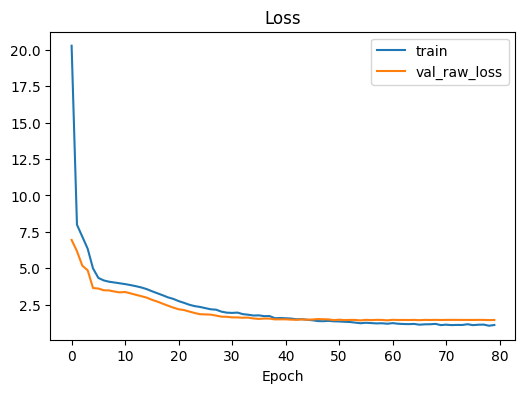

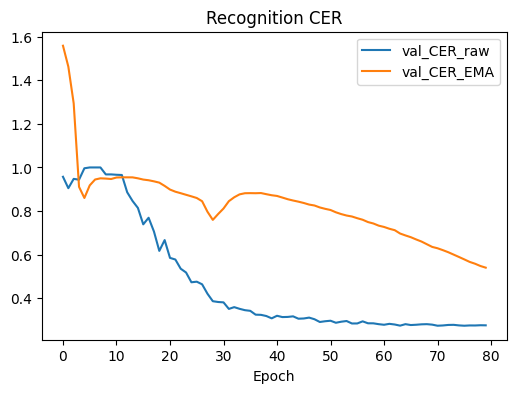

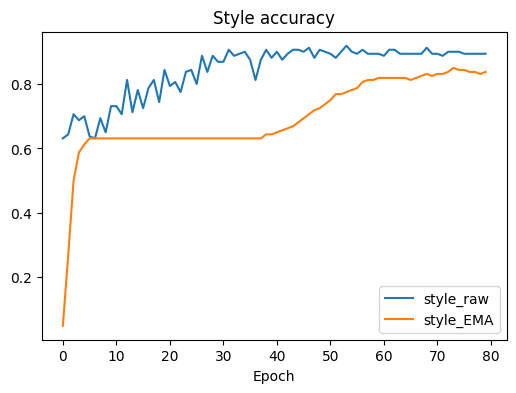

TEST(EMA) — CER=0.529 | WER=0.970 | loss=2.483 | style_acc=0.844


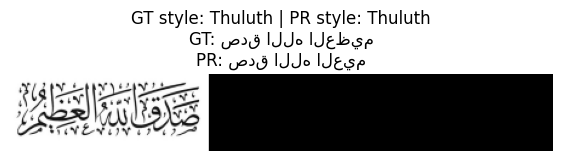

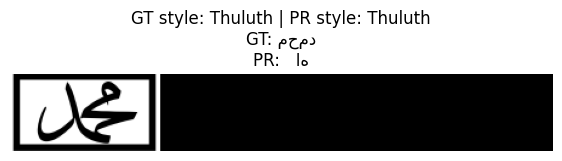

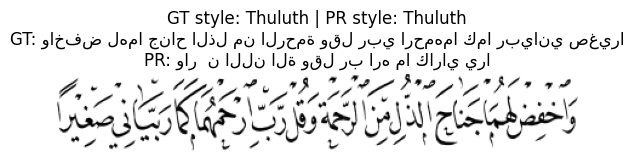

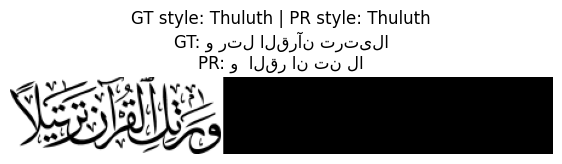

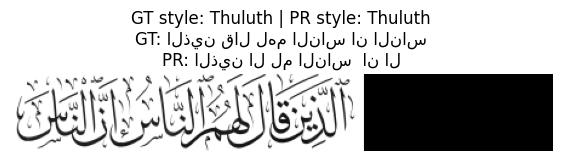

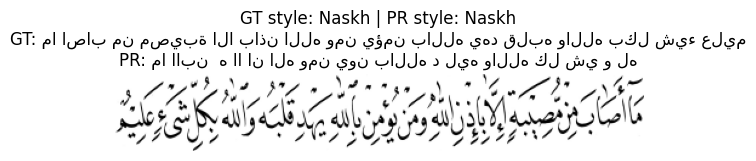

✅ Finished end-to-end (with TCN+auxCTC+EMA).


In [ ]:
# %% One-cell Colab-ready TPS-CRNN-CTC + Style Classifier (improved for lower CER, similar speed)
# ====================== Setup / Installs ======================
from google.colab import drive
drive.mount('/content/drive')
!unzip -q -o "/content/drive/MyDrive/Full_Dataset/Full_Dataset/Set1.zip" -d /content/
!pip -q install albumentations==1.4.7 editdistance==0.8.1 tqdm

# ====================== Imports ======================
import os, time, random, unicodedata, warnings, math
from pathlib import Path
from collections import Counter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2, editdistance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import albumentations as A
from torchvision import models

warnings.filterwarnings("ignore", category=UserWarning)
cv2.setNumThreads(0)

# ====================== Repro / Device ======================
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

def human(n): return f"{n:,}"
def autocast_cuda(): return torch.amp.autocast("cuda", enabled=(DEVICE=="cuda"))

# ====================== Data Paths ======================
EXTRACT_DIR = Path("/content/Set1")
IMAGES_DIR = EXTRACT_DIR / "images"
CSV_PATH   = EXTRACT_DIR / "labels_fixed.csv"
assert IMAGES_DIR.exists(), f"Images dir not found: {IMAGES_DIR}"
assert CSV_PATH.exists(),   f"CSV not found: {CSV_PATH}"
print("Images dir:", IMAGES_DIR)
print("CSV:", CSV_PATH)

# ====================== Load CSV & Basic Cleanup ======================
df = pd.read_csv(CSV_PATH)
assert {'img_name','label','class'}.issubset(df.columns), df.columns

def normalize_label(s: str) -> str:
    return unicodedata.normalize("NFC", str(s)).strip()

df['label'] = df['label'].astype(str).apply(normalize_label)
df['img_path'] = df['img_name'].apply(lambda n: str(IMAGES_DIR / n))
df = df[df['img_path'].apply(lambda p: Path(p).exists())].reset_index(drop=True)

# charset from labels
char_counts = Counter()
for s in df['label']:
    for ch in s: char_counts[ch]+=1
charset  = ['<BLANK>'] + sorted(char_counts.keys(), key=lambda c: (-char_counts[c], ord(c)))
char2idx = {c:i for i,c in enumerate(charset)}
idx2char = {i:c for c,i in char2idx.items()}
BLANK_IDX = 0
print(f"Rows: {human(len(df))} | Charset size(incl <BLANK>): {len(charset)}")

# styles
style_names = sorted(df['class'].fillna("Unknown").unique().tolist())
style2idx = {s:i for i,s in enumerate(style_names)}
idx2style = {i:s for s,i in style2idx.items()}
print(f"Styles ({len(style_names)}):", style_names)

# encode labels
RTL_REVERSE = True
def encode_label(text, rtl_reverse=True):
    if rtl_reverse: text = text[::-1]
    ids = [char2idx[ch] for ch in text if ch in char2idx and ch != '<BLANK>']
    return ids

df['enc_len'] = df['label'].apply(lambda s: len(encode_label(s, RTL_REVERSE)))
before = len(df); df = df[df['enc_len']>0].reset_index(drop=True)
print(f"Filtered empty labels: {human(before)} -> {human(len(df))}")

# ====================== Split ======================
train_df, test_df = train_test_split(
    df, test_size=0.10, random_state=SEED, stratify=df['class'].fillna("Unknown")
)
train_df, val_df  = train_test_split(
    train_df, test_size=0.1111, random_state=SEED, stratify=train_df['class'].fillna("Unknown")
)
print(f"Train: {human(len(train_df))} | Val: {human(len(val_df))} | Test: {human(len(test_df))}")

# ====================== Image & Token utils ======================
H_TARGET = 64
W_MAX    = 448
MEAN, STD = 0.5, 0.5

def decode_pred(indices, rtl_reverse=RTL_REVERSE):
    res, prev = [], None
    for idx in indices:
        if idx != BLANK_IDX and idx != prev:
            res.append(idx2char[idx])
        prev = idx
    s = "".join(res)
    return s[::-1] if rtl_reverse else s

# keep enough time-steps for CTC
MIN_PX_PER_CHAR = 6

def resize_keep_ar_enforced(gray, h=H_TARGET, label_len=0,
                            min_px_per_char=MIN_PX_PER_CHAR, min_w=16, w_max=W_MAX):
    h0, w0 = gray.shape[:2]
    base_scale = h / float(h0)
    req_w = max(min_w, min(w_max, label_len * min_px_per_char))
    scale_w = req_w / float(w0)
    scale = max(base_scale, scale_w)
    new_w = int(np.clip(np.ceil(w0 * scale), min_w, w_max))
    interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
    return cv2.resize(gray, (new_w, h), interpolation=interp)

def pad_width_to_multiple(img, multiple=4, pad_value=255):
    h, w = img.shape
    pad_w = (multiple - (w % multiple)) % multiple
    if pad_w == 0: return img
    return cv2.copyMakeBorder(img, 0, 0, 0, pad_w, cv2.BORDER_CONSTANT, value=pad_value)

# ====================== Augmentations (moderate but helpful) ======================
AUG_P = 0.30
def stroke_thickness_jitter(img, p=0.5):
    if random.random() > p: return img
    k = random.choice([1,1,2])
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*k+1, 2*k+1))
    if random.random() < 0.5: img = cv2.erode(img, kernel, iterations=1)
    else: img = cv2.dilate(img, kernel, iterations=1)
    return img

train_aug = A.Compose([
    A.ImageCompression(quality_lower=65, quality_upper=95, p=AUG_P),
    A.MotionBlur(blur_limit=3, p=AUG_P*0.8),
    A.GaussNoise(var_limit=(5.0, 20.0), p=AUG_P*0.8),
    A.Perspective(scale=(0.02, 0.06), keep_size=True, pad_mode=cv2.BORDER_REPLICATE, p=AUG_P),
    A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.02, rotate_limit=3, border_mode=cv2.BORDER_REPLICATE, p=AUG_P*0.8),
    A.CoarseDropout(max_holes=3, max_height=8, max_width=24, fill_value=255, p=AUG_P*0.6),
    A.RandomBrightnessContrast(brightness_limit=0.08, contrast_limit=0.08, p=AUG_P*0.8),
])

def apply_train_aug(img):
    img = stroke_thickness_jitter(img, p=0.5)
    return train_aug(image=img)["image"]

# ====================== Dataset / Collate ======================
class OCRDataset(Dataset):
    def __init__(self, frame: pd.DataFrame, training=True):
        self.df = frame.reset_index(drop=True)
        self.training = training
    def __len__(self): return len(self.df)
    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = cv2.imread(row['img_path'], cv2.IMREAD_GRAYSCALE)
        assert img is not None, f"Failed to read {row['img_path']}"
        label_str = row['label']
        label_ids = encode_label(label_str, RTL_REVERSE)
        style_idx = style2idx[row['class']]
        img = resize_keep_ar_enforced(img, H_TARGET, label_len=len(label_ids))
        if self.training: img = apply_train_aug(img)
        img = pad_width_to_multiple(img, multiple=4, pad_value=255)
        img = img.astype(np.float32)/255.0
        img = (img - MEAN) / STD
        img_t = torch.from_numpy(img)[None, ...]  # (1,H,W)
        return img_t, torch.tensor(label_ids, dtype=torch.long), label_str, torch.tensor(style_idx), row['class'], img_t.shape[-1]

def collate_fn(batch):
    imgs, labels, label_strs, style_idxs, style_names_b, widths = zip(*batch)
    max_w = max(widths); bsz = len(imgs)
    padded = torch.full((bsz, 1, H_TARGET, max_w), (0.0 - MEAN)/STD, dtype=torch.float32)
    for i, im in enumerate(imgs):
        w = im.shape[-1]
        padded[i, :, :, :w] = im
    label_lens = torch.tensor([len(l) for l in labels], dtype=torch.long)
    labels_concat = torch.cat(labels, dim=0) if len(labels) and sum(label_lens).item()>0 else torch.tensor([], dtype=torch.long)
    return padded, labels_concat, label_lens, label_strs, torch.stack(style_idxs), style_names_b, torch.tensor(widths, dtype=torch.long)

# ====================== Model ======================
try:
    _IMAGENET_WEIGHTS = models.ResNet34_Weights.IMAGENET1K_V1
except Exception:
    _IMAGENET_WEIGHTS = "IMAGENET1K_V1"

class ResNet34OCRFeaturePretrained(nn.Module):
    def __init__(self, in_ch=1):
        super().__init__()
        try:
            m = models.resnet34(weights=_IMAGENET_WEIGHTS)
        except TypeError:
            m = models.resnet34(pretrained=True)
        with torch.no_grad():
            w = m.conv1.weight.data
            new_w = w.mean(dim=1, keepdim=True)
        m.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=(2,1), padding=3, bias=False)
        with torch.no_grad():
            m.conv1.weight.copy_(new_w)
        m.maxpool = nn.MaxPool2d(kernel_size=3, stride=(2,1), padding=1)
        def set_layer_height_only(layer):
            b0 = layer[0]
            b0.conv1.stride = (2,1)
            if b0.downsample is not None and isinstance(b0.downsample, nn.Sequential):
                ds0 = b0.downsample[0]
                if isinstance(ds0, nn.Conv2d): ds0.stride = (2,1)
        set_layer_height_only(m.layer2); set_layer_height_only(m.layer3); set_layer_height_only(m.layer4)

        self.stem   = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1 = m.layer1
        self.layer2 = m.layer2
        self.layer3 = m.layer3
        self.layer4 = m.layer4
        self.out    = nn.AdaptiveAvgPool2d((1, None))  # collapse height

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x); x = self.layer2(x); x = self.layer3(x); x = self.layer4(x)
        fmap = x                                          # (B, 512, H', W)
        seq  = self.out(fmap).squeeze(2).permute(2,0,1)   # (T=W, B, 512)
        return seq, fmap

class TemporalGLUBlock(nn.Module):
    """Lightweight temporal conv with GLU gating."""
    def __init__(self, c=512, k=5, dilation=1, p=0.1):
        super().__init__()
        pad = (k-1)//2 * dilation
        self.conv = nn.Conv1d(c, 2*c, kernel_size=k, padding=pad, dilation=dilation)
        self.glu  = nn.GLU(dim=1)   # halves channels back to c
        self.drop = nn.Dropout(p)
        self.res  = nn.Conv1d(c, c, kernel_size=1)  # identity adapter
    def forward(self, x):            # x: (T,B,C)
        x = x.permute(1,2,0)         # (B,C,T)
        y = self.glu(self.conv(x))
        y = self.drop(y) + self.res(x)
        return y.permute(2,0,1)      # (T,B,C)

class BiLSTMStack(nn.Module):
    def __init__(self, in_dim, hidden=256, num_layers=2, dropout=0.2):
        super().__init__()
        layers=[]
        for i in range(num_layers):
            inp = in_dim if i==0 else hidden*2
            layers.append(nn.LSTM(inp, hidden, bidirectional=True, batch_first=False, dropout=0.0))
            layers.append(nn.Dropout(dropout))
        self.layers = nn.ModuleList(layers)
    def forward(self, x):
        for i in range(0,len(self.layers),2):
            x,_ = self.layers[i](x); x = self.layers[i+1](x)
        return x

class OCR_MultiTask_V2(nn.Module):
    """
    Shared CNN -> sequence.
    + Light TCN (GLU) -> BiLSTM.
    Head 1: main CTC (after BiLSTM).
    Head 1a: aux CTC (on pre-LSTM temporal conv output).
    Head 2: Style classification (global pool), with reduced gradient pressure.
    """
    def __init__(self, num_chars, num_styles, blank_idx=0, aux_ctc_weight=0.3):
        super().__init__()
        self.backbone = ResNet34OCRFeaturePretrained(in_ch=1)
        self.tcn1 = TemporalGLUBlock(512, k=5, dilation=1, p=0.1)
        self.tcn2 = TemporalGLUBlock(512, k=5, dilation=2, p=0.1)
        self.seq  = BiLSTMStack(in_dim=512, hidden=256, num_layers=2, dropout=0.25)
        self.ctc_head_main = nn.Linear(512, num_chars)
        self.ctc_head_aux  = nn.Linear(512, num_chars)
        self.style_head = nn.Sequential(
            nn.AdaptiveAvgPool2d((1,1)), nn.Flatten(),
            nn.Dropout(0.25),
            nn.Linear(512, max(256, num_styles*4)), nn.ReLU(True),
            nn.Linear(max(256, num_styles*4), num_styles)
        )
        self.blank_idx = blank_idx
        self.aux_ctc_weight = aux_ctc_weight
        with torch.no_grad():
            self.ctc_head_main.bias.zero_(); self.ctc_head_main.bias[blank_idx] = -2.0
            self.ctc_head_aux.bias.zero_();  self.ctc_head_aux.bias[blank_idx]  = -2.0

    def forward(self, x):
        seq_feats, fmap = self.backbone(x)  # seq_feats: (T,B,512)
        pre_lstm = self.tcn2(self.tcn1(seq_feats))        # (T,B,512)
        lstm_out = self.seq(pre_lstm)                     # (T,B,512)
        ctc_logits_main = self.ctc_head_main(lstm_out)    # (T,B,C)
        ctc_logits_aux  = self.ctc_head_aux(pre_lstm)     # (T,B,C)
        style_logits = self.style_head(fmap.detach())     # detach: lighter gradient conflict
        return ctc_logits_main, ctc_logits_aux, style_logits

# ====================== Dataloaders & Losses ======================
BATCH_SIZE   = 64
EPOCHS       = 80                  # keep similar total time / convergence
INIT_LR_HEAD = 8e-4
INIT_LR_BB   = 2e-4
WEIGHT_DECAY = 1e-4
MAX_NORM     = 1.0
LAMBDA_CLS   = 0.2                 # gentler style weight

train_ds = OCRDataset(train_df, training=True)
val_ds   = OCRDataset(val_df,   training=False)
test_ds  = OCRDataset(test_df,  training=False)

NUM_WORKERS = 2
loader_kwargs = dict(collate_fn=collate_fn, pin_memory=True, num_workers=NUM_WORKERS, persistent_workers=False)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  **loader_kwargs)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)

num_chars  = len(charset)
num_styles = len(style_names)
model = OCR_MultiTask_V2(num_chars, num_styles, blank_idx=BLANK_IDX, aux_ctc_weight=0.3).to(DEVICE)

ctc_loss  = nn.CTCLoss(blank=BLANK_IDX, reduction='mean', zero_infinity=True)
cls_loss  = nn.CrossEntropyLoss(label_smoothing=0.05)

# param groups
bb_params   = list(model.backbone.parameters())
mid_params  = list(model.tcn1.parameters()) + list(model.tcn2.parameters()) + list(model.seq.parameters())
head_params = list(model.ctc_head_main.parameters()) + list(model.ctc_head_aux.parameters()) + list(model.style_head.parameters())
optimizer = torch.optim.AdamW(
    [{"params": bb_params,   "lr": INIT_LR_BB},
     {"params": mid_params,  "lr": INIT_LR_HEAD},
     {"params": head_params, "lr": INIT_LR_HEAD}],
    weight_decay=WEIGHT_DECAY
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)
scaler    = torch.amp.GradScaler("cuda", enabled=(DEVICE=="cuda"))

total_params = sum(p.numel() for p in model.parameters())
print(f"Parameters: {human(total_params)}")

def ctc_time_lengths(widths): return torch.clamp(widths, min=1)

# ====================== EMA (evaluation / saving uses EMA) ======================
class EMA:
    def __init__(self, model, decay=0.999):
        self.decay = decay
        self.shadow = {k: v.detach().clone() for k,v in model.state_dict().items()}
    @torch.no_grad()
    def update(self, model):
        for k, v in model.state_dict().items():
            if v.dtype.is_floating_point:
                self.shadow[k].mul_(self.decay).add_(v, alpha=1.0 - self.decay)
            else:
                self.shadow[k] = v.clone()
    def apply_to(self, model):
        self._backup = {k: v.clone() for k,v in model.state_dict().items()}
        model.load_state_dict(self.shadow, strict=False)
    def restore(self, model):
        model.load_state_dict(self._backup, strict=False); del self._backup

ema = EMA(model, decay=0.999)

# ====================== Decoding & Metrics ======================
@torch.no_grad()
def greedy_decode_ctc(logits, out_lens):
    max_idxs = logits.softmax(dim=-1).argmax(dim=-1)  # (T,B)
    T,B = max_idxs.shape
    dec=[]
    for b in range(B):
        L = int(out_lens[b])
        seq = max_idxs[:L, b].tolist()
        dec.append(decode_pred(seq))
    return dec

def cer(ref, hyp):
    return 0.0 if (len(ref)==0 and len(hyp)==0) else editdistance.eval(ref, hyp)/max(1,len(ref))
def wer(ref, hyp):
    r, h = ref.split(), hyp.split()
    return 0.0 if (len(r)==0 and len(h)==0) else editdistance.eval(r, h)/max(1,len(r))

# ====================== Eval (recognition + style) ======================
@torch.no_grad()
def evaluate(model, loader, use_ema=False):
    if use_ema: ema.apply_to(model)
    model.eval()
    tot_loss = tot_cer = tot_wer = 0.0; cnt = 0
    cls_correct = 0; cls_total = 0
    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in loader:
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)

        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)

        # losses
        if len(labels_concat)>0:
            loss_ctc_main = ctc_loss(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
            log_probs_aux  = ctc_logits_aux.log_softmax(2)
            loss_ctc_aux   = ctc_loss(log_probs_aux.float(),  labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
        else:
            loss_ctc_main = torch.tensor(0., device=DEVICE)
            loss_ctc_aux  = torch.tensor(0., device=DEVICE)
        loss_cls = cls_loss(style_logits, style_idxs)
        loss = loss_ctc_main + 0.1*loss_ctc_aux + LAMBDA_CLS*loss_cls

        B = imgs.size(0); tot_loss += loss.item()*B; cnt += B

        # recognition metrics
        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr); tot_wer += wer(gt, pr)

        # style accuracy
        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total   += B
    if use_ema: ema.restore(model)
    return {
        "loss": (tot_loss/cnt) if cnt else None,
        "cer":  (tot_cer/cnt) if cnt else None,
        "wer":  (tot_wer/cnt) if cnt else None,
        "style_acc": (cls_correct/cls_total) if cls_total>0 else None
    }

# ====================== Warmup & Train ======================
for p in model.backbone.parameters(): p.requires_grad = False
print("Backbone frozen for warmup epoch.")

SAVE_DIR = Path("./checkpoints"); SAVE_DIR.mkdir(parents=True, exist_ok=True)
BEST_PATH = SAVE_DIR / "ocr_multitask_best_ema.pt"
history = {"train_loss": [], "val_loss": [], "val_cer_raw": [], "val_cer_ema": [], "val_style_acc_raw": [], "val_style_acc_ema": []}
best_cer_ema = float('inf')

def gpu_mem():
    if DEVICE=="cuda":
        a = torch.cuda.memory_allocated()/1e9; r = torch.cuda.memory_reserved()/1e9
        return f"GPU: alloc={a:.2f}G resv={r:.2f}G"
    return "CPU"

print(f"[Train] epochs={EPOCHS}, batches/epoch={len(train_loader)}, device={DEVICE}")
for epoch in range(1, EPOCHS+1):
    model.train()
    running = 0.0; seen = 0
    t0 = time.time()

    # unfreeze backbone after first epoch
    if epoch == 2:
        for p in model.backbone.parameters(): p.requires_grad = True
        print("Backbone unfrozen.")

    pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch:02d}", leave=False)
    for bidx, (imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths) in pbar:
        imgs = imgs.to(DEVICE, non_blocking=True)
        style_idxs = style_idxs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)

        optimizer.zero_grad(set_to_none=True)
        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)
            if len(labels_concat)>0:
                loss_ctc_main = ctc_loss(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
                log_probs_aux  = ctc_logits_aux.log_softmax(2)
                loss_ctc_aux   = ctc_loss(log_probs_aux.float(),  labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
            else:
                loss_ctc_main = torch.tensor(0., device=DEVICE)
                loss_ctc_aux  = torch.tensor(0., device=DEVICE)
            loss_cls = cls_loss(style_logits, style_idxs)
            loss = loss_ctc_main + model.aux_ctc_weight*loss_ctc_aux + LAMBDA_CLS*loss_cls

        scaler.scale(loss).backward()
        nn.utils.clip_grad_norm_(model.parameters(), MAX_NORM)
        scaler.step(optimizer); scaler.update()
        ema.update(model)

        running += loss.item() * imgs.size(0); seen += imgs.size(0)
        pbar.set_postfix(loss=f"{loss.item():.3f}", avg=f"{(running/max(1,seen)):.3f}")

    scheduler.step()
    train_loss = running / max(1, seen)
    history["train_loss"].append(train_loss)

    # validation — report RAW and EMA
    val_raw  = evaluate(model, val_loader, use_ema=False)
    val_ema  = evaluate(model, val_loader, use_ema=True)
    history["val_loss"].append(val_raw["loss"])
    history["val_cer_raw"].append(val_raw["cer"])
    history["val_cer_ema"].append(val_ema["cer"])
    history["val_style_acc_raw"].append(val_raw["style_acc"])
    history["val_style_acc_ema"].append(val_ema["style_acc"])

    dt = time.time()-t0
    print(f"Epoch {epoch:02d}/{EPOCHS} | train={train_loss:.3f} | "
          f"val_raw: loss={val_raw['loss']:.3f} CER={val_raw['cer']:.3f} WER={val_raw['wer']:.3f} style={val_raw['style_acc']:.3f} | "
          f"val_EMA: CER={val_ema['cer']:.3f} WER={val_ema['wer']:.3f} style={val_ema['style_acc']:.3f} | "
          f"{dt:.1f}s | {gpu_mem()}")

    if val_ema["cer"] is not None and val_ema["cer"] < best_cer_ema:
        best_cer_ema = val_ema["cer"]
        # save EMA weights + metadata
        ema.apply_to(model)
        torch.save({
            "model": model.state_dict(),
            "charset": charset, "style_names": style_names,
            "config": {"H_TARGET": H_TARGET, "RTL_REVERSE": RTL_REVERSE}
        }, BEST_PATH)
        ema.restore(model)
        print(f"  ↳ New best EMA CER={best_cer_ema:.4f} — saved to {BEST_PATH}")

print("[Train] Done.")

# ====================== Curves ======================
plt.figure(figsize=(6,4)); plt.plot(history["train_loss"], label="train"); plt.plot(history["val_loss"], label="val_raw_loss")
plt.title("Loss"); plt.xlabel("Epoch"); plt.legend(); plt.show()

plt.figure(figsize=(6,4)); plt.plot(history["val_cer_raw"], label="val_CER_raw"); plt.plot(history["val_cer_ema"], label="val_CER_EMA")
plt.title("Recognition CER"); plt.xlabel("Epoch"); plt.legend(); plt.show()

plt.figure(figsize=(6,4)); plt.plot(history["val_style_acc_raw"], label="style_raw"); plt.plot(history["val_style_acc_ema"], label="style_EMA")
plt.title("Style accuracy"); plt.xlabel("Epoch"); plt.legend(); plt.show()

# ====================== Test Evaluation (EMA weights) ======================
ckpt = torch.load(BEST_PATH, map_location=DEVICE)
model.load_state_dict(ckpt["model"], strict=False); model.eval()

@torch.no_grad()
def evaluate_simple(model, loader):
    model.eval()
    tot_cer = tot_wer = 0.0; cnt = 0
    tot_loss = 0.0; cls_correct=0; cls_total=0
    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in loader:
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)
        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)
        if len(labels_concat)>0:
            loss_ctc = ctc_loss(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
        else:
            loss_ctc = torch.tensor(0., device=DEVICE)
        loss = loss_ctc + LAMBDA_CLS*cls_loss(style_logits, style_idxs)
        B = imgs.size(0)
        tot_loss += loss.item()*B; cnt += B

        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr); tot_wer += wer(gt, pr)

        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total   += B
    return {
        "loss": (tot_loss/cnt) if cnt else None,
        "cer":  (tot_cer/cnt) if cnt else None,
        "wer":  (tot_wer/cnt) if cnt else None,
        "style_acc": (cls_correct/cls_total) if cls_total>0 else None
    }

test_metrics = evaluate_simple(model, test_loader)
print(f"TEST(EMA) — CER={test_metrics['cer']:.3f} | WER={test_metrics['wer']:.3f} | "
      f"loss={test_metrics['loss']:.3f} | style_acc={test_metrics['style_acc']:.3f}")

# ====================== Qualitative Samples ======================
@torch.no_grad()
def show_samples(model, loader, k=6):
    model.eval()
    imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths = next(iter(loader))
    imgs = imgs.to(DEVICE)
    ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
    preds = greedy_decode_ctc(ctc_logits_main, ctc_time_lengths(widths))
    style_pred = style_logits.softmax(1).argmax(1).cpu().tolist()
    for i in range(min(k, imgs.size(0))):
        im = imgs[i,0].cpu().numpy()
        im = np.clip(im*STD + MEAN, 0, 1)
        plt.figure(figsize=(7,2))
        plt.imshow(im, cmap='gray'); plt.axis('off')
        gt_style = style_names_b[i]
        pr_style = idx2style[style_pred[i]]
        plt.title(f"GT style: {gt_style} | PR style: {pr_style}\nGT: {label_strs[i]}\nPR: {preds[i]}")
        plt.show()

show_samples(model, test_loader, k=6)
print("✅ Finished end-to-end (with TCN+auxCTC+EMA).")


## Attempt 2 (more epochs)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Device: cuda
Images dir: /content/Set1/images
CSV: /content/Set1/labels_fixed.csv
Rows: 1,598 | Charset size(incl <BLANK>): 48
Styles (5): ['Diwani', 'Kufic', 'Muhaquaq', 'Naskh', 'Thuluth']
Filtered empty labels: 1,598 -> 1,598
Train: 1,278 | Val: 160 | Test: 160
Parameters: 30,384,421
Backbone frozen for warmup epoch.
[Train] epochs=200, batches/epoch=20, device=cuda


Epoch 01:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 01/200 | train=20.569 | val: loss=6.635 CER=0.957 WER=1.000 style=0.631 | 10.2s | GPU: alloc=1.44G resv=7.96G
  ↳ New best RAW CER=0.9571 — saved to checkpoints/ocr_multitask_best_raw.pt
Backbone unfrozen.


Epoch 02:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 02/200 | train=7.349 | val: loss=5.577 CER=0.956 WER=1.000 style=0.631 | 13.4s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.9561 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 03:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 03/200 | train=6.592 | val: loss=5.041 CER=0.924 WER=1.000 style=0.706 | 13.4s | GPU: alloc=1.70G resv=8.28G
  ↳ New best RAW CER=0.9240 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 04:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 04/200 | train=4.897 | val: loss=3.733 CER=1.000 WER=1.000 style=0.700 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 05:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 05/200 | train=4.203 | val: loss=3.507 CER=1.000 WER=1.000 style=0.713 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 06:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 06/200 | train=4.088 | val: loss=3.479 CER=1.000 WER=1.000 style=0.706 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 07:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 07/200 | train=4.009 | val: loss=3.367 CER=1.000 WER=1.000 style=0.738 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 08:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 08/200 | train=3.944 | val: loss=3.311 CER=1.000 WER=1.000 style=0.825 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 09:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 09/200 | train=3.836 | val: loss=3.157 CER=1.000 WER=1.000 style=0.869 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 10:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 10/200 | train=3.681 | val: loss=3.077 CER=0.991 WER=1.000 style=0.806 | 13.4s | GPU: alloc=1.71G resv=8.28G


Epoch 11:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 11/200 | train=3.541 | val: loss=2.865 CER=0.859 WER=1.000 style=0.744 | 13.0s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.8589 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 12:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 12/200 | train=3.331 | val: loss=2.752 CER=0.782 WER=0.999 style=0.719 | 13.1s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.7822 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 13:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 13/200 | train=3.163 | val: loss=2.535 CER=0.771 WER=0.999 style=0.844 | 13.5s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.7713 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 14:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 14/200 | train=3.034 | val: loss=2.335 CER=0.732 WER=0.996 style=0.825 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.7322 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 15:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 15/200 | train=2.859 | val: loss=2.318 CER=0.699 WER=0.985 style=0.831 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.6991 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 16:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 16/200 | train=2.725 | val: loss=2.143 CER=0.612 WER=0.967 style=0.869 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.6121 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 17:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 17/200 | train=2.551 | val: loss=2.051 CER=0.601 WER=0.966 style=0.900 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.6013 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 18:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 18/200 | train=2.467 | val: loss=1.955 CER=0.577 WER=0.966 style=0.844 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.5771 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 19:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 19/200 | train=2.360 | val: loss=1.929 CER=0.488 WER=0.919 style=0.850 | 13.0s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.4876 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 20:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 20/200 | train=2.319 | val: loss=1.853 CER=0.452 WER=0.903 style=0.869 | 13.0s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.4515 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 21:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 21/200 | train=2.198 | val: loss=1.805 CER=0.455 WER=0.889 style=0.838 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 22:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 22/200 | train=2.171 | val: loss=1.717 CER=0.425 WER=0.855 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.4247 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 23:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 23/200 | train=2.103 | val: loss=1.729 CER=0.387 WER=0.829 style=0.787 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.3874 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 24:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 24/200 | train=2.032 | val: loss=1.690 CER=0.413 WER=0.806 style=0.863 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 25:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 25/200 | train=1.993 | val: loss=1.706 CER=0.405 WER=0.801 style=0.887 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 26:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 26/200 | train=1.949 | val: loss=1.599 CER=0.372 WER=0.789 style=0.863 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.3719 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 27:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 27/200 | train=1.880 | val: loss=1.561 CER=0.363 WER=0.756 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.3629 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 28:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 28/200 | train=1.878 | val: loss=1.557 CER=0.335 WER=0.737 style=0.856 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.3348 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 29:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 29/200 | train=1.798 | val: loss=1.554 CER=0.353 WER=0.730 style=0.875 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 30:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 30/200 | train=1.771 | val: loss=1.530 CER=0.345 WER=0.737 style=0.887 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 31:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 31/200 | train=1.736 | val: loss=1.525 CER=0.340 WER=0.707 style=0.856 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 32:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 32/200 | train=1.714 | val: loss=1.561 CER=0.340 WER=0.708 style=0.856 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 33:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 33/200 | train=1.688 | val: loss=1.458 CER=0.317 WER=0.677 style=0.881 | 13.6s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.3168 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 34:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 34/200 | train=1.692 | val: loss=1.515 CER=0.341 WER=0.706 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 35:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 35/200 | train=1.617 | val: loss=1.516 CER=0.307 WER=0.680 style=0.881 | 12.9s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.3066 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 36:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 36/200 | train=1.583 | val: loss=1.480 CER=0.298 WER=0.670 style=0.900 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2984 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 37:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 37/200 | train=1.623 | val: loss=1.523 CER=0.325 WER=0.685 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 38:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 38/200 | train=1.539 | val: loss=1.479 CER=0.308 WER=0.664 style=0.831 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 39:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 39/200 | train=1.546 | val: loss=1.456 CER=0.318 WER=0.691 style=0.844 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 40:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 40/200 | train=1.527 | val: loss=1.484 CER=0.305 WER=0.666 style=0.875 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 41:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 41/200 | train=1.484 | val: loss=1.539 CER=0.320 WER=0.679 style=0.838 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 42:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 42/200 | train=1.429 | val: loss=1.502 CER=0.308 WER=0.667 style=0.875 | 13.5s | GPU: alloc=1.71G resv=8.28G


Epoch 43:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 43/200 | train=1.451 | val: loss=1.459 CER=0.305 WER=0.654 style=0.838 | 12.9s | GPU: alloc=1.71G resv=8.28G


Epoch 44:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 44/200 | train=1.429 | val: loss=1.439 CER=0.301 WER=0.658 style=0.863 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 45:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 45/200 | train=1.412 | val: loss=1.471 CER=0.297 WER=0.660 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2967 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 46:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 46/200 | train=1.355 | val: loss=1.435 CER=0.286 WER=0.619 style=0.812 | 13.4s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2856 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 47:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 47/200 | train=1.374 | val: loss=1.463 CER=0.303 WER=0.640 style=0.887 | 12.9s | GPU: alloc=1.71G resv=8.28G


Epoch 48:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 48/200 | train=1.349 | val: loss=1.438 CER=0.298 WER=0.627 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 49:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 49/200 | train=1.344 | val: loss=1.520 CER=0.290 WER=0.647 style=0.812 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 50:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 50/200 | train=1.306 | val: loss=1.437 CER=0.288 WER=0.609 style=0.906 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 51:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 51/200 | train=1.321 | val: loss=1.448 CER=0.282 WER=0.623 style=0.819 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2817 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 52:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 52/200 | train=1.279 | val: loss=1.444 CER=0.279 WER=0.626 style=0.906 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2794 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 53:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 53/200 | train=1.258 | val: loss=1.488 CER=0.274 WER=0.616 style=0.887 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2737 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 54:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 54/200 | train=1.251 | val: loss=1.485 CER=0.287 WER=0.616 style=0.831 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 55:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 55/200 | train=1.245 | val: loss=1.443 CER=0.280 WER=0.626 style=0.900 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 56:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 56/200 | train=1.257 | val: loss=1.443 CER=0.284 WER=0.628 style=0.831 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 57:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 57/200 | train=1.196 | val: loss=1.457 CER=0.282 WER=0.592 style=0.906 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 58:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 58/200 | train=1.234 | val: loss=1.475 CER=0.278 WER=0.610 style=0.831 | 12.9s | GPU: alloc=1.71G resv=8.28G


Epoch 59:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 59/200 | train=1.177 | val: loss=1.478 CER=0.273 WER=0.621 style=0.831 | 12.8s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2731 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 60:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 60/200 | train=1.227 | val: loss=1.437 CER=0.273 WER=0.598 style=0.869 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2729 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 61:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 61/200 | train=1.173 | val: loss=1.424 CER=0.276 WER=0.588 style=0.869 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 62:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 62/200 | train=1.119 | val: loss=1.471 CER=0.278 WER=0.586 style=0.900 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 63:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 63/200 | train=1.133 | val: loss=1.423 CER=0.269 WER=0.602 style=0.887 | 13.0s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2691 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 64:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 64/200 | train=1.140 | val: loss=1.490 CER=0.272 WER=0.612 style=0.838 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 65:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 65/200 | train=1.149 | val: loss=1.503 CER=0.277 WER=0.598 style=0.881 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 66:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 66/200 | train=1.138 | val: loss=1.492 CER=0.271 WER=0.597 style=0.900 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 67:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 67/200 | train=1.153 | val: loss=1.427 CER=0.268 WER=0.616 style=0.881 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2683 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 68:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 68/200 | train=1.126 | val: loss=1.484 CER=0.272 WER=0.593 style=0.831 | 13.7s | GPU: alloc=1.71G resv=8.28G


Epoch 69:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 69/200 | train=1.105 | val: loss=1.419 CER=0.258 WER=0.574 style=0.856 | 13.1s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2578 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 70:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 70/200 | train=1.139 | val: loss=1.502 CER=0.274 WER=0.593 style=0.900 | 13.5s | GPU: alloc=1.71G resv=8.28G


Epoch 71:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 71/200 | train=1.113 | val: loss=1.492 CER=0.270 WER=0.581 style=0.875 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 72:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 72/200 | train=1.074 | val: loss=1.531 CER=0.272 WER=0.590 style=0.881 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 73:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 73/200 | train=1.010 | val: loss=1.469 CER=0.269 WER=0.589 style=0.856 | 12.9s | GPU: alloc=1.71G resv=8.28G


Epoch 74:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 74/200 | train=1.073 | val: loss=1.502 CER=0.269 WER=0.606 style=0.819 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 75:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 75/200 | train=1.034 | val: loss=1.472 CER=0.259 WER=0.588 style=0.863 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 76:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 76/200 | train=1.040 | val: loss=1.492 CER=0.268 WER=0.582 style=0.875 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 77:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 77/200 | train=1.007 | val: loss=1.508 CER=0.268 WER=0.585 style=0.844 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 78:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 78/200 | train=1.055 | val: loss=1.549 CER=0.266 WER=0.601 style=0.844 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 79:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 79/200 | train=1.015 | val: loss=1.509 CER=0.264 WER=0.580 style=0.831 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 80:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 80/200 | train=1.061 | val: loss=1.468 CER=0.255 WER=0.582 style=0.831 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2548 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 81:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 81/200 | train=1.017 | val: loss=1.504 CER=0.262 WER=0.600 style=0.863 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 82:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 82/200 | train=0.978 | val: loss=1.520 CER=0.261 WER=0.569 style=0.856 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 83:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 83/200 | train=1.002 | val: loss=1.529 CER=0.258 WER=0.564 style=0.838 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 84:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 84/200 | train=0.977 | val: loss=1.512 CER=0.263 WER=0.578 style=0.838 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 85:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 85/200 | train=0.942 | val: loss=1.491 CER=0.263 WER=0.579 style=0.838 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 86:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 86/200 | train=0.952 | val: loss=1.483 CER=0.256 WER=0.560 style=0.838 | 13.4s | GPU: alloc=1.71G resv=8.28G


Epoch 87:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 87/200 | train=0.931 | val: loss=1.489 CER=0.252 WER=0.556 style=0.838 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2518 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 88:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 88/200 | train=0.930 | val: loss=1.464 CER=0.257 WER=0.566 style=0.831 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 89:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 89/200 | train=0.940 | val: loss=1.480 CER=0.255 WER=0.552 style=0.906 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 90:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 90/200 | train=0.953 | val: loss=1.535 CER=0.259 WER=0.568 style=0.900 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 91:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 91/200 | train=0.954 | val: loss=1.509 CER=0.258 WER=0.570 style=0.906 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 92:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 92/200 | train=0.951 | val: loss=1.505 CER=0.260 WER=0.568 style=0.875 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 93:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 93/200 | train=0.882 | val: loss=1.465 CER=0.257 WER=0.569 style=0.844 | 13.6s | GPU: alloc=1.71G resv=8.28G


Epoch 94:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 94/200 | train=0.937 | val: loss=1.485 CER=0.253 WER=0.579 style=0.825 | 13.5s | GPU: alloc=1.71G resv=8.28G


Epoch 95:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 95/200 | train=0.892 | val: loss=1.463 CER=0.252 WER=0.556 style=0.856 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 96:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 96/200 | train=0.932 | val: loss=1.535 CER=0.258 WER=0.562 style=0.838 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 97:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 97/200 | train=0.884 | val: loss=1.496 CER=0.255 WER=0.556 style=0.869 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 98:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 98/200 | train=0.919 | val: loss=1.532 CER=0.253 WER=0.547 style=0.863 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 99:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 99/200 | train=0.868 | val: loss=1.508 CER=0.250 WER=0.552 style=0.831 | 13.1s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2504 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 100:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 100/200 | train=0.871 | val: loss=1.446 CER=0.241 WER=0.551 style=0.863 | 13.5s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2412 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 101:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 101/200 | train=0.854 | val: loss=1.502 CER=0.252 WER=0.566 style=0.869 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 102:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 102/200 | train=0.808 | val: loss=1.477 CER=0.247 WER=0.544 style=0.863 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 103:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 103/200 | train=0.888 | val: loss=1.490 CER=0.244 WER=0.541 style=0.869 | 12.9s | GPU: alloc=1.71G resv=8.28G


Epoch 104:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 104/200 | train=0.838 | val: loss=1.492 CER=0.245 WER=0.545 style=0.844 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 105:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 105/200 | train=0.759 | val: loss=1.503 CER=0.245 WER=0.549 style=0.875 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 106:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 106/200 | train=0.753 | val: loss=1.491 CER=0.249 WER=0.555 style=0.887 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 107:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 107/200 | train=0.769 | val: loss=1.513 CER=0.248 WER=0.551 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 108:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 108/200 | train=0.828 | val: loss=1.520 CER=0.249 WER=0.549 style=0.887 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 109:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 109/200 | train=0.797 | val: loss=1.517 CER=0.247 WER=0.534 style=0.869 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 110:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 110/200 | train=0.804 | val: loss=1.490 CER=0.244 WER=0.530 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 111:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 111/200 | train=0.824 | val: loss=1.530 CER=0.246 WER=0.538 style=0.850 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 112:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 112/200 | train=0.785 | val: loss=1.502 CER=0.246 WER=0.546 style=0.881 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 113:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 113/200 | train=0.817 | val: loss=1.518 CER=0.243 WER=0.546 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 114:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 114/200 | train=0.767 | val: loss=1.549 CER=0.249 WER=0.558 style=0.887 | 13.5s | GPU: alloc=1.71G resv=8.28G


Epoch 115:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 115/200 | train=0.783 | val: loss=1.520 CER=0.246 WER=0.550 style=0.875 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 116:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 116/200 | train=0.798 | val: loss=1.531 CER=0.244 WER=0.541 style=0.863 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 117:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 117/200 | train=0.795 | val: loss=1.542 CER=0.244 WER=0.547 style=0.869 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 118:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 118/200 | train=0.755 | val: loss=1.532 CER=0.242 WER=0.541 style=0.887 | 13.4s | GPU: alloc=1.71G resv=8.28G


Epoch 119:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 119/200 | train=0.757 | val: loss=1.525 CER=0.238 WER=0.545 style=0.875 | 13.3s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2381 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 120:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 120/200 | train=0.719 | val: loss=1.527 CER=0.243 WER=0.549 style=0.869 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 121:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 121/200 | train=0.799 | val: loss=1.581 CER=0.242 WER=0.539 style=0.863 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 122:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 122/200 | train=0.760 | val: loss=1.562 CER=0.243 WER=0.539 style=0.869 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 123:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 123/200 | train=0.747 | val: loss=1.564 CER=0.240 WER=0.537 style=0.856 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 124:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 124/200 | train=0.726 | val: loss=1.572 CER=0.237 WER=0.554 style=0.856 | 13.0s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2368 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 125:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 125/200 | train=0.777 | val: loss=1.541 CER=0.239 WER=0.547 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 126:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 126/200 | train=0.729 | val: loss=1.559 CER=0.241 WER=0.531 style=0.881 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 127:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 127/200 | train=0.742 | val: loss=1.546 CER=0.235 WER=0.534 style=0.881 | 13.1s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2348 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 128:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 128/200 | train=0.761 | val: loss=1.512 CER=0.238 WER=0.541 style=0.875 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 129:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 129/200 | train=0.732 | val: loss=1.523 CER=0.239 WER=0.536 style=0.881 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 130:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 130/200 | train=0.749 | val: loss=1.516 CER=0.243 WER=0.538 style=0.850 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 131:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 131/200 | train=0.728 | val: loss=1.548 CER=0.235 WER=0.538 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 132:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 132/200 | train=0.710 | val: loss=1.573 CER=0.242 WER=0.540 style=0.856 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 133:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 133/200 | train=0.714 | val: loss=1.574 CER=0.242 WER=0.548 style=0.856 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 134:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 134/200 | train=0.760 | val: loss=1.565 CER=0.239 WER=0.549 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 135:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 135/200 | train=0.727 | val: loss=1.539 CER=0.237 WER=0.534 style=0.850 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 136:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 136/200 | train=0.682 | val: loss=1.551 CER=0.239 WER=0.548 style=0.906 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 137:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 137/200 | train=0.741 | val: loss=1.567 CER=0.237 WER=0.537 style=0.869 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 138:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 138/200 | train=0.739 | val: loss=1.543 CER=0.236 WER=0.520 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 139:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 139/200 | train=0.705 | val: loss=1.574 CER=0.239 WER=0.528 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 140:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 140/200 | train=0.765 | val: loss=1.530 CER=0.235 WER=0.522 style=0.856 | 13.4s | GPU: alloc=1.71G resv=8.28G


Epoch 141:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 141/200 | train=0.713 | val: loss=1.557 CER=0.238 WER=0.519 style=0.887 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 142:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 142/200 | train=0.773 | val: loss=1.557 CER=0.239 WER=0.524 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 143:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 143/200 | train=0.694 | val: loss=1.572 CER=0.238 WER=0.533 style=0.875 | 13.4s | GPU: alloc=1.71G resv=8.28G


Epoch 144:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 144/200 | train=0.727 | val: loss=1.571 CER=0.239 WER=0.526 style=0.875 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 145:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 145/200 | train=0.715 | val: loss=1.568 CER=0.234 WER=0.524 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2344 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 146:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 146/200 | train=0.755 | val: loss=1.588 CER=0.240 WER=0.530 style=0.863 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 147:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 147/200 | train=0.706 | val: loss=1.568 CER=0.238 WER=0.528 style=0.900 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 148:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 148/200 | train=0.672 | val: loss=1.553 CER=0.237 WER=0.534 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 149:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 149/200 | train=0.712 | val: loss=1.547 CER=0.235 WER=0.526 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 150:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 150/200 | train=0.686 | val: loss=1.534 CER=0.236 WER=0.532 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 151:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 151/200 | train=0.696 | val: loss=1.556 CER=0.238 WER=0.524 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 152:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 152/200 | train=0.687 | val: loss=1.557 CER=0.235 WER=0.527 style=0.887 | 13.4s | GPU: alloc=1.71G resv=8.28G


Epoch 153:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 153/200 | train=0.674 | val: loss=1.548 CER=0.237 WER=0.530 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 154:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 154/200 | train=0.674 | val: loss=1.564 CER=0.239 WER=0.531 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 155:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 155/200 | train=0.731 | val: loss=1.568 CER=0.241 WER=0.536 style=0.887 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 156:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 156/200 | train=0.716 | val: loss=1.559 CER=0.241 WER=0.531 style=0.906 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 157:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 157/200 | train=0.722 | val: loss=1.572 CER=0.238 WER=0.524 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 158:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 158/200 | train=0.700 | val: loss=1.563 CER=0.237 WER=0.522 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 159:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 159/200 | train=0.667 | val: loss=1.571 CER=0.237 WER=0.513 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 160:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 160/200 | train=0.754 | val: loss=1.549 CER=0.237 WER=0.520 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 161:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 161/200 | train=0.661 | val: loss=1.574 CER=0.236 WER=0.534 style=0.900 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 162:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 162/200 | train=0.705 | val: loss=1.565 CER=0.237 WER=0.522 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 163:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 163/200 | train=0.690 | val: loss=1.579 CER=0.237 WER=0.525 style=0.900 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 164:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 164/200 | train=0.653 | val: loss=1.581 CER=0.239 WER=0.527 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 165:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 165/200 | train=0.672 | val: loss=1.583 CER=0.237 WER=0.526 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 166:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 166/200 | train=0.662 | val: loss=1.585 CER=0.240 WER=0.531 style=0.887 | 13.6s | GPU: alloc=1.71G resv=8.28G


Epoch 167:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 167/200 | train=0.681 | val: loss=1.583 CER=0.238 WER=0.528 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 168:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 168/200 | train=0.690 | val: loss=1.579 CER=0.238 WER=0.529 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 169:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 169/200 | train=0.656 | val: loss=1.588 CER=0.239 WER=0.532 style=0.900 | 12.9s | GPU: alloc=1.71G resv=8.28G


Epoch 170:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 170/200 | train=0.651 | val: loss=1.586 CER=0.239 WER=0.531 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 171:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 171/200 | train=0.671 | val: loss=1.580 CER=0.236 WER=0.529 style=0.881 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 172:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 172/200 | train=0.669 | val: loss=1.580 CER=0.236 WER=0.527 style=0.894 | 13.4s | GPU: alloc=1.71G resv=8.28G


Epoch 173:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 173/200 | train=0.687 | val: loss=1.568 CER=0.238 WER=0.527 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 174:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 174/200 | train=0.694 | val: loss=1.573 CER=0.239 WER=0.533 style=0.887 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 175:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 175/200 | train=0.623 | val: loss=1.584 CER=0.237 WER=0.523 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 176:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 176/200 | train=0.682 | val: loss=1.594 CER=0.238 WER=0.530 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 177:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 177/200 | train=0.717 | val: loss=1.594 CER=0.236 WER=0.528 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 178:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 178/200 | train=0.718 | val: loss=1.584 CER=0.235 WER=0.530 style=0.887 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 179:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 179/200 | train=0.711 | val: loss=1.572 CER=0.237 WER=0.527 style=0.887 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 180:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 180/200 | train=0.652 | val: loss=1.563 CER=0.237 WER=0.529 style=0.881 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 181:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 181/200 | train=0.641 | val: loss=1.584 CER=0.235 WER=0.522 style=0.887 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 182:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 182/200 | train=0.681 | val: loss=1.582 CER=0.234 WER=0.528 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 183:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 183/200 | train=0.669 | val: loss=1.573 CER=0.235 WER=0.526 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 184:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 184/200 | train=0.662 | val: loss=1.580 CER=0.234 WER=0.527 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2336 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 185:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 185/200 | train=0.665 | val: loss=1.580 CER=0.234 WER=0.527 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 186:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 186/200 | train=0.656 | val: loss=1.576 CER=0.235 WER=0.526 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 187:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 187/200 | train=0.702 | val: loss=1.577 CER=0.232 WER=0.524 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G
  ↳ New best RAW CER=0.2322 — saved to checkpoints/ocr_multitask_best_raw.pt


Epoch 188:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 188/200 | train=0.686 | val: loss=1.571 CER=0.236 WER=0.528 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 189:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 189/200 | train=0.644 | val: loss=1.579 CER=0.235 WER=0.532 style=0.894 | 13.2s | GPU: alloc=1.71G resv=8.28G


Epoch 190:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 190/200 | train=0.668 | val: loss=1.584 CER=0.235 WER=0.527 style=0.894 | 13.1s | GPU: alloc=1.71G resv=8.28G


Epoch 191:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 191/200 | train=0.691 | val: loss=1.583 CER=0.234 WER=0.521 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 192:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 192/200 | train=0.672 | val: loss=1.581 CER=0.234 WER=0.524 style=0.894 | 13.3s | GPU: alloc=1.71G resv=8.28G


Epoch 193:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 193/200 | train=0.661 | val: loss=1.580 CER=0.234 WER=0.524 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 194:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 194/200 | train=0.636 | val: loss=1.580 CER=0.235 WER=0.525 style=0.894 | 13.0s | GPU: alloc=1.71G resv=8.28G


Epoch 195:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 195/200 | train=0.714 | val: loss=1.591 CER=0.235 WER=0.528 style=0.894 | 13.0s | GPU: alloc=1.20G resv=8.28G


Epoch 196:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 196/200 | train=0.622 | val: loss=1.579 CER=0.235 WER=0.528 style=0.894 | 13.2s | GPU: alloc=1.20G resv=8.28G


Epoch 197:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 197/200 | train=0.664 | val: loss=1.569 CER=0.235 WER=0.527 style=0.894 | 13.5s | GPU: alloc=1.20G resv=8.28G


Epoch 198:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 198/200 | train=0.702 | val: loss=1.580 CER=0.235 WER=0.529 style=0.894 | 12.9s | GPU: alloc=1.20G resv=8.28G


Epoch 199:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 199/200 | train=0.655 | val: loss=1.575 CER=0.236 WER=0.528 style=0.894 | 13.0s | GPU: alloc=1.20G resv=8.28G


Epoch 200:   0%|          | 0/20 [00:00<?, ?it/s]

Epoch 200/200 | train=0.702 | val: loss=1.582 CER=0.235 WER=0.527 style=0.894 | 13.1s | GPU: alloc=1.20G resv=8.28G
[Train] Done.


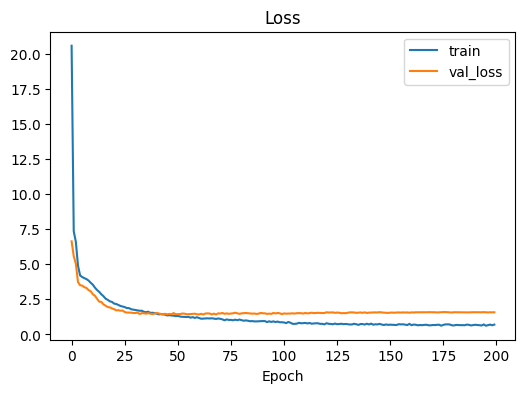

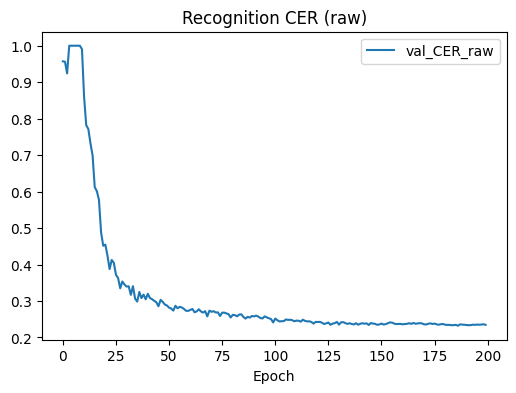

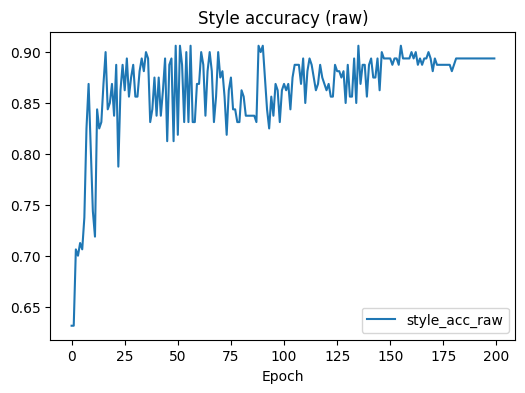

TEST(RAW best) — CER=0.243 | WER=0.539 | loss=1.381 | style_acc=0.881


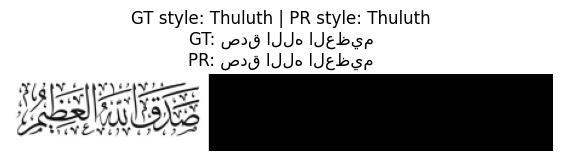

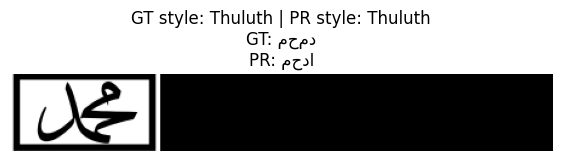

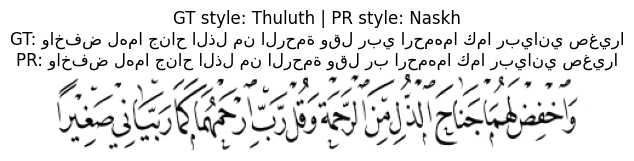

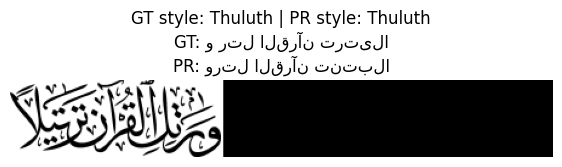

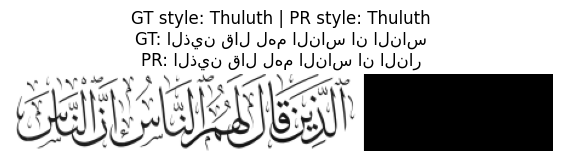

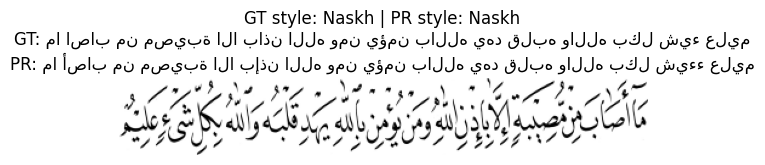

✅ Finished end-to-end (RAW tracking only; no EMA).


In [ ]:
# %% One-cell Colab-ready TPS-CRNN-CTC + Style Classifier (NO EMA; raw metrics only)
# ====================== Setup / Installs ======================
from google.colab import drive
drive.mount('/content/drive')
!unzip -q -o "/content/drive/MyDrive/Full_Dataset/Full_Dataset/Set1.zip" -d /content/
!pip -q install albumentations==1.4.7 editdistance==0.8.1 tqdm

# ====================== Imports ======================
import os, time, random, unicodedata, warnings, math
from pathlib import Path
from collections import Counter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2, editdistance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import albumentations as A
from torchvision import models

warnings.filterwarnings("ignore", category=UserWarning)
cv2.setNumThreads(0)

# ====================== Repro / Device ======================
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)

def human(n): return f"{n:,}"

def autocast_cuda():
    return torch.amp.autocast("cuda", enabled=(DEVICE=="cuda"))

# ====================== Data Paths ======================
EXTRACT_DIR = Path("/content/Set1")
IMAGES_DIR = EXTRACT_DIR / "images"
CSV_PATH   = EXTRACT_DIR / "labels_fixed.csv"
assert IMAGES_DIR.exists(), f"Images dir not found: {IMAGES_DIR}"
assert CSV_PATH.exists(),   f"CSV not found: {CSV_PATH}"
print("Images dir:", IMAGES_DIR)
print("CSV:", CSV_PATH)

# ====================== Load CSV & Basic Cleanup ======================
df = pd.read_csv(CSV_PATH)
assert {'img_name','label','class'}.issubset(df.columns), df.columns

def normalize_label(s: str) -> str:
    return unicodedata.normalize("NFC", str(s)).strip()

df['label'] = df['label'].astype(str).apply(normalize_label)
df['img_path'] = df['img_name'].apply(lambda n: str(IMAGES_DIR / n))
df = df[df['img_path'].apply(lambda p: Path(p).exists())].reset_index(drop=True)

# charset from labels
char_counts = Counter()
for s in df['label']:
    for ch in s: char_counts[ch]+=1
charset  = ['<BLANK>'] + sorted(char_counts.keys(), key=lambda c: (-char_counts[c], ord(c)))
char2idx = {c:i for i,c in enumerate(charset)}
idx2char = {i:c for c,i in char2idx.items()}
BLANK_IDX = 0
print(f"Rows: {human(len(df))} | Charset size(incl <BLANK>): {len(charset)}")

# styles
style_names = sorted(df['class'].fillna("Unknown").unique().tolist())
style2idx = {s:i for i,s in enumerate(style_names)}
idx2style = {i:s for s,i in style2idx.items()}
print(f"Styles ({len(style_names)}):", style_names)

# encode labels
RTL_REVERSE = True

def encode_label(text, rtl_reverse=True):
    if rtl_reverse: text = text[::-1]
    ids = [char2idx[ch] for ch in text if ch in char2idx and ch != '<BLANK>']
    return ids

df['enc_len'] = df['label'].apply(lambda s: len(encode_label(s, RTL_REVERSE)))
before = len(df); df = df[df['enc_len']>0].reset_index(drop=True)
print(f"Filtered empty labels: {human(before)} -> {human(len(df))}")

# ====================== Split ======================
train_df, test_df = train_test_split(
    df, test_size=0.10, random_state=SEED, stratify=df['class'].fillna("Unknown")
)
train_df, val_df  = train_test_split(
    train_df, test_size=0.1111, random_state=SEED, stratify=train_df['class'].fillna("Unknown")
)
print(f"Train: {human(len(train_df))} | Val: {human(len(val_df))} | Test: {human(len(test_df))}")

# ====================== Image & Token utils ======================
H_TARGET = 64
W_MAX    = 448
MEAN, STD = 0.5, 0.5

def decode_pred(indices, rtl_reverse=RTL_REVERSE):
    res, prev = [], None
    for idx in indices:
        if idx != BLANK_IDX and idx != prev:
            res.append(idx2char[idx])
        prev = idx
    s = "".join(res)
    return s[::-1] if rtl_reverse else s

# keep enough time-steps for CTC (pixels per label char, prior to backbone)
MIN_PX_PER_CHAR = 8

def resize_keep_ar_enforced(gray, h=H_TARGET, label_len=0,
                            min_px_per_char=MIN_PX_PER_CHAR, min_w=16, w_max=W_MAX):
    h0, w0 = gray.shape[:2]
    base_scale = h / float(h0)
    req_w = max(min_w, min(w_max, label_len * min_px_per_char))
    scale_w = req_w / float(w0)
    scale = max(base_scale, scale_w)
    new_w = int(np.clip(np.ceil(w0 * scale), min_w, w_max))
    interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
    return cv2.resize(gray, (new_w, h), interpolation=interp)

def pad_width_to_multiple(img, multiple=4, pad_value=255):
    h, w = img.shape
    pad_w = (multiple - (w % multiple)) % multiple
    if pad_w == 0: return img
    return cv2.copyMakeBorder(img, 0, 0, 0, pad_w, cv2.BORDER_CONSTANT, value=pad_value)

# ====================== Augmentations (moderate but helpful) ======================
AUG_P = 0.30

def stroke_thickness_jitter(img, p=0.5):
    if random.random() > p: return img
    k = random.choice([1,1,2])
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*k+1, 2*k+1))
    if random.random() < 0.5: img = cv2.erode(img, kernel, iterations=1)
    else: img = cv2.dilate(img, kernel, iterations=1)
    return img

train_aug = A.Compose([
    A.ImageCompression(quality_lower=65, quality_upper=95, p=AUG_P),
    A.MotionBlur(blur_limit=3, p=AUG_P*0.8),
    A.GaussNoise(var_limit=(5.0, 20.0), p=AUG_P*0.8),
    A.Perspective(scale=(0.02, 0.06), keep_size=True, pad_mode=cv2.BORDER_REPLICATE, p=AUG_P),
    A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.02, rotate_limit=3, border_mode=cv2.BORDER_REPLICATE, p=AUG_P*0.8),
    A.CoarseDropout(max_holes=3, max_height=8, max_width=24, fill_value=255, p=AUG_P*0.6),
    A.RandomBrightnessContrast(brightness_limit=0.08, contrast_limit=0.08, p=AUG_P*0.8),
])

def apply_train_aug(img):
    img = stroke_thickness_jitter(img, p=0.5)
    return train_aug(image=img)["image"]

# ====================== Dataset / Collate ======================
class OCRDataset(Dataset):
    def __init__(self, frame: pd.DataFrame, training=True):
        self.df = frame.reset_index(drop=True)
        self.training = training
    def __len__(self): return len(self.df)
    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = cv2.imread(row['img_path'], cv2.IMREAD_GRAYSCALE)
        assert img is not None, f"Failed to read {row['img_path']}"
        label_str = row['label']
        label_ids = encode_label(label_str, RTL_REVERSE)
        style_idx = style2idx[row['class']]
        img = resize_keep_ar_enforced(img, H_TARGET, label_len=len(label_ids))
        if self.training: img = apply_train_aug(img)
        img = pad_width_to_multiple(img, multiple=4, pad_value=255)
        img = img.astype(np.float32)/255.0
        img = (img - MEAN) / STD
        img_t = torch.from_numpy(img)[None, ...]  # (1,H,W)
        return img_t, torch.tensor(label_ids, dtype=torch.long), label_str, torch.tensor(style_idx), row['class'], img_t.shape[-1]

def collate_fn(batch):
    imgs, labels, label_strs, style_idxs, style_names_b, widths = zip(*batch)
    max_w = max(widths); bsz = len(imgs)
    padded = torch.full((bsz, 1, H_TARGET, max_w), (0.0 - MEAN)/STD, dtype=torch.float32)
    for i, im in enumerate(imgs):
        w = im.shape[-1]
        padded[i, :, :, :w] = im
    label_lens = torch.tensor([len(l) for l in labels], dtype=torch.long)
    labels_concat = torch.cat(labels, dim=0) if len(labels) and sum(label_lens).item()>0 else torch.tensor([], dtype=torch.long)
    return padded, labels_concat, label_lens, label_strs, torch.stack(style_idxs), style_names_b, torch.tensor(widths, dtype=torch.long)

# ====================== Model ======================
try:
    _IMAGENET_WEIGHTS = models.ResNet34_Weights.IMAGENET1K_V1
except Exception:
    _IMAGENET_WEIGHTS = "IMAGENET1K_V1"

class ResNet34OCRFeaturePretrained(nn.Module):
    def __init__(self, in_ch=1):
        super().__init__()
        try:
            m = models.resnet34(weights=_IMAGENET_WEIGHTS)
        except TypeError:
            m = models.resnet34(pretrained=True)
        with torch.no_grad():
            w = m.conv1.weight.data
            new_w = w.mean(dim=1, keepdim=True)
        m.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=(2,1), padding=3, bias=False)
        with torch.no_grad():
            m.conv1.weight.copy_(new_w)
        m.maxpool = nn.MaxPool2d(kernel_size=3, stride=(2,1), padding=1)
        def set_layer_height_only(layer):
            b0 = layer[0]
            b0.conv1.stride = (2,1)
            if b0.downsample is not None and isinstance(b0.downsample, nn.Sequential):
                ds0 = b0.downsample[0]
                if isinstance(ds0, nn.Conv2d): ds0.stride = (2,1)
        set_layer_height_only(m.layer2); set_layer_height_only(m.layer3); set_layer_height_only(m.layer4)

        self.stem   = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1 = m.layer1
        self.layer2 = m.layer2
        self.layer3 = m.layer3
        self.layer4 = m.layer4
        self.out    = nn.AdaptiveAvgPool2d((1, None))  # collapse height, keep width (time)

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x); x = self.layer2(x); x = self.layer3(x); x = self.layer4(x)
        fmap = x                                          # (B, 512, H', W)
        seq  = self.out(fmap).squeeze(2).permute(2,0,1)   # (T=W, B, 512)
        return seq, fmap

class TemporalGLUBlock(nn.Module):
    """Lightweight temporal conv with GLU gating."""
    def __init__(self, c=512, k=5, dilation=1, p=0.1):
        super().__init__()
        pad = (k-1)//2 * dilation
        self.conv = nn.Conv1d(c, 2*c, kernel_size=k, padding=pad, dilation=dilation)
        self.glu  = nn.GLU(dim=1)   # halves channels back to c
        self.drop = nn.Dropout(p)
        self.res  = nn.Conv1d(c, c, kernel_size=1)  # identity adapter
    def forward(self, x):            # x: (T,B,C)
        x = x.permute(1,2,0)         # (B,C,T)
        y = self.glu(self.conv(x))
        y = self.drop(y) + self.res(x)
        return y.permute(2,0,1)      # (T,B,C)

class BiLSTMStack(nn.Module):
    def __init__(self, in_dim, hidden=256, num_layers=2, dropout=0.25):
        super().__init__()
        layers=[]
        for i in range(num_layers):
            inp = in_dim if i==0 else hidden*2
            layers.append(nn.LSTM(inp, hidden, bidirectional=True, batch_first=False, dropout=0.0))
            layers.append(nn.Dropout(dropout))
        self.layers = nn.ModuleList(layers)
    def forward(self, x):
        for i in range(0,len(self.layers),2):
            x,_ = self.layers[i](x); x = self.layers[i+1](x)
        return x

class OCR_MultiTask_V2(nn.Module):
    """
    Shared CNN -> sequence.
    + Light TCN (GLU) -> BiLSTM.
    Head 1: main CTC (after BiLSTM).
    Head 1a: aux CTC (on pre-LSTM temporal conv output).
    Head 2: Style classification (global pool), with reduced gradient pressure.
    """
    def __init__(self, num_chars, num_styles, blank_idx=0, aux_ctc_weight=0.3):
        super().__init__()
        self.backbone = ResNet34OCRFeaturePretrained(in_ch=1)
        self.tcn1 = TemporalGLUBlock(512, k=5, dilation=1, p=0.1)
        self.tcn2 = TemporalGLUBlock(512, k=5, dilation=2, p=0.1)
        self.seq  = BiLSTMStack(in_dim=512, hidden=256, num_layers=2, dropout=0.25)
        self.ctc_head_main = nn.Linear(512, num_chars)
        self.ctc_head_aux  = nn.Linear(512, num_chars)
        self.style_head = nn.Sequential(
            nn.AdaptiveAvgPool2d((1,1)), nn.Flatten(),
            nn.Dropout(0.25),
            nn.Linear(512, max(256, num_styles*4)), nn.ReLU(True),
            nn.Linear(max(256, num_styles*4), num_styles)
        )
        self.blank_idx = blank_idx
        self.aux_ctc_weight = aux_ctc_weight
        with torch.no_grad():
            self.ctc_head_main.bias.zero_(); self.ctc_head_main.bias[blank_idx] = -2.0
            self.ctc_head_aux.bias.zero_();  self.ctc_head_aux.bias[blank_idx]  = -2.0

    def forward(self, x):
        seq_feats, fmap = self.backbone(x)  # seq_feats: (T,B,512)
        pre_lstm = self.tcn2(self.tcn1(seq_feats))        # (T,B,512)
        lstm_out = self.seq(pre_lstm)                     # (T,B,512)
        ctc_logits_main = self.ctc_head_main(lstm_out)    # (T,B,C)
        ctc_logits_aux  = self.ctc_head_aux(pre_lstm)     # (T,B,C)
        style_logits = self.style_head(fmap.detach())     # detach: lighter gradient conflict
        return ctc_logits_main, ctc_logits_aux, style_logits

# ====================== Dataloaders & Losses ======================
BATCH_SIZE   = 64
EPOCHS       = 200                  # keep similar total time / convergence
INIT_LR_HEAD = 8e-4
INIT_LR_BB   = 2e-4
WEIGHT_DECAY = 1e-4
MAX_NORM     = 1.0
LAMBDA_CLS   = 0.2                 # gentler style weight

train_ds = OCRDataset(train_df, training=True)
val_ds   = OCRDataset(val_df,   training=False)
test_ds  = OCRDataset(test_df,  training=False)

NUM_WORKERS = 2
loader_kwargs = dict(collate_fn=collate_fn, pin_memory=True, num_workers=NUM_WORKERS, persistent_workers=False)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  **loader_kwargs)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)

num_chars  = len(charset)
num_styles = len(style_names)
model = OCR_MultiTask_V2(num_chars, num_styles, blank_idx=BLANK_IDX, aux_ctc_weight=0.3).to(DEVICE)

ctc_loss  = nn.CTCLoss(blank=BLANK_IDX, reduction='mean', zero_infinity=True)
cls_loss  = nn.CrossEntropyLoss(label_smoothing=0.05)

# param groups
bb_params   = list(model.backbone.parameters())
mid_params  = list(model.tcn1.parameters()) + list(model.tcn2.parameters()) + list(model.seq.parameters())
head_params = list(model.ctc_head_main.parameters()) + list(model.ctc_head_aux.parameters()) + list(model.style_head.parameters())
optimizer = torch.optim.AdamW(
    [{"params": bb_params,   "lr": INIT_LR_BB},
     {"params": mid_params,  "lr": INIT_LR_HEAD},
     {"params": head_params, "lr": INIT_LR_HEAD}],
    weight_decay=WEIGHT_DECAY
)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)
scaler    = torch.amp.GradScaler("cuda", enabled=(DEVICE=="cuda"))

total_params = sum(p.numel() for p in model.parameters())
print(f"Parameters: {human(total_params)}")

# In this architecture, width is preserved thru the backbone -> time length = input width

def ctc_time_lengths(widths):
    return torch.clamp(widths, min=1)

# ====================== Decoding & Metrics ======================
@torch.no_grad()
def greedy_decode_ctc(logits, out_lens):
    max_idxs = logits.softmax(dim=-1).argmax(dim=-1)  # (T,B)
    T,B = max_idxs.shape
    dec=[]
    for b in range(B):
        L = int(out_lens[b])
        seq = max_idxs[:L, b].tolist()
        dec.append(decode_pred(seq))
    return dec

def cer(ref, hyp):
    return 0.0 if (len(ref)==0 and len(hyp)==0) else editdistance.eval(ref, hyp)/max(1,len(ref))

def wer(ref, hyp):
    r, h = ref.split(), hyp.split()
    return 0.0 if (len(r)==0 and len(h)==0) else editdistance.eval(r, h)/max(1,len(r))

# ====================== Eval (recognition + style) ======================
@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    tot_loss = tot_cer = tot_wer = 0.0; cnt = 0
    cls_correct = 0; cls_total = 0
    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in loader:
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)

        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)

        if len(labels_concat)>0:
            loss_ctc_main = ctc_loss(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
            log_probs_aux  = ctc_logits_aux.log_softmax(2)
            loss_ctc_aux   = ctc_loss(log_probs_aux.float(),  labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
        else:
            loss_ctc_main = torch.tensor(0., device=DEVICE)
            loss_ctc_aux  = torch.tensor(0., device=DEVICE)
        loss_cls = cls_loss(style_logits, style_idxs)
        loss = loss_ctc_main + 0.1*loss_ctc_aux + LAMBDA_CLS*loss_cls

        B = imgs.size(0); tot_loss += loss.item()*B; cnt += B

        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr); tot_wer += wer(gt, pr)

        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total   += B
    return {
        "loss": (tot_loss/cnt) if cnt else None,
        "cer":  (tot_cer/cnt) if cnt else None,
        "wer":  (tot_wer/cnt) if cnt else None,
        "style_acc": (cls_correct/cls_total) if cls_total>0 else None
    }

# ====================== Warmup & Train (NO EMA) ======================
for p in model.backbone.parameters(): p.requires_grad = False
print("Backbone frozen for warmup epoch.")

SAVE_DIR = Path("./checkpoints"); SAVE_DIR.mkdir(parents=True, exist_ok=True)
BEST_PATH = SAVE_DIR / "ocr_multitask_best_raw.pt"
history = {"train_loss": [], "val_loss": [], "val_cer": [], "val_style_acc": []}
best_cer_raw = float('inf')


def gpu_mem():
    if DEVICE=="cuda":
        a = torch.cuda.memory_allocated()/1e9; r = torch.cuda.memory_reserved()/1e9
        return f"GPU: alloc={a:.2f}G resv={r:.2f}G"
    return "CPU"

print(f"[Train] epochs={EPOCHS}, batches/epoch={len(train_loader)}, device={DEVICE}")
for epoch in range(1, EPOCHS+1):
    model.train()
    running = 0.0; seen = 0
    t0 = time.time()

    # unfreeze backbone after first epoch
    if epoch == 2:
        for p in model.backbone.parameters(): p.requires_grad = True
        print("Backbone unfrozen.")

    pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch:02d}", leave=False)
    for bidx, (imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths) in pbar:
        imgs = imgs.to(DEVICE, non_blocking=True)
        style_idxs = style_idxs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)

        optimizer.zero_grad(set_to_none=True)
        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)
            if len(labels_concat)>0:
                loss_ctc_main = ctc_loss(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
                log_probs_aux  = ctc_logits_aux.log_softmax(2)
                loss_ctc_aux   = ctc_loss(log_probs_aux.float(),  labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
            else:
                loss_ctc_main = torch.tensor(0., device=DEVICE)
                loss_ctc_aux  = torch.tensor(0., device=DEVICE)
            loss_cls = cls_loss(style_logits, style_idxs)
            loss = loss_ctc_main + model.aux_ctc_weight*loss_ctc_aux + LAMBDA_CLS*loss_cls

        scaler.scale(loss).backward()
        nn.utils.clip_grad_norm_(model.parameters(), MAX_NORM)
        scaler.step(optimizer); scaler.update()

        running += loss.item() * imgs.size(0); seen += imgs.size(0)
        pbar.set_postfix(loss=f"{loss.item():.3f}", avg=f"{(running/max(1,seen)):.3f}")

    scheduler.step()
    train_loss = running / max(1, seen)
    history["train_loss"].append(train_loss)

    # validation — RAW ONLY
    val_raw  = evaluate(model, val_loader)
    history["val_loss"].append(val_raw["loss"])
    history["val_cer"].append(val_raw["cer"])
    history["val_style_acc"].append(val_raw["style_acc"])

    dt = time.time()-t0
    print(f"Epoch {epoch:02d}/{EPOCHS} | train={train_loss:.3f} | val: loss={val_raw['loss']:.3f} "
          f"CER={val_raw['cer']:.3f} WER={val_raw['wer']:.3f} style={val_raw['style_acc']:.3f} | "
          f"{dt:.1f}s | {gpu_mem()}")

    # Track best RAW CER only
    if val_raw["cer"] is not None and val_raw["cer"] < best_cer_raw:
        best_cer_raw = val_raw["cer"]
        torch.save({
            "model": model.state_dict(),
            "charset": charset, "style_names": style_names,
            "config": {"H_TARGET": H_TARGET, "RTL_REVERSE": RTL_REVERSE}
        }, BEST_PATH)
        print(f"  ↳ New best RAW CER={best_cer_raw:.4f} — saved to {BEST_PATH}")

print("[Train] Done.")

# ====================== Curves (RAW only) ======================
plt.figure(figsize=(6,4)); plt.plot(history["train_loss"], label="train"); plt.plot(history["val_loss"], label="val_loss")
plt.title("Loss"); plt.xlabel("Epoch"); plt.legend(); plt.show()

plt.figure(figsize=(6,4)); plt.plot(history["val_cer"], label="val_CER_raw")
plt.title("Recognition CER (raw)"); plt.xlabel("Epoch"); plt.legend(); plt.show()

plt.figure(figsize=(6,4)); plt.plot(history["val_style_acc"], label="style_acc_raw")
plt.title("Style accuracy (raw)"); plt.xlabel("Epoch"); plt.legend(); plt.show()

# ====================== Test Evaluation (best RAW weights) ======================
ckpt = torch.load(BEST_PATH, map_location=DEVICE)
model.load_state_dict(ckpt["model"], strict=False); model.eval()

@torch.no_grad()
def evaluate_simple(model, loader):
    model.eval()
    tot_cer = tot_wer = 0.0; cnt = 0
    tot_loss = 0.0; cls_correct=0; cls_total=0
    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in loader:
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)
        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)
        if len(labels_concat)>0:
            loss_ctc = ctc_loss(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
        else:
            loss_ctc = torch.tensor(0., device=DEVICE)
        loss = loss_ctc + LAMBDA_CLS*cls_loss(style_logits, style_idxs)
        B = imgs.size(0)
        tot_loss += loss.item()*B; cnt += B

        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr); tot_wer += wer(gt, pr)

        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total   += B
    return {
        "loss": (tot_loss/cnt) if cnt else None,
        "cer":  (tot_cer/cnt) if cnt else None,
        "wer":  (tot_wer/cnt) if cnt else None,
        "style_acc": (cls_correct/cls_total) if cls_total>0 else None
    }

test_metrics = evaluate_simple(model, test_loader)
print(f"TEST(RAW best) — CER={test_metrics['cer']:.3f} | WER={test_metrics['wer']:.3f} | "
      f"loss={test_metrics['loss']:.3f} | style_acc={test_metrics['style_acc']:.3f}")

# ====================== Qualitative Samples ======================
@torch.no_grad()
def show_samples(model, loader, k=6):
    model.eval()
    imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths = next(iter(loader))
    imgs = imgs.to(DEVICE)
    ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
    preds = greedy_decode_ctc(ctc_logits_main, ctc_time_lengths(widths))
    style_pred = style_logits.softmax(1).argmax(1).cpu().tolist()
    for i in range(min(k, imgs.size(0))):
        im = imgs[i,0].cpu().numpy()
        im = np.clip(im*STD + MEAN, 0, 1)
        plt.figure(figsize=(7,2))
        plt.imshow(im, cmap='gray'); plt.axis('off')
        gt_style = style_names_b[i]
        pr_style = idx2style[style_pred[i]]
        plt.title(f"GT style: {gt_style} | PR style: {pr_style}\nGT: {label_strs[i]}\nPR: {preds[i]}")
        plt.show()

show_samples(model, test_loader, k=6)
print("✅ Finished end-to-end (RAW tracking only; no EMA).")

## DECEMBER RUNS

In [ ]:
# %% DECEMBER RUNS - Improved Multi-Set OCR Pipeline (L4 GPU Optimized)
# ====================== Setup / Installs ======================
from google.colab import drive
drive.mount('/content/drive')

# Extract all 3 sets to local storage for faster I/O
import zipfile
import os

DRIVE_BASE = "/content/drive/MyDrive/Full_Dataset/Full_Dataset"
LOCAL_BASE = "/content/dataset"
os.makedirs(LOCAL_BASE, exist_ok=True)

for set_name in ["Set1", "Set2", "Set3"]:
    zip_path = f"{DRIVE_BASE}/{set_name}.zip"
    extract_dir = f"{LOCAL_BASE}/{set_name}"
    if os.path.exists(zip_path):
        print(f"Extracting {set_name}...")
        with zipfile.ZipFile(zip_path, 'r') as zf:
            zf.extractall(LOCAL_BASE)
        print(f"  ✓ {set_name} extracted to {extract_dir}")
    else:
        print(f"  ⚠ {zip_path} not found, skipping...")

!pip -q install albumentations==1.4.7 editdistance==0.8.1 tqdm timm

# ====================== Imports ======================
import time, random, unicodedata, warnings, math, gc
from pathlib import Path
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2, editdistance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import albumentations as A
from torchvision import models
import timm

warnings.filterwarnings("ignore", category=UserWarning)
cv2.setNumThreads(0)

# ====================== Reproducibility & Device ======================
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False  # faster on L4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")
if DEVICE == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Total VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

def human(n): return f"{n:,}"
def autocast_cuda(): return torch.amp.autocast("cuda", enabled=(DEVICE=="cuda"), dtype=torch.float16)

def gpu_mem():
    if DEVICE == "cuda":
        a = torch.cuda.memory_allocated()/1e9
        r = torch.cuda.memory_reserved()/1e9
        t = torch.cuda.get_device_properties(0).total_memory/1e9
        return f"GPU: {a:.2f}/{r:.2f}/{t:.1f}GB (alloc/resv/total)"
    return "CPU"

# ====================== Data Paths ======================
LOCAL_BASE = Path("/content/dataset")
CSV_PATH = Path("/content/drive/MyDrive/Full_Dataset/Full_Dataset/labels_fixed.csv")
assert CSV_PATH.exists(), f"CSV not found: {CSV_PATH}"
print(f"Labels CSV: {CSV_PATH}")

# ====================== Load & Merge All Sets ======================
df = pd.read_csv(CSV_PATH)
assert {'img_name', 'label', 'class'}.issubset(df.columns), f"Missing columns. Found: {df.columns.tolist()}"

def normalize_label(s: str) -> str:
    return unicodedata.normalize("NFC", str(s)).strip()

df['label'] = df['label'].astype(str).apply(normalize_label)

# Build image paths based on Set prefix in img_name
def get_img_path(img_name):
    # Extract set number from prefix (Set1_, Set2_, Set3_)
    for set_num in [1, 2, 3]:
        prefix = f"Set{set_num}_"
        if img_name.startswith(prefix):
            # Remove prefix to get actual filename
            actual_name = img_name[len(prefix):]
            return str(LOCAL_BASE / f"Set{set_num}" / "images" / actual_name)
    # Fallback: try all sets
    for set_num in [1, 2, 3]:
        path = LOCAL_BASE / f"Set{set_num}" / "images" / img_name
        if path.exists():
            return str(path)
    return None

df['img_path'] = df['img_name'].apply(get_img_path)

# Drop rows with missing files
before_filter = len(df)
df = df[df['img_path'].apply(lambda p: p is not None and Path(p).exists())].reset_index(drop=True)
print(f"Images found: {human(len(df))} / {human(before_filter)} ({100*len(df)/before_filter:.1f}%)")

# ====================== Charset ======================
char_counts = Counter()
for s in df['label']:
    for ch in s:
        char_counts[ch] += 1

charset = ['<BLANK>'] + sorted(char_counts.keys(), key=lambda c: (-char_counts[c], ord(c)))
char2idx = {c: i for i, c in enumerate(charset)}
idx2char = {i: c for c, i in char2idx.items()}
BLANK_IDX = 0
print(f"Charset size (incl <BLANK>): {len(charset)}")

# ====================== Style Classes ======================
style_names = sorted(df['class'].fillna("Unknown").unique().tolist())
style2idx = {s: i for i, s in enumerate(style_names)}
idx2style = {i: s for s, i in style2idx.items()}
print(f"Styles ({len(style_names)}): {style_names}")

# ====================== Class Distribution Analysis ======================
print("\n" + "="*60)
print("CLASS DISTRIBUTION ANALYSIS")
print("="*60)
class_counts = df['class'].value_counts()
print(class_counts)
print(f"\nMax class: {class_counts.max()} | Min class: {class_counts.min()}")
print(f"Imbalance ratio: {class_counts.max() / class_counts.min():.2f}x")

# ====================== Encode Labels ======================
RTL_REVERSE = True

def encode_label(text, rtl_reverse=True):
    if rtl_reverse:
        text = text[::-1]
    ids = [char2idx[ch] for ch in text if ch in char2idx and ch != '<BLANK>']
    return ids

df['enc_len'] = df['label'].apply(lambda s: len(encode_label(s, RTL_REVERSE)))
before = len(df)
df = df[df['enc_len'] > 0].reset_index(drop=True)
print(f"Filtered empty labels: {human(before)} -> {human(len(df))}")

# ====================== Train/Val/Test Split ======================
train_df, test_df = train_test_split(
    df, test_size=0.10, random_state=SEED, stratify=df['class'].fillna("Unknown")
)
train_df, val_df = train_test_split(
    train_df, test_size=0.1111, random_state=SEED, stratify=train_df['class'].fillna("Unknown")
)
print(f"\nTrain: {human(len(train_df))} | Val: {human(len(val_df))} | Test: {human(len(test_df))}")

# ====================== Class Balancing via Oversampling ======================
print("\n" + "="*60)
print("HANDLING CLASS IMBALANCE")
print("="*60)

train_class_counts = train_df['class'].value_counts()
max_class_count = train_class_counts.max()
print(f"Target samples per class: {max_class_count}")

# Compute sample weights for WeightedRandomSampler
class_weights = {cls: max_class_count / count for cls, count in train_class_counts.items()}
sample_weights = train_df['class'].map(class_weights).values
sample_weights = torch.DoubleTensor(sample_weights)
print(f"Class weights computed. Effective training samples per epoch: {int(max_class_count * len(train_class_counts))}")

# ====================== Image Processing ======================
H_TARGET = 64
W_MAX = 512  # Wider for better CTC
MEAN, STD = 0.5, 0.5
MIN_PX_PER_CHAR = 8

def decode_pred(indices, rtl_reverse=RTL_REVERSE):
    res, prev = [], None
    for idx in indices:
        if idx != BLANK_IDX and idx != prev:
            res.append(idx2char[idx])
        prev = idx
    s = "".join(res)
    return s[::-1] if rtl_reverse else s

def resize_keep_ar_enforced(gray, h=H_TARGET, label_len=0, min_px_per_char=MIN_PX_PER_CHAR, min_w=16, w_max=W_MAX):
    h0, w0 = gray.shape[:2]
    base_scale = h / float(h0)
    req_w = max(min_w, min(w_max, label_len * min_px_per_char))
    scale_w = req_w / float(w0)
    scale = max(base_scale, scale_w)
    new_w = int(np.clip(np.ceil(w0 * scale), min_w, w_max))
    interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
    return cv2.resize(gray, (new_w, h), interpolation=interp)

def pad_width_to_multiple(img, multiple=4, pad_value=255):
    h, w = img.shape
    pad_w = (multiple - (w % multiple)) % multiple
    if pad_w == 0:
        return img
    return cv2.copyMakeBorder(img, 0, 0, 0, pad_w, cv2.BORDER_CONSTANT, value=pad_value)

# ====================== Enhanced Augmentations ======================
AUG_P = 0.40

def stroke_thickness_jitter(img, p=0.5):
    if random.random() > p:
        return img
    k = random.choice([1, 1, 2])
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*k+1, 2*k+1))
    if random.random() < 0.5:
        img = cv2.erode(img, kernel, iterations=1)
    else:
        img = cv2.dilate(img, kernel, iterations=1)
    return img

def cutout_stripes(img, max_stripes=3, max_frac=0.15, p=0.4):
    if random.random() > p:
        return img
    h, w = img.shape
    n = random.randint(1, max_stripes)
    for _ in range(n):
        stripe_w = max(2, int(random.random() * max(3, w * max_frac)))
        x0 = random.randint(0, max(0, w - stripe_w))
        img[:, x0:x0+stripe_w] = 255
    return img

train_aug = A.Compose([
    A.ImageCompression(quality_lower=55, quality_upper=95, p=AUG_P),
    A.MotionBlur(blur_limit=5, p=AUG_P * 0.7),
    A.GaussNoise(var_limit=(5.0, 30.0), p=AUG_P * 0.8),
    A.Perspective(scale=(0.02, 0.08), keep_size=True, pad_mode=cv2.BORDER_REPLICATE, p=AUG_P),
    A.GridDistortion(num_steps=5, distort_limit=0.25, p=AUG_P * 0.5),
    A.ElasticTransform(alpha=50, sigma=5, p=AUG_P * 0.4),
    A.RandomGamma(gamma_limit=(70, 130), p=AUG_P * 0.7),
    A.GaussianBlur(blur_limit=(3, 5), p=AUG_P * 0.4),
    A.RandomBrightnessContrast(brightness_limit=0.12, contrast_limit=0.12, p=AUG_P * 0.8),
    A.ShiftScaleRotate(shift_limit=0.02, scale_limit=0.03, rotate_limit=4, border_mode=cv2.BORDER_REPLICATE, p=AUG_P * 0.7),
    A.CoarseDropout(max_holes=4, max_height=10, max_width=30, fill_value=255, p=AUG_P * 0.5),
])

def apply_train_aug(img):
    img = stroke_thickness_jitter(img, p=0.5)
    img = cutout_stripes(img, p=0.35)
    return train_aug(image=img)["image"]

# ====================== Dataset ======================
class OCRDataset(Dataset):
    def __init__(self, frame: pd.DataFrame, training=True):
        self.df = frame.reset_index(drop=True)
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = cv2.imread(row['img_path'], cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise ValueError(f"Failed to read {row['img_path']}")

        label_str = row['label']
        label_ids = encode_label(label_str, RTL_REVERSE)
        style_idx = style2idx[row['class']]

        img = resize_keep_ar_enforced(img, H_TARGET, label_len=len(label_ids))
        if self.training:
            img = apply_train_aug(img)
        img = pad_width_to_multiple(img, multiple=4, pad_value=255)

        img = img.astype(np.float32) / 255.0
        img = (img - MEAN) / STD
        img_t = torch.from_numpy(img)[None, ...]  # (1, H, W)

        return img_t, torch.tensor(label_ids, dtype=torch.long), label_str, torch.tensor(style_idx), row['class'], img_t.shape[-1]

def collate_fn(batch):
    batch = sorted(batch, key=lambda x: x[-1], reverse=True)  # Sort by width (desc) for better packing
    imgs, labels, label_strs, style_idxs, style_names_b, widths = zip(*batch)
    max_w = max(widths)
    bsz = len(imgs)
    padded = torch.full((bsz, 1, H_TARGET, max_w), (0.0 - MEAN) / STD, dtype=torch.float32)
    for i, im in enumerate(imgs):
        w = im.shape[-1]
        padded[i, :, :, :w] = im
    label_lens = torch.tensor([len(l) for l in labels], dtype=torch.long)
    labels_concat = torch.cat(labels, dim=0) if len(labels) and sum(label_lens).item() > 0 else torch.tensor([], dtype=torch.long)
    return padded, labels_concat, label_lens, label_strs, torch.stack(style_idxs), style_names_b, torch.tensor(widths, dtype=torch.long)

# ====================== Model Architecture (Improved) ======================
print("\n" + "="*60)
print("MODEL ARCHITECTURE")
print("="*60)

try:
    _IMAGENET_WEIGHTS = models.ResNet34_Weights.IMAGENET1K_V1
except:
    _IMAGENET_WEIGHTS = "IMAGENET1K_V1"

class SEBlock(nn.Module):
    """Squeeze-and-Excitation block for channel attention."""
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.fc1 = nn.Linear(channels, channels // reduction)
        self.fc2 = nn.Linear(channels // reduction, channels)

    def forward(self, x):
        b, c, h, w = x.shape
        y = x.view(b, c, -1).mean(dim=2)  # Global avg pool
        y = F.relu(self.fc1(y))
        y = torch.sigmoid(self.fc2(y))
        return x * y.view(b, c, 1, 1)

class AffineSTN(nn.Module):
    """Lightweight Spatial Transformer Network for de-skewing."""
    def __init__(self, in_ch=1):
        super().__init__()
        self.loc = nn.Sequential(
            nn.Conv2d(in_ch, 24, 3, padding=1), nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(24, 48, 3, padding=1), nn.ReLU(True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(48, 96, 3, padding=1), nn.ReLU(True),
            nn.AdaptiveAvgPool2d((4, 16)),
        )
        self.fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(96 * 4 * 16, 128), nn.ReLU(True),
            nn.Dropout(0.1),
            nn.Linear(128, 6)
        )
        # Initialize to identity transform
        with torch.no_grad():
            self.fc[-1].weight.zero_()
            self.fc[-1].bias.copy_(torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float))

    def forward(self, x):
        theta = self.fc(self.loc(x)).view(-1, 2, 3)
        grid = F.affine_grid(theta, x.size(), align_corners=False)
        return F.grid_sample(x, grid, mode='bilinear', padding_mode='border', align_corners=False)

class ResNet34OCRBackbone(nn.Module):
    """ResNet34 backbone adapted for OCR (preserves width dimension)."""
    def __init__(self, in_ch=1, use_stn=True, use_se=True):
        super().__init__()
        self.stn = AffineSTN(in_ch) if use_stn else nn.Identity()

        try:
            m = models.resnet34(weights=_IMAGENET_WEIGHTS)
        except TypeError:
            m = models.resnet34(pretrained=True)

        # Adapt to 1-channel input
        with torch.no_grad():
            w = m.conv1.weight.data
            new_w = w.mean(dim=1, keepdim=True)
        m.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=(2, 1), padding=3, bias=False)
        with torch.no_grad():
            m.conv1.weight.copy_(new_w)

        m.maxpool = nn.MaxPool2d(kernel_size=3, stride=(2, 1), padding=1)

        def set_layer_height_only(layer):
            b0 = layer[0]
            b0.conv1.stride = (2, 1)
            if b0.downsample is not None and isinstance(b0.downsample, nn.Sequential):
                ds0 = b0.downsample[0]
                if isinstance(ds0, nn.Conv2d):
                    ds0.stride = (2, 1)

        set_layer_height_only(m.layer2)
        set_layer_height_only(m.layer3)
        set_layer_height_only(m.layer4)

        self.stem = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1 = m.layer1
        self.layer2 = m.layer2
        self.layer3 = m.layer3
        self.layer4 = m.layer4

        # Optional SE blocks after layer3 and layer4
        self.se3 = SEBlock(256) if use_se else nn.Identity()
        self.se4 = SEBlock(512) if use_se else nn.Identity()

        self.out = nn.AdaptiveAvgPool2d((1, None))  # Collapse height

    def forward(self, x):
        x = self.stn(x)
        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.se3(self.layer3(x))
        x = self.se4(self.layer4(x))
        fmap = x  # (B, 512, H', W)
        seq = self.out(fmap).squeeze(2).permute(2, 0, 1)  # (T=W, B, 512)
        return seq, fmap

class TemporalGLUBlock(nn.Module):
    """Temporal convolution with GLU gating and residual connection."""
    def __init__(self, c=512, k=5, dilation=1, p=0.15):
        super().__init__()
        pad = (k - 1) // 2 * dilation
        self.conv = nn.Conv1d(c, 2 * c, kernel_size=k, padding=pad, dilation=dilation)
        self.glu = nn.GLU(dim=1)
        self.drop = nn.Dropout(p)
        self.norm = nn.LayerNorm(c)

    def forward(self, x):  # x: (T, B, C)
        residual = x
        x = x.permute(1, 2, 0)  # (B, C, T)
        y = self.glu(self.conv(x))
        y = y.permute(2, 0, 1)  # (T, B, C)
        y = self.drop(y) + residual
        y = self.norm(y)
        return y

class BiLSTMStack(nn.Module):
    """Stacked bidirectional LSTM with dropout."""
    def __init__(self, in_dim, hidden=320, num_layers=3, dropout=0.3):
        super().__init__()
        self.lstm = nn.LSTM(
            in_dim, hidden, num_layers=num_layers,
            bidirectional=True, batch_first=False, dropout=dropout if num_layers > 1 else 0
        )
        self.out_drop = nn.Dropout(dropout)

    def forward(self, x):
        x, _ = self.lstm(x)
        return self.out_drop(x)

class MultiHeadAttentionPool(nn.Module):
    """Multi-head attention pooling for style classification."""
    def __init__(self, dim=512, num_heads=4):
        super().__init__()
        self.attn = nn.MultiheadAttention(dim, num_heads, batch_first=True)
        self.query = nn.Parameter(torch.randn(1, 1, dim))

    def forward(self, x):  # x: (B, C, H, W)
        B, C, H, W = x.shape
        x = x.view(B, C, -1).permute(0, 2, 1)  # (B, H*W, C)
        q = self.query.expand(B, -1, -1)
        out, _ = self.attn(q, x, x)
        return out.squeeze(1)  # (B, C)

class OCR_MultiTask_V3(nn.Module):
    """
    Improved OCR model with:
    - STN for spatial normalization
    - SE blocks for channel attention
    - Deeper BiLSTM (3 layers)
    - Multi-scale TCN
    - Auxiliary CTC head
    - Attention-based style classification
    """
    def __init__(self, num_chars, num_styles, blank_idx=0, use_stn=True, aux_weight=0.25):
        super().__init__()
        self.backbone = ResNet34OCRBackbone(in_ch=1, use_stn=use_stn, use_se=True)

        # Multi-scale temporal modeling
        self.tcn1 = TemporalGLUBlock(512, k=3, dilation=1, p=0.15)
        self.tcn2 = TemporalGLUBlock(512, k=5, dilation=2, p=0.15)
        self.tcn3 = TemporalGLUBlock(512, k=7, dilation=4, p=0.15)

        # Deeper BiLSTM
        self.lstm = BiLSTMStack(in_dim=512, hidden=320, num_layers=3, dropout=0.3)

        # CTC heads
        self.ctc_head_main = nn.Linear(640, num_chars)  # 320*2
        self.ctc_head_aux = nn.Linear(512, num_chars)

        # Style classification with attention pooling
        self.style_pool = MultiHeadAttentionPool(512, num_heads=4)
        self.style_head = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(512, 256), nn.ReLU(True),
            nn.Dropout(0.2),
            nn.Linear(256, num_styles)
        )

        self.blank_idx = blank_idx
        self.aux_weight = aux_weight

        # Initialize CTC head biases
        with torch.no_grad():
            self.ctc_head_main.bias.zero_()
            self.ctc_head_main.bias[blank_idx] = -2.5
            self.ctc_head_aux.bias.zero_()
            self.ctc_head_aux.bias[blank_idx] = -2.5

    def forward(self, x):
        seq_feats, fmap = self.backbone(x)  # seq_feats: (T, B, 512)

        # Multi-scale TCN
        tcn_out = self.tcn3(self.tcn2(self.tcn1(seq_feats)))  # (T, B, 512)

        # BiLSTM
        lstm_out = self.lstm(tcn_out)  # (T, B, 640)

        # CTC outputs
        ctc_logits_main = self.ctc_head_main(lstm_out)  # (T, B, num_chars)
        ctc_logits_aux = self.ctc_head_aux(tcn_out)     # (T, B, num_chars)

        # Style classification (detach to reduce gradient conflict)
        style_feats = self.style_pool(fmap.detach())
        style_logits = self.style_head(style_feats)

        return ctc_logits_main, ctc_logits_aux, style_logits

# ====================== Training Configuration (L4 Optimized) ======================
# L4 has 22GB VRAM - we can use larger batches
BATCH_SIZE = 96  # Increased from 64
EPOCHS = 120
INIT_LR_HEAD = 1e-3
INIT_LR_BB = 2.5e-4
WEIGHT_DECAY = 5e-5
MAX_NORM = 1.0
LAMBDA_CLS_MAX = 0.3
AUX_CTC_WEIGHT = 0.25

# Calculate effective samples per epoch with oversampling
effective_samples = int(max_class_count * len(train_class_counts))
sampler = WeightedRandomSampler(sample_weights, num_samples=effective_samples, replacement=True)

# ====================== Dataloaders ======================
train_ds = OCRDataset(train_df, training=True)
val_ds = OCRDataset(val_df, training=False)
test_ds = OCRDataset(test_df, training=False)

NUM_WORKERS = 4  # L4 can handle more workers
loader_kwargs = dict(collate_fn=collate_fn, pin_memory=True, num_workers=NUM_WORKERS, persistent_workers=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=sampler, **loader_kwargs)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)

print(f"Train loader: {len(train_loader)} batches (with oversampling)")
print(f"Val loader: {len(val_loader)} batches")
print(f"Test loader: {len(test_loader)} batches")

# ====================== Model & Optimizer ======================
num_chars = len(charset)
num_styles = len(style_names)
model = OCR_MultiTask_V3(num_chars, num_styles, blank_idx=BLANK_IDX, use_stn=True, aux_weight=AUX_CTC_WEIGHT).to(DEVICE)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {human(total_params)}")
print(f"Trainable parameters: {human(trainable_params)}")

ctc_loss_fn = nn.CTCLoss(blank=BLANK_IDX, reduction='mean', zero_infinity=True)
cls_loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)

# Parameter groups with different learning rates
bb_params = list(model.backbone.parameters())
mid_params = (list(model.tcn1.parameters()) + list(model.tcn2.parameters()) +
              list(model.tcn3.parameters()) + list(model.lstm.parameters()))
head_params = (list(model.ctc_head_main.parameters()) + list(model.ctc_head_aux.parameters()) +
               list(model.style_pool.parameters()) + list(model.style_head.parameters()))

optimizer = torch.optim.AdamW([
    {"params": bb_params, "lr": INIT_LR_BB},
    {"params": mid_params, "lr": INIT_LR_HEAD},
    {"params": head_params, "lr": INIT_LR_HEAD}
], weight_decay=WEIGHT_DECAY, betas=(0.9, 0.98))

# OneCycleLR for better convergence
steps_per_epoch = len(train_loader)
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=[INIT_LR_BB * 5, INIT_LR_HEAD * 5, INIT_LR_HEAD * 5],
    epochs=EPOCHS, steps_per_epoch=steps_per_epoch,
    pct_start=0.1, div_factor=10.0, final_div_factor=100.0
)

scaler = torch.amp.GradScaler("cuda", enabled=(DEVICE == "cuda"))

# ====================== EMA ======================
class EMA:
    def __init__(self, model, decay=0.9995):
        self.decay = decay
        self.shadow = {k: v.detach().clone() for k, v in model.state_dict().items()}

    @torch.no_grad()
    def update(self, model):
        for k, v in model.state_dict().items():
            if v.dtype.is_floating_point:
                self.shadow[k].mul_(self.decay).add_(v, alpha=1.0 - self.decay)
            else:
                self.shadow[k] = v.clone()

    def apply_to(self, model):
        self._backup = {k: v.clone() for k, v in model.state_dict().items()}
        model.load_state_dict(self.shadow, strict=False)

    def restore(self, model):
        model.load_state_dict(self._backup, strict=False)
        del self._backup

ema = EMA(model, decay=0.9995)

# ====================== Metrics ======================
def cer(ref, hyp):
    return 0.0 if (len(ref) == 0 and len(hyp) == 0) else editdistance.eval(ref, hyp) / max(1, len(ref))

def wer(ref, hyp):
    r, h = ref.split(), hyp.split()
    return 0.0 if (len(r) == 0 and len(h) == 0) else editdistance.eval(r, h) / max(1, len(r))

def ctc_time_lengths(widths):
    return torch.clamp(widths, min=1)

@torch.no_grad()
def greedy_decode_ctc(logits, out_lens):
    max_idxs = logits.softmax(dim=-1).argmax(dim=-1)  # (T, B)
    T, B = max_idxs.shape
    dec = []
    for b in range(B):
        L = int(out_lens[b])
        seq = max_idxs[:L, b].tolist()
        dec.append(decode_pred(seq))
    return dec

# ====================== Evaluation ======================
@torch.no_grad()
def evaluate(model, loader, use_ema=False):
    if use_ema:
        ema.apply_to(model)
    model.eval()

    tot_loss = tot_cer = tot_wer = 0.0
    cnt = 0
    cls_correct = cls_total = 0

    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in loader:
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)

        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)

        if len(labels_concat) > 0:
            loss_ctc = ctc_loss_fn(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
        else:
            loss_ctc = torch.tensor(0., device=DEVICE)
        loss_cls = cls_loss_fn(style_logits, style_idxs)
        loss = loss_ctc + LAMBDA_CLS_MAX * loss_cls

        B = imgs.size(0)
        tot_loss += loss.item() * B
        cnt += B

        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr)
            tot_wer += wer(gt, pr)

        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total += B

    if use_ema:
        ema.restore(model)

    return {
        "loss": tot_loss / cnt if cnt else None,
        "cer": tot_cer / cnt if cnt else None,
        "wer": tot_wer / cnt if cnt else None,
        "style_acc": cls_correct / cls_total if cls_total > 0 else None
    }

# ====================== Training Loop ======================
print("\n" + "="*60)
print("TRAINING")
print("="*60)

SAVE_DIR = Path("./checkpoints")
SAVE_DIR.mkdir(parents=True, exist_ok=True)
BEST_PATH = SAVE_DIR / "ocr_december_best.pt"
BEST_EMA_PATH = SAVE_DIR / "ocr_december_best_ema.pt"

history = {
    "train_loss": [], "val_loss": [],
    "val_cer_raw": [], "val_cer_ema": [],
    "val_wer_raw": [], "val_wer_ema": [],
    "val_style_acc_raw": [], "val_style_acc_ema": []
}

best_cer_raw = float('inf')
best_cer_ema = float('inf')

# Freeze backbone for warmup
for p in model.backbone.parameters():
    p.requires_grad = False
print("Backbone frozen for warmup epoch.")

def get_lambda_cls(epoch):
    """Ramp up style loss weight from 0.1 to LAMBDA_CLS_MAX over first 15 epochs."""
    return min(LAMBDA_CLS_MAX, 0.1 + (LAMBDA_CLS_MAX - 0.1) * min(1.0, epoch / 15))

print(f"\n[Training] Epochs={EPOCHS}, Batch={BATCH_SIZE}, Steps/epoch={steps_per_epoch}")
print(f"Device: {DEVICE} | {gpu_mem()}\n")

for epoch in range(1, EPOCHS + 1):
    model.train()
    running = 0.0
    seen = 0
    t0 = time.time()

    # Unfreeze backbone after warmup
    if epoch == 2:
        for p in model.backbone.parameters():
            p.requires_grad = True
        print("Backbone unfrozen.")

    lambda_cls = get_lambda_cls(epoch)

    pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch:03d}", leave=False)
    for bidx, (imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths) in pbar:
        imgs = imgs.to(DEVICE, non_blocking=True)
        style_idxs = style_idxs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)

        optimizer.zero_grad(set_to_none=True)

        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)

            if len(labels_concat) > 0:
                loss_ctc_main = ctc_loss_fn(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
                log_probs_aux = ctc_logits_aux.log_softmax(2)
                loss_ctc_aux = ctc_loss_fn(log_probs_aux.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
            else:
                loss_ctc_main = torch.tensor(0., device=DEVICE)
                loss_ctc_aux = torch.tensor(0., device=DEVICE)

            loss_cls = cls_loss_fn(style_logits, style_idxs)
            loss = loss_ctc_main + AUX_CTC_WEIGHT * loss_ctc_aux + lambda_cls * loss_cls

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), MAX_NORM)
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()
        ema.update(model)

        running += loss.item() * imgs.size(0)
        seen += imgs.size(0)
        pbar.set_postfix(loss=f"{loss.item():.3f}", avg=f"{running/max(1,seen):.3f}")

    train_loss = running / max(1, seen)
    history["train_loss"].append(train_loss)

    # Validation
    val_raw = evaluate(model, val_loader, use_ema=False)
    val_ema = evaluate(model, val_loader, use_ema=True)

    history["val_loss"].append(val_raw["loss"])
    history["val_cer_raw"].append(val_raw["cer"])
    history["val_cer_ema"].append(val_ema["cer"])
    history["val_wer_raw"].append(val_raw["wer"])
    history["val_wer_ema"].append(val_ema["wer"])
    history["val_style_acc_raw"].append(val_raw["style_acc"])
    history["val_style_acc_ema"].append(val_ema["style_acc"])

    dt = time.time() - t0
    print(f"Epoch {epoch:03d}/{EPOCHS} | train={train_loss:.3f} | "
          f"val_raw: CER={val_raw['cer']:.4f} WER={val_raw['wer']:.4f} style={val_raw['style_acc']:.3f} | "
          f"val_EMA: CER={val_ema['cer']:.4f} WER={val_ema['wer']:.4f} style={val_ema['style_acc']:.3f} | "
          f"{dt:.1f}s | {gpu_mem()}")

    # Save best RAW model
    if val_raw["cer"] is not None and val_raw["cer"] < best_cer_raw:
        best_cer_raw = val_raw["cer"]
        torch.save({
            "epoch": epoch,
            "model": model.state_dict(),
            "optimizer": optimizer.state_dict(),
            "charset": charset,
            "style_names": style_names,
            "config": {"H_TARGET": H_TARGET, "RTL_REVERSE": RTL_REVERSE},
            "metrics": val_raw
        }, BEST_PATH)
        print(f"  ✓ New best RAW CER={best_cer_raw:.4f} saved to {BEST_PATH}")

    # Save best EMA model
    if val_ema["cer"] is not None and val_ema["cer"] < best_cer_ema:
        best_cer_ema = val_ema["cer"]
        ema.apply_to(model)
        torch.save({
            "epoch": epoch,
            "model": model.state_dict(),
            "charset": charset,
            "style_names": style_names,
            "config": {"H_TARGET": H_TARGET, "RTL_REVERSE": RTL_REVERSE},
            "metrics": val_ema
        }, BEST_EMA_PATH)
        ema.restore(model)
        print(f"  ✓ New best EMA CER={best_cer_ema:.4f} saved to {BEST_EMA_PATH}")

    # Memory cleanup every 10 epochs
    if epoch % 10 == 0:
        gc.collect()
        torch.cuda.empty_cache()

print("\n[Training] Complete!")
print(f"Best RAW CER: {best_cer_raw:.4f}")
print(f"Best EMA CER: {best_cer_ema:.4f}")

# ====================== Training Curves ======================
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Loss
axes[0, 0].plot(history["train_loss"], label="Train")
axes[0, 0].plot(history["val_loss"], label="Val")
axes[0, 0].set_title("Loss")
axes[0, 0].set_xlabel("Epoch")
axes[0, 0].legend()
axes[0, 0].grid(True)

# CER
axes[0, 1].plot(history["val_cer_raw"], label="Val CER (raw)")
axes[0, 1].plot(history["val_cer_ema"], label="Val CER (EMA)")
axes[0, 1].set_title("Character Error Rate")
axes[0, 1].set_xlabel("Epoch")
axes[0, 1].legend()
axes[0, 1].grid(True)

# WER
axes[1, 0].plot(history["val_wer_raw"], label="Val WER (raw)")
axes[1, 0].plot(history["val_wer_ema"], label="Val WER (EMA)")
axes[1, 0].set_title("Word Error Rate")
axes[1, 0].set_xlabel("Epoch")
axes[1, 0].legend()
axes[1, 0].grid(True)

# Style Accuracy
axes[1, 1].plot(history["val_style_acc_raw"], label="Style Acc (raw)")
axes[1, 1].plot(history["val_style_acc_ema"], label="Style Acc (EMA)")
axes[1, 1].set_title("Style Classification Accuracy")
axes[1, 1].set_xlabel("Epoch")
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.savefig(SAVE_DIR / "training_curves.png", dpi=150)
plt.show()

# ====================== Test Evaluation ======================
print("\n" + "="*60)
print("TEST EVALUATION")
print("="*60)

# Load best EMA model
ckpt = torch.load(BEST_EMA_PATH, map_location=DEVICE)
model.load_state_dict(ckpt["model"], strict=False)
model.eval()

test_metrics = evaluate(model, test_loader, use_ema=False)
print(f"\nTEST (Best EMA) — CER={test_metrics['cer']:.4f} | WER={test_metrics['wer']:.4f} | "
      f"Style Acc={test_metrics['style_acc']:.4f}")

# ====================== Qualitative Samples ======================
@torch.no_grad()
def show_samples(model, loader, k=8):
    model.eval()
    imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths = next(iter(loader))
    imgs = imgs.to(DEVICE)

    ctc_logits_main, _, style_logits = model(imgs)
    preds = greedy_decode_ctc(ctc_logits_main, ctc_time_lengths(widths))
    style_pred = style_logits.softmax(1).argmax(1).cpu().tolist()

    fig, axes = plt.subplots(k, 1, figsize=(14, 3*k))
    for i in range(min(k, imgs.size(0))):
        im = imgs[i, 0].cpu().numpy()
        im = np.clip(im * STD + MEAN, 0, 1)

        gt_style = style_names_b[i]
        pr_style = idx2style[style_pred[i]]
        gt_text = label_strs[i]
        pr_text = preds[i]
        match = "✓" if gt_text == pr_text else "✗"

        axes[i].imshow(im, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f"Style: {gt_style}→{pr_style} | GT: {gt_text} | PR: {pr_text} {match}", fontsize=10)

    plt.tight_layout()
    plt.savefig(SAVE_DIR / "sample_predictions.png", dpi=150)
    plt.show()

show_samples(model, test_loader, k=8)

# ====================== Final Summary ======================
print("\n" + "="*60)
print("FINAL SUMMARY")
print("="*60)
print(f"Dataset: Set1 + Set2 + Set3 = {human(len(df))} images")
print(f"Classes: {len(style_names)} styles")
print(f"Charset: {len(charset)} characters")
print(f"Model parameters: {human(total_params)}")
print(f"\nBest Validation CER (RAW): {best_cer_raw:.4f}")
print(f"Best Validation CER (EMA): {best_cer_ema:.4f}")
print(f"\nTest Metrics:")
print(f"  - CER: {test_metrics['cer']:.4f}")
print(f"  - WER: {test_metrics['wer']:.4f}")
print(f"  - Style Accuracy: {test_metrics['style_acc']:.4f}")
print(f"\nCheckpoints saved to: {SAVE_DIR}")
print("✅ December Run Complete!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Extracting Set1...
  ✓ Set1 extracted to /content/dataset/Set1
Extracting Set2...
  ✓ Set2 extracted to /content/dataset/Set2
Extracting Set3...
  ✓ Set3 extracted to /content/dataset/Set3
Device: cuda
GPU: NVIDIA L4
Total VRAM: 23.8 GB
Labels CSV: /content/drive/MyDrive/Full_Dataset/Full_Dataset/labels_fixed.csv
Images found: 5,032 / 5,035 (99.9%)
Charset size (incl <BLANK>): 50
Styles (5): ['Diwani', 'Kufic', 'Muhaquaq', 'Naskh', 'Thuluth']

CLASS DISTRIBUTION ANALYSIS
class
Naskh       3735
Thuluth     1010
Diwani       243
Kufic         27
Muhaquaq      17
Name: count, dtype: int64

Max class: 3735 | Min class: 17
Imbalance ratio: 219.71x
Filtered empty labels: 5,032 -> 5,032

Train: 4,024 | Val: 504 | Test: 504

HANDLING CLASS IMBALANCE
Target samples per class: 2987
Class weights computed. Effective training samples per epoch: 14935

MODEL ARCHITECTURE


100%|██████████| 83.3M/83.3M [00:00<00:00, 218MB/s]


Total parameters: 38,332,127
Trainable parameters: 38,332,127

TRAINING
Backbone frozen for warmup epoch.

[Training] Epochs=120, Batch=96, Steps/epoch=156
Device: cuda | GPU: 0.31/0.32/23.8GB (alloc/resv/total)



Epoch 001:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 001/120 | train=8.860 | val_raw: CER=0.9527 WER=0.9978 style=0.887 | val_EMA: CER=0.9711 WER=1.0000 style=0.006 | 92.8s | GPU: 0.56/2.42/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.9527 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.9711 saved to checkpoints/ocr_december_best_ema.pt
Backbone unfrozen.


Epoch 002:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 002/120 | train=4.408 | val_raw: CER=0.9755 WER=1.0000 style=0.706 | val_EMA: CER=0.9722 WER=1.0000 style=0.026 | 211.5s | GPU: 0.83/3.89/23.8GB (alloc/resv/total)


Epoch 003:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 003/120 | train=3.666 | val_raw: CER=0.9506 WER=1.0000 style=0.726 | val_EMA: CER=0.9722 WER=1.0000 style=0.008 | 167.9s | GPU: 0.83/12.59/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.9506 saved to checkpoints/ocr_december_best.pt


Epoch 004:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 004/120 | train=3.646 | val_raw: CER=0.9505 WER=1.0000 style=0.597 | val_EMA: CER=0.9722 WER=1.0000 style=0.006 | 167.2s | GPU: 0.83/13.68/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.9505 saved to checkpoints/ocr_december_best.pt


Epoch 005:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 005/120 | train=3.588 | val_raw: CER=0.9488 WER=0.9936 style=0.740 | val_EMA: CER=0.9722 WER=1.0000 style=0.004 | 167.0s | GPU: 0.83/13.68/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.9488 saved to checkpoints/ocr_december_best.pt


Epoch 006:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 006/120 | train=3.554 | val_raw: CER=0.9304 WER=1.0019 style=0.599 | val_EMA: CER=0.9527 WER=0.9978 style=0.046 | 166.5s | GPU: 0.83/13.68/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.9304 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.9527 saved to checkpoints/ocr_december_best_ema.pt


Epoch 007:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 007/120 | train=3.542 | val_raw: CER=0.9355 WER=1.0000 style=0.377 | val_EMA: CER=0.9459 WER=0.9975 style=0.006 | 166.2s | GPU: 0.83/13.68/23.8GB (alloc/resv/total)
  ✓ New best EMA CER=0.9459 saved to checkpoints/ocr_december_best_ema.pt


Epoch 008:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 008/120 | train=3.447 | val_raw: CER=0.8733 WER=0.9872 style=0.240 | val_EMA: CER=0.9304 WER=1.0000 style=0.006 | 166.1s | GPU: 0.83/13.68/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.8733 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.9304 saved to checkpoints/ocr_december_best_ema.pt


Epoch 009:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 009/120 | train=3.395 | val_raw: CER=0.7773 WER=0.9972 style=0.347 | val_EMA: CER=0.9304 WER=1.0000 style=0.200 | 166.0s | GPU: 0.83/13.68/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.7773 saved to checkpoints/ocr_december_best.pt


Epoch 010:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 010/120 | train=3.366 | val_raw: CER=0.7711 WER=1.1798 style=0.244 | val_EMA: CER=0.9304 WER=1.0000 style=0.200 | 166.0s | GPU: 0.83/13.68/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.7711 saved to checkpoints/ocr_december_best.pt


Epoch 011:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 011/120 | train=3.292 | val_raw: CER=0.8327 WER=0.9952 style=0.456 | val_EMA: CER=0.9304 WER=1.0000 style=0.200 | 165.9s | GPU: 0.83/12.64/23.8GB (alloc/resv/total)


Epoch 012:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 012/120 | train=3.267 | val_raw: CER=0.8298 WER=0.9921 style=0.264 | val_EMA: CER=0.9069 WER=1.0000 style=0.004 | 166.0s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)
  ✓ New best EMA CER=0.9069 saved to checkpoints/ocr_december_best_ema.pt


Epoch 013:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 013/120 | train=3.233 | val_raw: CER=0.7240 WER=1.0029 style=0.454 | val_EMA: CER=0.9127 WER=1.0000 style=0.004 | 165.7s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.7240 saved to checkpoints/ocr_december_best.pt


Epoch 014:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 014/120 | train=3.213 | val_raw: CER=0.6907 WER=1.0302 style=0.212 | val_EMA: CER=0.8906 WER=1.0000 style=0.004 | 166.2s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)
  ✓ New best RAW CER=0.6907 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.8906 saved to checkpoints/ocr_december_best_ema.pt


Epoch 015:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 015/120 | train=3.158 | val_raw: CER=0.7779 WER=0.9855 style=0.058 | val_EMA: CER=0.9371 WER=1.0000 style=0.004 | 165.9s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)


Epoch 016:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 016/120 | train=3.089 | val_raw: CER=0.7184 WER=1.0453 style=0.516 | val_EMA: CER=0.9135 WER=1.0000 style=0.004 | 165.8s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)


Epoch 017:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 017/120 | train=3.081 | val_raw: CER=0.8273 WER=0.9950 style=0.675 | val_EMA: CER=0.9135 WER=1.0000 style=0.004 | 165.7s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)


Epoch 018:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 018/120 | train=3.021 | val_raw: CER=0.7453 WER=1.0078 style=0.048 | val_EMA: CER=0.8933 WER=1.0000 style=0.004 | 166.1s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)


Epoch 019:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 019/120 | train=3.074 | val_raw: CER=0.8313 WER=1.0055 style=0.736 | val_EMA: CER=0.8762 WER=1.0000 style=0.004 | 165.8s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)
  ✓ New best EMA CER=0.8762 saved to checkpoints/ocr_december_best_ema.pt


Epoch 020:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 020/120 | train=nan | val_raw: CER=0.8528 WER=0.9936 style=0.730 | val_EMA: CER=0.8565 WER=1.0119 style=0.004 | 165.4s | GPU: 0.83/13.73/23.8GB (alloc/resv/total)
  ✓ New best EMA CER=0.8565 saved to checkpoints/ocr_december_best_ema.pt


Epoch 021:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 021/120 | train=nan | val_raw: CER=0.8069 WER=1.0118 style=0.202 | val_EMA: CER=0.8741 WER=1.0000 style=0.018 | 162.4s | GPU: 0.83/12.56/23.8GB (alloc/resv/total)


Epoch 022:   0%|          | 0/156 [00:00<?, ?it/s]

Epoch 022/120 | train=nan | val_raw: CER=0.8068 WER=1.0124 style=0.202 | val_EMA: CER=0.8622 WER=1.0000 style=0.792 | 162.2s | GPU: 0.83/12.69/23.8GB (alloc/resv/total)


Epoch 023:   0%|          | 0/156 [00:00<?, ?it/s]

KeyboardInterrupt: 

### DECEMBER V2

Mounted at /content/drive
Extracting Set1...
  ✓ Set1 extracted to /content/dataset/Set1
Extracting Set2...
  ✓ Set2 extracted to /content/dataset/Set2
Extracting Set3...
  ✓ Set3 extracted to /content/dataset/Set3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.7/155.7 kB 14.3 MB/s eta 0:00:00
Device: cuda
GPU: NVIDIA L4
Total VRAM: 23.8 GB
Labels CSV: /content/drive/MyDrive/Full_Dataset/Full_Dataset/labels_fixed.csv
Images found: 5,032 / 5,035 (99.9%)
Charset size (incl <BLANK>): 50
Styles (5): ['Diwani', 'Kufic', 'Muhaquaq', 'Naskh', 'Thuluth']

CLASS DISTRIBUTION ANALYSIS
class
Naskh       3735
Thuluth     1010
Diwani       243
Kufic         27
Muhaquaq      17
Name: count, dtype: int64

Max class: 3735 | Min class: 17
Imbalance ratio: 219.71x
Filtered empty labels: 5,032 -> 5,032

Train: 4,024 | Val: 504 | Test: 504

HANDLING CLASS IMBALANCE
Effective samples per class (sqrt-scaled, capped at 10x):
  Diwani: 195 -> ~195 (weight=1.00x)
  Kufic: 21 -> ~63 (weight=3.05x)
  Muhaquaq: 

100%|██████████| 83.3M/83.3M [00:00<00:00, 239MB/s]


Total parameters: 30,386,473
Trainable parameters: 30,386,473

TRAINING
Backbone frozen for warmup epoch.

[Training] Epochs=100, Batch=128, Steps/epoch=33
Device: cuda | GPU: 0.25/0.25/23.8GB



Epoch 001:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 001/100 | train=14.903 | val_raw: CER=0.9666 WER=1.0000 style=0.742 | val_EMA: CER=1.5824 WER=1.9141 style=0.016 | 64.4s | GPU: 0.38/2.17/23.8GB
  ✓ New best RAW CER=0.9666 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=1.5824 saved to checkpoints/ocr_december_best_ema.pt
Backbone unfrozen.


Epoch 002:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 002/100 | train=7.386 | val_raw: CER=0.9436 WER=1.0000 style=0.772 | val_EMA: CER=0.8342 WER=1.0754 style=0.030 | 98.7s | GPU: 0.64/2.46/23.8GB
  ✓ New best RAW CER=0.9436 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.8342 saved to checkpoints/ocr_december_best_ema.pt


Epoch 003:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 003/100 | train=4.765 | val_raw: CER=1.0000 WER=1.0000 style=0.742 | val_EMA: CER=0.9588 WER=1.0079 style=0.052 | 72.7s | GPU: 0.64/17.90/23.8GB


Epoch 004:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 004/100 | train=4.243 | val_raw: CER=1.0000 WER=1.0000 style=0.905 | val_EMA: CER=0.9719 WER=1.0000 style=0.060 | 72.8s | GPU: 0.64/17.90/23.8GB


Epoch 005:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 005/100 | train=4.115 | val_raw: CER=1.0000 WER=1.0000 style=0.895 | val_EMA: CER=0.9722 WER=1.0000 style=0.187 | 72.3s | GPU: 0.64/17.90/23.8GB


Epoch 006:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 006/100 | train=4.056 | val_raw: CER=1.0000 WER=1.0000 style=0.891 | val_EMA: CER=0.9722 WER=1.0000 style=0.681 | 72.0s | GPU: 0.64/17.90/23.8GB


Epoch 007:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 007/100 | train=4.020 | val_raw: CER=0.9962 WER=1.0000 style=0.889 | val_EMA: CER=0.9704 WER=1.0000 style=0.746 | 72.5s | GPU: 0.64/17.90/23.8GB


Epoch 008:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 008/100 | train=3.990 | val_raw: CER=0.9802 WER=1.0000 style=0.897 | val_EMA: CER=0.9335 WER=1.0056 style=0.746 | 72.2s | GPU: 0.64/17.90/23.8GB


Epoch 009:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 009/100 | train=3.973 | val_raw: CER=0.9791 WER=1.0000 style=0.885 | val_EMA: CER=0.8624 WER=1.0183 style=0.742 | 86.7s | GPU: 0.64/2.34/23.8GB


Epoch 010:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 010/100 | train=3.913 | val_raw: CER=0.9752 WER=1.0000 style=0.911 | val_EMA: CER=0.7702 WER=1.3978 style=0.742 | 73.0s | GPU: 0.64/18.14/23.8GB
  ✓ New best EMA CER=0.7702 saved to checkpoints/ocr_december_best_ema.pt


Epoch 011:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 011/100 | train=3.800 | val_raw: CER=0.9460 WER=0.9998 style=0.921 | val_EMA: CER=0.7330 WER=1.8954 style=0.742 | 87.4s | GPU: 0.64/2.59/23.8GB
  ✓ New best EMA CER=0.7330 saved to checkpoints/ocr_december_best_ema.pt


Epoch 012:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 012/100 | train=3.598 | val_raw: CER=0.8665 WER=0.9996 style=0.899 | val_EMA: CER=0.7593 WER=1.9663 style=0.742 | 73.4s | GPU: 0.64/18.09/23.8GB
  ✓ New best RAW CER=0.8665 saved to checkpoints/ocr_december_best.pt


Epoch 013:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 013/100 | train=3.244 | val_raw: CER=0.7829 WER=0.9902 style=0.895 | val_EMA: CER=0.7802 WER=1.4405 style=0.742 | 72.9s | GPU: 0.64/18.09/23.8GB
  ✓ New best RAW CER=0.7829 saved to checkpoints/ocr_december_best.pt


Epoch 014:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 014/100 | train=2.813 | val_raw: CER=0.6223 WER=0.9879 style=0.901 | val_EMA: CER=0.8222 WER=1.2046 style=0.742 | 72.6s | GPU: 0.64/18.09/23.8GB
  ✓ New best RAW CER=0.6223 saved to checkpoints/ocr_december_best.pt


Epoch 015:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 015/100 | train=2.351 | val_raw: CER=0.4316 WER=0.8868 style=0.911 | val_EMA: CER=0.7947 WER=1.3123 style=0.742 | 72.7s | GPU: 0.64/18.09/23.8GB
  ✓ New best RAW CER=0.4316 saved to checkpoints/ocr_december_best.pt


Epoch 016:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 016/100 | train=2.068 | val_raw: CER=0.3389 WER=0.7963 style=0.897 | val_EMA: CER=0.7567 WER=1.3029 style=0.742 | 72.7s | GPU: 0.64/18.09/23.8GB
  ✓ New best RAW CER=0.3389 saved to checkpoints/ocr_december_best.pt


Epoch 017:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 017/100 | train=1.839 | val_raw: CER=0.2734 WER=0.7124 style=0.917 | val_EMA: CER=0.7442 WER=1.1648 style=0.742 | 72.2s | GPU: 0.64/18.09/23.8GB
  ✓ New best RAW CER=0.2734 saved to checkpoints/ocr_december_best.pt


Epoch 018:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 018/100 | train=1.703 | val_raw: CER=0.2502 WER=0.6731 style=0.913 | val_EMA: CER=0.9367 WER=1.0000 style=0.742 | 87.0s | GPU: 0.64/2.82/23.8GB
  ✓ New best RAW CER=0.2502 saved to checkpoints/ocr_december_best.pt


Epoch 019:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 019/100 | train=1.587 | val_raw: CER=0.2270 WER=0.6174 style=0.927 | val_EMA: CER=0.9586 WER=1.0000 style=0.742 | 73.7s | GPU: 0.64/18.01/23.8GB
  ✓ New best RAW CER=0.2270 saved to checkpoints/ocr_december_best.pt


Epoch 020:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 020/100 | train=1.540 | val_raw: CER=0.2310 WER=0.6372 style=0.925 | val_EMA: CER=0.9587 WER=1.0000 style=0.742 | 86.9s | GPU: 0.64/2.30/23.8GB


Epoch 021:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 021/100 | train=1.472 | val_raw: CER=0.2034 WER=0.5957 style=0.921 | val_EMA: CER=0.9627 WER=1.0000 style=0.742 | 73.1s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.2034 saved to checkpoints/ocr_december_best.pt


Epoch 022:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 022/100 | train=1.434 | val_raw: CER=0.2021 WER=0.5772 style=0.940 | val_EMA: CER=0.9630 WER=1.0000 style=0.742 | 73.1s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.2021 saved to checkpoints/ocr_december_best.pt


Epoch 023:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 023/100 | train=1.367 | val_raw: CER=0.1842 WER=0.5438 style=0.954 | val_EMA: CER=0.9643 WER=1.0000 style=0.742 | 72.4s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.1842 saved to checkpoints/ocr_december_best.pt


Epoch 024:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 024/100 | train=1.348 | val_raw: CER=0.1867 WER=0.5409 style=0.942 | val_EMA: CER=0.9653 WER=1.0000 style=0.742 | 72.8s | GPU: 0.64/18.02/23.8GB


Epoch 025:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 025/100 | train=1.292 | val_raw: CER=0.1770 WER=0.5176 style=0.937 | val_EMA: CER=0.9654 WER=1.0000 style=0.742 | 72.6s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.1770 saved to checkpoints/ocr_december_best.pt


Epoch 026:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 026/100 | train=1.260 | val_raw: CER=0.1766 WER=0.5126 style=0.925 | val_EMA: CER=0.9655 WER=1.0000 style=0.742 | 72.6s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.1766 saved to checkpoints/ocr_december_best.pt


Epoch 027:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 027/100 | train=1.243 | val_raw: CER=0.1747 WER=0.5073 style=0.944 | val_EMA: CER=0.9662 WER=1.0000 style=0.742 | 72.6s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.1747 saved to checkpoints/ocr_december_best.pt


Epoch 028:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 028/100 | train=1.260 | val_raw: CER=0.1715 WER=0.4868 style=0.925 | val_EMA: CER=0.9703 WER=1.0000 style=0.742 | 71.9s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.1715 saved to checkpoints/ocr_december_best.pt


Epoch 029:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 029/100 | train=1.201 | val_raw: CER=0.1643 WER=0.4858 style=0.935 | val_EMA: CER=0.9725 WER=1.0000 style=0.742 | 72.3s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.1643 saved to checkpoints/ocr_december_best.pt


Epoch 030:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 030/100 | train=1.153 | val_raw: CER=0.1630 WER=0.4746 style=0.940 | val_EMA: CER=0.9723 WER=1.0000 style=0.742 | 72.7s | GPU: 0.64/18.02/23.8GB
  ✓ New best RAW CER=0.1630 saved to checkpoints/ocr_december_best.pt


Epoch 031:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 031/100 | train=1.151 | val_raw: CER=0.1608 WER=0.4689 style=0.935 | val_EMA: CER=0.9719 WER=1.0000 style=0.742 | 72.7s | GPU: 0.64/18.00/23.8GB
  ✓ New best RAW CER=0.1608 saved to checkpoints/ocr_december_best.pt


Epoch 032:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 032/100 | train=1.150 | val_raw: CER=0.1598 WER=0.4854 style=0.927 | val_EMA: CER=0.9705 WER=1.0000 style=0.742 | 72.0s | GPU: 0.64/18.00/23.8GB
  ✓ New best RAW CER=0.1598 saved to checkpoints/ocr_december_best.pt


Epoch 033:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 033/100 | train=1.119 | val_raw: CER=0.1606 WER=0.4712 style=0.944 | val_EMA: CER=0.9651 WER=1.0000 style=0.742 | 73.3s | GPU: 0.64/18.00/23.8GB


Epoch 034:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 034/100 | train=1.114 | val_raw: CER=0.1573 WER=0.4785 style=0.944 | val_EMA: CER=0.9555 WER=1.0000 style=0.742 | 72.1s | GPU: 0.64/18.00/23.8GB
  ✓ New best RAW CER=0.1573 saved to checkpoints/ocr_december_best.pt


Epoch 035:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 035/100 | train=1.098 | val_raw: CER=0.1539 WER=0.4565 style=0.946 | val_EMA: CER=0.9420 WER=1.0000 style=0.742 | 72.1s | GPU: 0.64/18.00/23.8GB
  ✓ New best RAW CER=0.1539 saved to checkpoints/ocr_december_best.pt


Epoch 036:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 036/100 | train=1.054 | val_raw: CER=0.1467 WER=0.4308 style=0.938 | val_EMA: CER=0.9266 WER=1.0000 style=0.742 | 72.1s | GPU: 0.64/18.00/23.8GB
  ✓ New best RAW CER=0.1467 saved to checkpoints/ocr_december_best.pt


Epoch 037:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 037/100 | train=1.048 | val_raw: CER=0.1437 WER=0.4235 style=0.944 | val_EMA: CER=0.9140 WER=1.0000 style=0.742 | 72.2s | GPU: 0.64/18.00/23.8GB
  ✓ New best RAW CER=0.1437 saved to checkpoints/ocr_december_best.pt


Epoch 038:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 038/100 | train=1.060 | val_raw: CER=0.1477 WER=0.4362 style=0.948 | val_EMA: CER=0.9033 WER=1.0000 style=0.742 | 72.4s | GPU: 0.64/18.00/23.8GB


Epoch 039:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 039/100 | train=0.998 | val_raw: CER=0.1473 WER=0.4309 style=0.925 | val_EMA: CER=0.8909 WER=1.0000 style=0.744 | 72.1s | GPU: 0.64/18.00/23.8GB


Epoch 040:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 040/100 | train=1.032 | val_raw: CER=0.1439 WER=0.4419 style=0.937 | val_EMA: CER=0.8752 WER=0.9990 style=0.744 | 72.8s | GPU: 0.64/18.00/23.8GB


Epoch 041:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 041/100 | train=1.013 | val_raw: CER=0.1441 WER=0.4248 style=0.944 | val_EMA: CER=0.8501 WER=0.9975 style=0.744 | 72.9s | GPU: 0.64/17.89/23.8GB


Epoch 042:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 042/100 | train=0.988 | val_raw: CER=0.1447 WER=0.4246 style=0.944 | val_EMA: CER=0.8208 WER=0.9962 style=0.746 | 72.6s | GPU: 0.64/17.89/23.8GB


Epoch 043:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 043/100 | train=0.984 | val_raw: CER=0.1409 WER=0.4165 style=0.929 | val_EMA: CER=0.7853 WER=0.9928 style=0.746 | 73.1s | GPU: 0.64/17.89/23.8GB
  ✓ New best RAW CER=0.1409 saved to checkpoints/ocr_december_best.pt


Epoch 044:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 044/100 | train=0.980 | val_raw: CER=0.1401 WER=0.4238 style=0.948 | val_EMA: CER=0.7457 WER=0.9843 style=0.746 | 72.2s | GPU: 0.64/17.89/23.8GB
  ✓ New best RAW CER=0.1401 saved to checkpoints/ocr_december_best.pt


Epoch 045:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 045/100 | train=0.991 | val_raw: CER=0.1362 WER=0.4014 style=0.946 | val_EMA: CER=0.7023 WER=0.9731 style=0.748 | 72.5s | GPU: 0.64/17.89/23.8GB
  ✓ New best RAW CER=0.1362 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.7023 saved to checkpoints/ocr_december_best_ema.pt


Epoch 046:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 046/100 | train=0.955 | val_raw: CER=0.1383 WER=0.4079 style=0.948 | val_EMA: CER=0.6573 WER=0.9648 style=0.748 | 72.5s | GPU: 0.64/17.89/23.8GB
  ✓ New best EMA CER=0.6573 saved to checkpoints/ocr_december_best_ema.pt


Epoch 047:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 047/100 | train=0.892 | val_raw: CER=0.1366 WER=0.4005 style=0.948 | val_EMA: CER=0.6140 WER=0.9521 style=0.750 | 72.8s | GPU: 0.64/17.89/23.8GB
  ✓ New best EMA CER=0.6140 saved to checkpoints/ocr_december_best_ema.pt


Epoch 048:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 048/100 | train=0.928 | val_raw: CER=0.1389 WER=0.4106 style=0.944 | val_EMA: CER=0.5689 WER=0.9328 style=0.750 | 72.0s | GPU: 0.64/17.89/23.8GB
  ✓ New best EMA CER=0.5689 saved to checkpoints/ocr_december_best_ema.pt


Epoch 049:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 049/100 | train=0.891 | val_raw: CER=0.1400 WER=0.4152 style=0.944 | val_EMA: CER=0.5254 WER=0.9100 style=0.750 | 86.2s | GPU: 0.64/2.30/23.8GB
  ✓ New best EMA CER=0.5254 saved to checkpoints/ocr_december_best_ema.pt


Epoch 050:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 050/100 | train=0.898 | val_raw: CER=0.1359 WER=0.3939 style=0.933 | val_EMA: CER=0.4854 WER=0.8884 style=0.754 | 72.8s | GPU: 0.64/17.99/23.8GB
  ✓ New best RAW CER=0.1359 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.4854 saved to checkpoints/ocr_december_best_ema.pt


Epoch 051:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 051/100 | train=0.896 | val_raw: CER=0.1346 WER=0.3949 style=0.950 | val_EMA: CER=0.4513 WER=0.8664 style=0.754 | 73.4s | GPU: 0.64/17.76/23.8GB
  ✓ New best RAW CER=0.1346 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.4513 saved to checkpoints/ocr_december_best_ema.pt


Epoch 052:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 052/100 | train=0.844 | val_raw: CER=0.1346 WER=0.4128 style=0.942 | val_EMA: CER=0.4171 WER=0.8378 style=0.754 | 72.9s | GPU: 0.64/17.94/23.8GB
  ✓ New best RAW CER=0.1346 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.4171 saved to checkpoints/ocr_december_best_ema.pt


Epoch 053:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 053/100 | train=0.881 | val_raw: CER=0.1347 WER=0.3930 style=0.950 | val_EMA: CER=0.3912 WER=0.8193 style=0.756 | 72.5s | GPU: 0.64/17.94/23.8GB
  ✓ New best EMA CER=0.3912 saved to checkpoints/ocr_december_best_ema.pt


Epoch 054:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 054/100 | train=0.863 | val_raw: CER=0.1310 WER=0.4004 style=0.952 | val_EMA: CER=0.3642 WER=0.7879 style=0.758 | 72.5s | GPU: 0.64/17.94/23.8GB
  ✓ New best RAW CER=0.1310 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.3642 saved to checkpoints/ocr_december_best_ema.pt


Epoch 055:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 055/100 | train=0.848 | val_raw: CER=0.1274 WER=0.3799 style=0.942 | val_EMA: CER=0.3407 WER=0.7607 style=0.760 | 72.3s | GPU: 0.64/17.94/23.8GB
  ✓ New best RAW CER=0.1274 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.3407 saved to checkpoints/ocr_december_best_ema.pt


Epoch 056:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 056/100 | train=0.841 | val_raw: CER=0.1256 WER=0.3829 style=0.944 | val_EMA: CER=0.3199 WER=0.7363 style=0.762 | 72.7s | GPU: 0.64/17.94/23.8GB
  ✓ New best RAW CER=0.1256 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.3199 saved to checkpoints/ocr_december_best_ema.pt


Epoch 057:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 057/100 | train=0.823 | val_raw: CER=0.1257 WER=0.3713 style=0.950 | val_EMA: CER=0.2996 WER=0.7072 style=0.764 | 72.4s | GPU: 0.64/17.94/23.8GB
  ✓ New best EMA CER=0.2996 saved to checkpoints/ocr_december_best_ema.pt


Epoch 058:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 058/100 | train=0.823 | val_raw: CER=0.1251 WER=0.3808 style=0.948 | val_EMA: CER=0.2811 WER=0.6744 style=0.766 | 72.2s | GPU: 0.64/17.94/23.8GB
  ✓ New best RAW CER=0.1251 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.2811 saved to checkpoints/ocr_december_best_ema.pt


Epoch 059:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 059/100 | train=0.829 | val_raw: CER=0.1270 WER=0.3776 style=0.948 | val_EMA: CER=0.2676 WER=0.6526 style=0.766 | 72.4s | GPU: 0.64/17.94/23.8GB
  ✓ New best EMA CER=0.2676 saved to checkpoints/ocr_december_best_ema.pt


Epoch 060:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 060/100 | train=0.812 | val_raw: CER=0.1269 WER=0.3847 style=0.942 | val_EMA: CER=0.2551 WER=0.6323 style=0.768 | 72.1s | GPU: 0.64/17.94/23.8GB
  ✓ New best EMA CER=0.2551 saved to checkpoints/ocr_december_best_ema.pt


Epoch 061:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 061/100 | train=0.806 | val_raw: CER=0.1257 WER=0.3793 style=0.940 | val_EMA: CER=0.2438 WER=0.6148 style=0.772 | 72.9s | GPU: 0.64/18.17/23.8GB
  ✓ New best EMA CER=0.2438 saved to checkpoints/ocr_december_best_ema.pt


Epoch 062:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 062/100 | train=0.793 | val_raw: CER=0.1251 WER=0.3753 style=0.942 | val_EMA: CER=0.2328 WER=0.5870 style=0.770 | 72.3s | GPU: 0.64/18.17/23.8GB
  ✓ New best EMA CER=0.2328 saved to checkpoints/ocr_december_best_ema.pt


Epoch 063:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 063/100 | train=0.804 | val_raw: CER=0.1264 WER=0.3760 style=0.946 | val_EMA: CER=0.2242 WER=0.5741 style=0.772 | 72.2s | GPU: 0.64/18.17/23.8GB
  ✓ New best EMA CER=0.2242 saved to checkpoints/ocr_december_best_ema.pt


Epoch 064:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 064/100 | train=0.784 | val_raw: CER=0.1249 WER=0.3693 style=0.948 | val_EMA: CER=0.2154 WER=0.5590 style=0.772 | 72.6s | GPU: 0.64/18.17/23.8GB
  ✓ New best RAW CER=0.1249 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.2154 saved to checkpoints/ocr_december_best_ema.pt


Epoch 065:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 065/100 | train=0.812 | val_raw: CER=0.1211 WER=0.3613 style=0.948 | val_EMA: CER=0.2086 WER=0.5463 style=0.774 | 72.5s | GPU: 0.64/18.17/23.8GB
  ✓ New best RAW CER=0.1211 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.2086 saved to checkpoints/ocr_december_best_ema.pt


Epoch 066:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 066/100 | train=0.750 | val_raw: CER=0.1203 WER=0.3662 style=0.950 | val_EMA: CER=0.2006 WER=0.5319 style=0.776 | 72.4s | GPU: 0.64/18.17/23.8GB
  ✓ New best RAW CER=0.1203 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.2006 saved to checkpoints/ocr_december_best_ema.pt


Epoch 067:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 067/100 | train=0.754 | val_raw: CER=0.1219 WER=0.3675 style=0.950 | val_EMA: CER=0.1950 WER=0.5207 style=0.778 | 72.7s | GPU: 0.64/18.17/23.8GB
  ✓ New best EMA CER=0.1950 saved to checkpoints/ocr_december_best_ema.pt


Epoch 068:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 068/100 | train=0.758 | val_raw: CER=0.1222 WER=0.3615 style=0.950 | val_EMA: CER=0.1907 WER=0.5119 style=0.778 | 72.5s | GPU: 0.64/18.17/23.8GB
  ✓ New best EMA CER=0.1907 saved to checkpoints/ocr_december_best_ema.pt


Epoch 069:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 069/100 | train=0.748 | val_raw: CER=0.1239 WER=0.3689 style=0.948 | val_EMA: CER=0.1852 WER=0.4967 style=0.778 | 72.0s | GPU: 0.64/18.17/23.8GB
  ✓ New best EMA CER=0.1852 saved to checkpoints/ocr_december_best_ema.pt


Epoch 070:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 070/100 | train=0.752 | val_raw: CER=0.1218 WER=0.3676 style=0.952 | val_EMA: CER=0.1807 WER=0.4874 style=0.780 | 72.2s | GPU: 0.64/18.17/23.8GB
  ✓ New best EMA CER=0.1807 saved to checkpoints/ocr_december_best_ema.pt


Epoch 071:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 071/100 | train=0.724 | val_raw: CER=0.1232 WER=0.3633 style=0.946 | val_EMA: CER=0.1774 WER=0.4821 style=0.786 | 72.8s | GPU: 0.64/18.00/23.8GB
  ✓ New best EMA CER=0.1774 saved to checkpoints/ocr_december_best_ema.pt


Epoch 072:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 072/100 | train=0.734 | val_raw: CER=0.1230 WER=0.3683 style=0.950 | val_EMA: CER=0.1732 WER=0.4719 style=0.786 | 86.2s | GPU: 0.64/2.41/23.8GB
  ✓ New best EMA CER=0.1732 saved to checkpoints/ocr_december_best_ema.pt


Epoch 073:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 073/100 | train=0.739 | val_raw: CER=0.1231 WER=0.3660 style=0.946 | val_EMA: CER=0.1700 WER=0.4651 style=0.788 | 72.5s | GPU: 0.64/17.96/23.8GB
  ✓ New best EMA CER=0.1700 saved to checkpoints/ocr_december_best_ema.pt


Epoch 074:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 074/100 | train=0.737 | val_raw: CER=0.1221 WER=0.3642 style=0.952 | val_EMA: CER=0.1671 WER=0.4596 style=0.788 | 72.0s | GPU: 0.64/17.96/23.8GB
  ✓ New best EMA CER=0.1671 saved to checkpoints/ocr_december_best_ema.pt


Epoch 075:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 075/100 | train=0.728 | val_raw: CER=0.1216 WER=0.3598 style=0.946 | val_EMA: CER=0.1640 WER=0.4531 style=0.788 | 85.9s | GPU: 0.64/2.47/23.8GB
  ✓ New best EMA CER=0.1640 saved to checkpoints/ocr_december_best_ema.pt


Epoch 076:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 076/100 | train=0.718 | val_raw: CER=0.1241 WER=0.3626 style=0.948 | val_EMA: CER=0.1613 WER=0.4467 style=0.794 | 72.6s | GPU: 0.64/18.00/23.8GB
  ✓ New best EMA CER=0.1613 saved to checkpoints/ocr_december_best_ema.pt


Epoch 077:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 077/100 | train=0.739 | val_raw: CER=0.1195 WER=0.3547 style=0.948 | val_EMA: CER=0.1587 WER=0.4426 style=0.794 | 72.7s | GPU: 0.64/18.00/23.8GB
  ✓ New best RAW CER=0.1195 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.1587 saved to checkpoints/ocr_december_best_ema.pt


Epoch 078:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 078/100 | train=0.715 | val_raw: CER=0.1203 WER=0.3570 style=0.948 | val_EMA: CER=0.1551 WER=0.4325 style=0.794 | 72.2s | GPU: 0.64/18.00/23.8GB
  ✓ New best EMA CER=0.1551 saved to checkpoints/ocr_december_best_ema.pt


Epoch 079:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 079/100 | train=0.705 | val_raw: CER=0.1203 WER=0.3573 style=0.946 | val_EMA: CER=0.1534 WER=0.4307 style=0.794 | 72.4s | GPU: 0.64/18.00/23.8GB
  ✓ New best EMA CER=0.1534 saved to checkpoints/ocr_december_best_ema.pt


Epoch 080:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 080/100 | train=0.713 | val_raw: CER=0.1209 WER=0.3621 style=0.948 | val_EMA: CER=0.1510 WER=0.4248 style=0.794 | 72.5s | GPU: 0.64/18.00/23.8GB
  ✓ New best EMA CER=0.1510 saved to checkpoints/ocr_december_best_ema.pt


Epoch 081:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 081/100 | train=0.695 | val_raw: CER=0.1203 WER=0.3610 style=0.948 | val_EMA: CER=0.1486 WER=0.4248 style=0.796 | 73.0s | GPU: 0.64/17.93/23.8GB
  ✓ New best EMA CER=0.1486 saved to checkpoints/ocr_december_best_ema.pt


Epoch 082:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 082/100 | train=0.708 | val_raw: CER=0.1210 WER=0.3598 style=0.946 | val_EMA: CER=0.1471 WER=0.4210 style=0.798 | 72.3s | GPU: 0.64/18.11/23.8GB
  ✓ New best EMA CER=0.1471 saved to checkpoints/ocr_december_best_ema.pt


Epoch 083:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 083/100 | train=0.691 | val_raw: CER=0.1193 WER=0.3559 style=0.948 | val_EMA: CER=0.1451 WER=0.4157 style=0.800 | 72.1s | GPU: 0.64/18.11/23.8GB
  ✓ New best RAW CER=0.1193 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.1451 saved to checkpoints/ocr_december_best_ema.pt


Epoch 084:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 084/100 | train=0.686 | val_raw: CER=0.1200 WER=0.3515 style=0.948 | val_EMA: CER=0.1437 WER=0.4115 style=0.804 | 72.1s | GPU: 0.64/18.11/23.8GB
  ✓ New best EMA CER=0.1437 saved to checkpoints/ocr_december_best_ema.pt


Epoch 085:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 085/100 | train=0.702 | val_raw: CER=0.1189 WER=0.3553 style=0.948 | val_EMA: CER=0.1426 WER=0.4102 style=0.804 | 86.5s | GPU: 0.64/2.46/23.8GB
  ✓ New best RAW CER=0.1189 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.1426 saved to checkpoints/ocr_december_best_ema.pt


Epoch 086:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 086/100 | train=0.679 | val_raw: CER=0.1183 WER=0.3506 style=0.950 | val_EMA: CER=0.1416 WER=0.4038 style=0.810 | 72.4s | GPU: 0.64/18.24/23.8GB
  ✓ New best RAW CER=0.1183 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.1416 saved to checkpoints/ocr_december_best_ema.pt


Epoch 087:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 087/100 | train=0.689 | val_raw: CER=0.1177 WER=0.3497 style=0.946 | val_EMA: CER=0.1407 WER=0.4004 style=0.810 | 72.5s | GPU: 0.64/18.25/23.8GB
  ✓ New best RAW CER=0.1177 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.1407 saved to checkpoints/ocr_december_best_ema.pt


Epoch 088:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 088/100 | train=0.668 | val_raw: CER=0.1168 WER=0.3510 style=0.950 | val_EMA: CER=0.1397 WER=0.3982 style=0.804 | 72.3s | GPU: 0.64/18.25/23.8GB
  ✓ New best RAW CER=0.1168 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.1397 saved to checkpoints/ocr_december_best_ema.pt


Epoch 089:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 089/100 | train=0.663 | val_raw: CER=0.1178 WER=0.3544 style=0.946 | val_EMA: CER=0.1386 WER=0.3960 style=0.829 | 72.3s | GPU: 0.64/18.25/23.8GB
  ✓ New best EMA CER=0.1386 saved to checkpoints/ocr_december_best_ema.pt


Epoch 090:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 090/100 | train=0.679 | val_raw: CER=0.1178 WER=0.3483 style=0.946 | val_EMA: CER=0.1374 WER=0.3918 style=0.823 | 72.2s | GPU: 0.64/18.25/23.8GB
  ✓ New best EMA CER=0.1374 saved to checkpoints/ocr_december_best_ema.pt


Epoch 091:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 091/100 | train=0.661 | val_raw: CER=0.1170 WER=0.3484 style=0.950 | val_EMA: CER=0.1363 WER=0.3914 style=0.835 | 72.3s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1363 saved to checkpoints/ocr_december_best_ema.pt


Epoch 092:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 092/100 | train=0.663 | val_raw: CER=0.1178 WER=0.3511 style=0.950 | val_EMA: CER=0.1349 WER=0.3851 style=0.835 | 72.1s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1349 saved to checkpoints/ocr_december_best_ema.pt


Epoch 093:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 093/100 | train=0.659 | val_raw: CER=0.1178 WER=0.3523 style=0.950 | val_EMA: CER=0.1347 WER=0.3874 style=0.843 | 71.9s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1347 saved to checkpoints/ocr_december_best_ema.pt


Epoch 094:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 094/100 | train=0.691 | val_raw: CER=0.1170 WER=0.3488 style=0.946 | val_EMA: CER=0.1343 WER=0.3874 style=0.847 | 71.9s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1343 saved to checkpoints/ocr_december_best_ema.pt


Epoch 095:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 095/100 | train=0.675 | val_raw: CER=0.1173 WER=0.3492 style=0.948 | val_EMA: CER=0.1335 WER=0.3876 style=0.847 | 72.1s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1335 saved to checkpoints/ocr_december_best_ema.pt


Epoch 096:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 096/100 | train=0.665 | val_raw: CER=0.1165 WER=0.3502 style=0.948 | val_EMA: CER=0.1332 WER=0.3849 style=0.851 | 72.8s | GPU: 0.64/18.22/23.8GB
  ✓ New best RAW CER=0.1165 saved to checkpoints/ocr_december_best.pt
  ✓ New best EMA CER=0.1332 saved to checkpoints/ocr_december_best_ema.pt


Epoch 097:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 097/100 | train=0.670 | val_raw: CER=0.1172 WER=0.3481 style=0.948 | val_EMA: CER=0.1319 WER=0.3822 style=0.849 | 72.3s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1319 saved to checkpoints/ocr_december_best_ema.pt


Epoch 098:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 098/100 | train=0.677 | val_raw: CER=0.1169 WER=0.3498 style=0.950 | val_EMA: CER=0.1309 WER=0.3783 style=0.851 | 72.2s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1309 saved to checkpoints/ocr_december_best_ema.pt


Epoch 099:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 099/100 | train=0.658 | val_raw: CER=0.1175 WER=0.3493 style=0.946 | val_EMA: CER=0.1314 WER=0.3797 style=0.855 | 72.6s | GPU: 0.64/18.22/23.8GB


Epoch 100:   0%|          | 0/33 [00:00<?, ?it/s]

Epoch 100/100 | train=0.680 | val_raw: CER=0.1171 WER=0.3487 style=0.946 | val_EMA: CER=0.1303 WER=0.3792 style=0.853 | 72.5s | GPU: 0.64/18.22/23.8GB
  ✓ New best EMA CER=0.1303 saved to checkpoints/ocr_december_best_ema.pt

[Training] Complete!
Best RAW CER: 0.1165
Best EMA CER: 0.1303


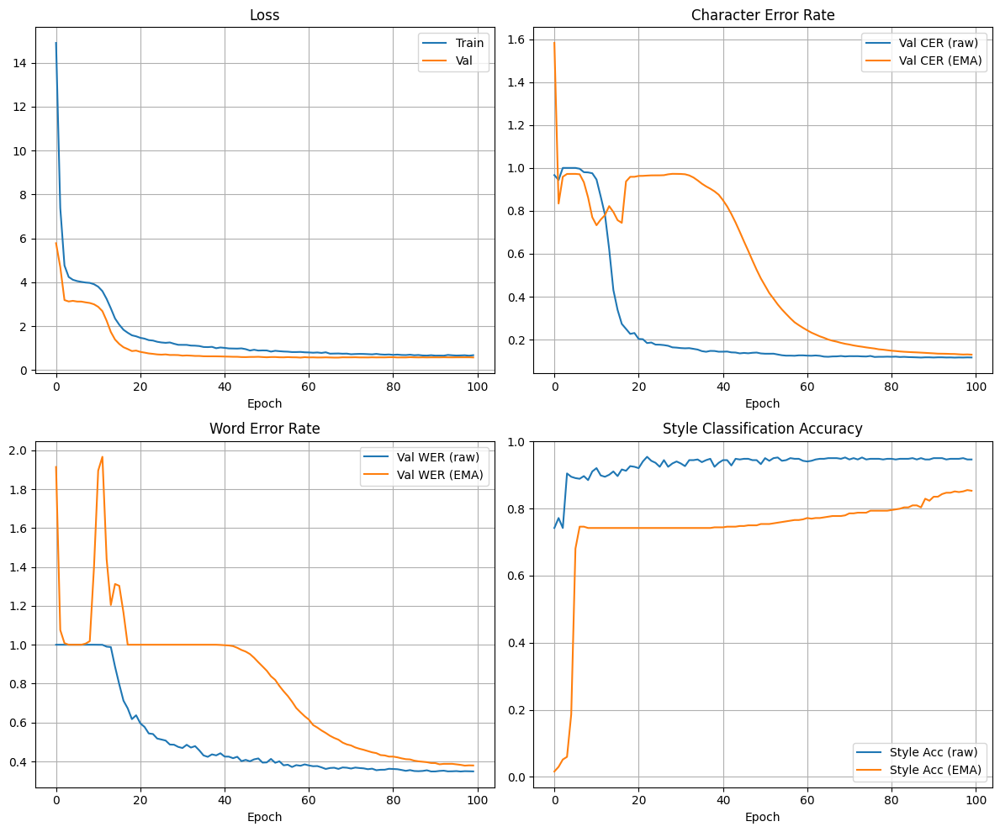


TEST EVALUATION

TEST (Best EMA) — CER=0.1337 | WER=0.3958 | Style Acc=0.8413


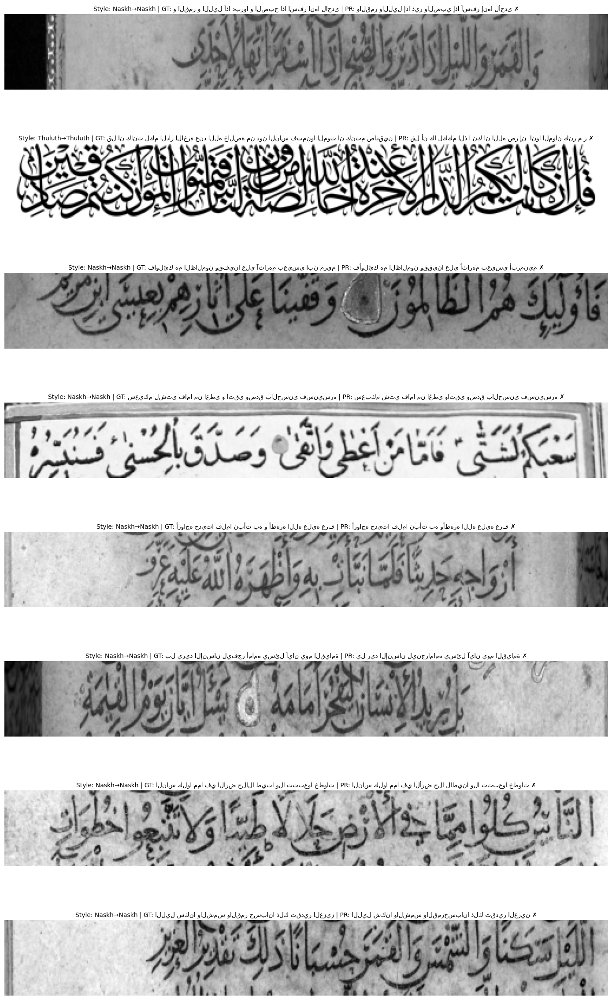


FINAL SUMMARY
Dataset: Set1 + Set2 + Set3 = 5,032 images
Classes: 5 styles
Charset: 50 characters
Model parameters: 30,386,473

Best Validation CER (RAW): 0.1165
Best Validation CER (EMA): 0.1303

Test Metrics:
  - CER: 0.1337
  - WER: 0.3958
  - Style Accuracy: 0.8413

Checkpoints saved to: checkpoints
✅ December Run Complete!


In [ ]:
# %% DECEMBER RUNS v2 - Fixed Multi-Set OCR Pipeline (L4 GPU Optimized)
# ====================== Setup / Installs ======================
from google.colab import drive
drive.mount('/content/drive')

# Extract all 3 sets to local storage for faster I/O
import zipfile
import os

DRIVE_BASE = "/content/drive/MyDrive/Full_Dataset/Full_Dataset"
LOCAL_BASE = "/content/dataset"
os.makedirs(LOCAL_BASE, exist_ok=True)

for set_name in ["Set1", "Set2", "Set3"]:
    zip_path = f"{DRIVE_BASE}/{set_name}.zip"
    extract_dir = f"{LOCAL_BASE}/{set_name}"
    if os.path.exists(zip_path):
        print(f"Extracting {set_name}...")
        with zipfile.ZipFile(zip_path, 'r') as zf:
            zf.extractall(LOCAL_BASE)
        print(f"  ✓ {set_name} extracted to {extract_dir}")
    else:
        print(f"  ⚠ {zip_path} not found, skipping...")

!pip -q install albumentations==1.4.7 editdistance==0.8.1 tqdm

# ====================== Imports ======================
import time, random, unicodedata, warnings, math, gc
from pathlib import Path
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2, editdistance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import albumentations as A
from torchvision import models

warnings.filterwarnings("ignore", category=UserWarning)
cv2.setNumThreads(0)

# ====================== Reproducibility & Device ======================
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")
if DEVICE == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Total VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

def human(n): return f"{n:,}"

# Use bfloat16 for better numerical stability (L4 supports it well)
def autocast_cuda():
    return torch.amp.autocast("cuda", enabled=(DEVICE=="cuda"), dtype=torch.bfloat16)

def gpu_mem():
    if DEVICE == "cuda":
        a = torch.cuda.memory_allocated()/1e9
        r = torch.cuda.memory_reserved()/1e9
        t = torch.cuda.get_device_properties(0).total_memory/1e9
        return f"GPU: {a:.2f}/{r:.2f}/{t:.1f}GB"
    return "CPU"

# ====================== Data Paths ======================
LOCAL_BASE = Path("/content/dataset")
CSV_PATH = Path("/content/drive/MyDrive/Full_Dataset/Full_Dataset/labels_fixed.csv")
assert CSV_PATH.exists(), f"CSV not found: {CSV_PATH}"
print(f"Labels CSV: {CSV_PATH}")

# ====================== Load & Merge All Sets ======================
df = pd.read_csv(CSV_PATH)
assert {'img_name', 'label', 'class'}.issubset(df.columns), f"Missing columns. Found: {df.columns.tolist()}"

def normalize_label(s: str) -> str:
    return unicodedata.normalize("NFC", str(s)).strip()

df['label'] = df['label'].astype(str).apply(normalize_label)

# Build image paths based on Set prefix in img_name
def get_img_path(img_name):
    for set_num in [1, 2, 3]:
        prefix = f"Set{set_num}_"
        if img_name.startswith(prefix):
            actual_name = img_name[len(prefix):]
            return str(LOCAL_BASE / f"Set{set_num}" / "images" / actual_name)
    for set_num in [1, 2, 3]:
        path = LOCAL_BASE / f"Set{set_num}" / "images" / img_name
        if path.exists():
            return str(path)
    return None

df['img_path'] = df['img_name'].apply(get_img_path)

before_filter = len(df)
df = df[df['img_path'].apply(lambda p: p is not None and Path(p).exists())].reset_index(drop=True)
print(f"Images found: {human(len(df))} / {human(before_filter)} ({100*len(df)/before_filter:.1f}%)")

# ====================== Charset ======================
char_counts = Counter()
for s in df['label']:
    for ch in s:
        char_counts[ch] += 1

charset = ['<BLANK>'] + sorted(char_counts.keys(), key=lambda c: (-char_counts[c], ord(c)))
char2idx = {c: i for i, c in enumerate(charset)}
idx2char = {i: c for c, i in char2idx.items()}
BLANK_IDX = 0
print(f"Charset size (incl <BLANK>): {len(charset)}")

# ====================== Style Classes ======================
style_names = sorted(df['class'].fillna("Unknown").unique().tolist())
style2idx = {s: i for i, s in enumerate(style_names)}
idx2style = {i: s for s, i in style2idx.items()}
print(f"Styles ({len(style_names)}): {style_names}")

# ====================== Class Distribution Analysis ======================
print("\n" + "="*60)
print("CLASS DISTRIBUTION ANALYSIS")
print("="*60)
class_counts = df['class'].value_counts()
print(class_counts)
print(f"\nMax class: {class_counts.max()} | Min class: {class_counts.min()}")
print(f"Imbalance ratio: {class_counts.max() / class_counts.min():.2f}x")

# ====================== Encode Labels ======================
RTL_REVERSE = True

def encode_label(text, rtl_reverse=True):
    if rtl_reverse:
        text = text[::-1]
    ids = [char2idx[ch] for ch in text if ch in char2idx and ch != '<BLANK>']
    return ids

df['enc_len'] = df['label'].apply(lambda s: len(encode_label(s, RTL_REVERSE)))
before = len(df)
df = df[df['enc_len'] > 0].reset_index(drop=True)
print(f"Filtered empty labels: {human(before)} -> {human(len(df))}")

# ====================== Train/Val/Test Split ======================
train_df, test_df = train_test_split(
    df, test_size=0.10, random_state=SEED, stratify=df['class'].fillna("Unknown")
)
train_df, val_df = train_test_split(
    train_df, test_size=0.1111, random_state=SEED, stratify=train_df['class'].fillna("Unknown")
)
print(f"\nTrain: {human(len(train_df))} | Val: {human(len(val_df))} | Test: {human(len(test_df))}")

# ====================== Class Balancing - SMARTER APPROACH ======================
print("\n" + "="*60)
print("HANDLING CLASS IMBALANCE")
print("="*60)

train_class_counts = train_df['class'].value_counts()
# Use sqrt-based rebalancing instead of full equalization (less aggressive)
# This prevents oversampling tiny classes too much which causes instability
median_count = train_class_counts.median()
class_weights = {}
for cls, count in train_class_counts.items():
    # Sqrt scaling: minority classes get boosted but not to full parity
    weight = np.sqrt(median_count / count)
    weight = np.clip(weight, 1.0, 10.0)  # Cap maximum oversampling at 10x
    class_weights[cls] = weight

sample_weights = train_df['class'].map(class_weights).values
sample_weights = torch.DoubleTensor(sample_weights)

# Effective samples calculation
effective_per_class = {cls: int(count * class_weights[cls]) for cls, count in train_class_counts.items()}
effective_total = sum(effective_per_class.values())
print("Effective samples per class (sqrt-scaled, capped at 10x):")
for cls in style_names:
    orig = train_class_counts.get(cls, 0)
    eff = effective_per_class.get(cls, 0)
    w = class_weights.get(cls, 1.0)
    print(f"  {cls}: {orig} -> ~{eff} (weight={w:.2f}x)")
print(f"Total effective samples/epoch: {effective_total}")

# ====================== Image Processing ======================
H_TARGET = 64
W_MAX = 512
MEAN, STD = 0.5, 0.5
MIN_PX_PER_CHAR = 8

def decode_pred(indices, rtl_reverse=RTL_REVERSE):
    res, prev = [], None
    for idx in indices:
        if idx != BLANK_IDX and idx != prev:
            res.append(idx2char[idx])
        prev = idx
    s = "".join(res)
    return s[::-1] if rtl_reverse else s

def resize_keep_ar_enforced(gray, h=H_TARGET, label_len=0, min_px_per_char=MIN_PX_PER_CHAR, min_w=16, w_max=W_MAX):
    h0, w0 = gray.shape[:2]
    base_scale = h / float(h0)
    req_w = max(min_w, min(w_max, label_len * min_px_per_char))
    scale_w = req_w / float(w0)
    scale = max(base_scale, scale_w)
    new_w = int(np.clip(np.ceil(w0 * scale), min_w, w_max))
    interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
    return cv2.resize(gray, (new_w, h), interpolation=interp)

def pad_width_to_multiple(img, multiple=4, pad_value=255):
    h, w = img.shape
    pad_w = (multiple - (w % multiple)) % multiple
    if pad_w == 0:
        return img
    return cv2.copyMakeBorder(img, 0, 0, 0, pad_w, cv2.BORDER_CONSTANT, value=pad_value)

# ====================== Augmentations (moderate) ======================
AUG_P = 0.35

def stroke_thickness_jitter(img, p=0.5):
    if random.random() > p:
        return img
    k = random.choice([1, 1, 2])
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*k+1, 2*k+1))
    if random.random() < 0.5:
        img = cv2.erode(img, kernel, iterations=1)
    else:
        img = cv2.dilate(img, kernel, iterations=1)
    return img

def cutout_stripes(img, max_stripes=2, max_frac=0.10, p=0.3):
    if random.random() > p:
        return img
    h, w = img.shape
    n = random.randint(1, max_stripes)
    for _ in range(n):
        stripe_w = max(2, int(random.random() * max(3, w * max_frac)))
        x0 = random.randint(0, max(0, w - stripe_w))
        img[:, x0:x0+stripe_w] = 255
    return img

train_aug = A.Compose([
    A.ImageCompression(quality_lower=60, quality_upper=95, p=AUG_P),
    A.MotionBlur(blur_limit=3, p=AUG_P * 0.7),
    A.GaussNoise(var_limit=(5.0, 20.0), p=AUG_P * 0.8),
    A.Perspective(scale=(0.02, 0.06), keep_size=True, pad_mode=cv2.BORDER_REPLICATE, p=AUG_P),
    A.ShiftScaleRotate(shift_limit=0.01, scale_limit=0.02, rotate_limit=3, border_mode=cv2.BORDER_REPLICATE, p=AUG_P * 0.8),
    A.CoarseDropout(max_holes=3, max_height=8, max_width=20, fill_value=255, p=AUG_P * 0.5),
    A.RandomBrightnessContrast(brightness_limit=0.08, contrast_limit=0.08, p=AUG_P * 0.8),
])

def apply_train_aug(img):
    img = stroke_thickness_jitter(img, p=0.4)
    img = cutout_stripes(img, p=0.25)
    return train_aug(image=img)["image"]

# ====================== Dataset ======================
class OCRDataset(Dataset):
    def __init__(self, frame: pd.DataFrame, training=True):
        self.df = frame.reset_index(drop=True)
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = cv2.imread(row['img_path'], cv2.IMREAD_GRAYSCALE)
        if img is None:
            # Return a dummy sample if image fails to load
            img = np.ones((H_TARGET, 64), dtype=np.uint8) * 255

        label_str = row['label']
        label_ids = encode_label(label_str, RTL_REVERSE)
        style_idx = style2idx[row['class']]

        img = resize_keep_ar_enforced(img, H_TARGET, label_len=len(label_ids))
        if self.training:
            img = apply_train_aug(img)
        img = pad_width_to_multiple(img, multiple=4, pad_value=255)

        img = img.astype(np.float32) / 255.0
        img = (img - MEAN) / STD
        img_t = torch.from_numpy(img)[None, ...]

        return img_t, torch.tensor(label_ids, dtype=torch.long), label_str, torch.tensor(style_idx), row['class'], img_t.shape[-1]

def collate_fn(batch):
    batch = sorted(batch, key=lambda x: x[-1], reverse=True)
    imgs, labels, label_strs, style_idxs, style_names_b, widths = zip(*batch)
    max_w = max(widths)
    bsz = len(imgs)
    padded = torch.full((bsz, 1, H_TARGET, max_w), (0.0 - MEAN) / STD, dtype=torch.float32)
    for i, im in enumerate(imgs):
        w = im.shape[-1]
        padded[i, :, :, :w] = im
    label_lens = torch.tensor([len(l) for l in labels], dtype=torch.long)
    labels_concat = torch.cat(labels, dim=0) if len(labels) and sum(label_lens).item() > 0 else torch.tensor([], dtype=torch.long)
    return padded, labels_concat, label_lens, label_strs, torch.stack(style_idxs), style_names_b, torch.tensor(widths, dtype=torch.long)

# ====================== Model Architecture ======================
print("\n" + "="*60)
print("MODEL ARCHITECTURE")
print("="*60)

try:
    _IMAGENET_WEIGHTS = models.ResNet34_Weights.IMAGENET1K_V1
except:
    _IMAGENET_WEIGHTS = "IMAGENET1K_V1"

class ResNet34OCRBackbone(nn.Module):
    """ResNet34 backbone adapted for OCR (preserves width dimension)."""
    def __init__(self, in_ch=1):
        super().__init__()
        try:
            m = models.resnet34(weights=_IMAGENET_WEIGHTS)
        except TypeError:
            m = models.resnet34(pretrained=True)

        with torch.no_grad():
            w = m.conv1.weight.data
            new_w = w.mean(dim=1, keepdim=True)
        m.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=(2, 1), padding=3, bias=False)
        with torch.no_grad():
            m.conv1.weight.copy_(new_w)

        m.maxpool = nn.MaxPool2d(kernel_size=3, stride=(2, 1), padding=1)

        def set_layer_height_only(layer):
            b0 = layer[0]
            b0.conv1.stride = (2, 1)
            if b0.downsample is not None and isinstance(b0.downsample, nn.Sequential):
                ds0 = b0.downsample[0]
                if isinstance(ds0, nn.Conv2d):
                    ds0.stride = (2, 1)

        set_layer_height_only(m.layer2)
        set_layer_height_only(m.layer3)
        set_layer_height_only(m.layer4)

        self.stem = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1 = m.layer1
        self.layer2 = m.layer2
        self.layer3 = m.layer3
        self.layer4 = m.layer4
        self.out = nn.AdaptiveAvgPool2d((1, None))

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        fmap = x
        seq = self.out(fmap).squeeze(2).permute(2, 0, 1)
        return seq, fmap

class TemporalGLUBlock(nn.Module):
    """Temporal convolution with GLU gating."""
    def __init__(self, c=512, k=5, dilation=1, p=0.1):
        super().__init__()
        pad = (k - 1) // 2 * dilation
        self.conv = nn.Conv1d(c, 2 * c, kernel_size=k, padding=pad, dilation=dilation)
        self.glu = nn.GLU(dim=1)
        self.drop = nn.Dropout(p)
        self.res = nn.Conv1d(c, c, kernel_size=1)

    def forward(self, x):
        x = x.permute(1, 2, 0)
        y = self.glu(self.conv(x))
        y = self.drop(y) + self.res(x)
        return y.permute(2, 0, 1)

class BiLSTMStack(nn.Module):
    """Stacked bidirectional LSTM."""
    def __init__(self, in_dim, hidden=256, num_layers=2, dropout=0.25):
        super().__init__()
        layers = []
        for i in range(num_layers):
            inp = in_dim if i == 0 else hidden * 2
            layers.append(nn.LSTM(inp, hidden, bidirectional=True, batch_first=False))
            layers.append(nn.Dropout(dropout))
        self.layers = nn.ModuleList(layers)

    def forward(self, x):
        for i in range(0, len(self.layers), 2):
            x, _ = self.layers[i](x)
            x = self.layers[i + 1](x)
        return x

class OCR_MultiTask_V3(nn.Module):
    """
    Improved OCR model:
    - ResNet34 backbone
    - TCN blocks for temporal modeling
    - BiLSTM sequence model
    - Auxiliary CTC head
    - Style classification head
    """
    def __init__(self, num_chars, num_styles, blank_idx=0, aux_weight=0.3):
        super().__init__()
        self.backbone = ResNet34OCRBackbone(in_ch=1)

        # Temporal modeling
        self.tcn1 = TemporalGLUBlock(512, k=5, dilation=1, p=0.1)
        self.tcn2 = TemporalGLUBlock(512, k=5, dilation=2, p=0.1)

        # BiLSTM
        self.lstm = BiLSTMStack(in_dim=512, hidden=256, num_layers=2, dropout=0.25)

        # CTC heads
        self.ctc_head_main = nn.Linear(512, num_chars)
        self.ctc_head_aux = nn.Linear(512, num_chars)

        # Style classification
        self.style_head = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)), nn.Flatten(),
            nn.Dropout(0.25),
            nn.Linear(512, max(256, num_styles * 4)), nn.ReLU(True),
            nn.Linear(max(256, num_styles * 4), num_styles)
        )

        self.blank_idx = blank_idx
        self.aux_weight = aux_weight

        # Initialize CTC head biases
        with torch.no_grad():
            self.ctc_head_main.bias.zero_()
            self.ctc_head_main.bias[blank_idx] = -2.0
            self.ctc_head_aux.bias.zero_()
            self.ctc_head_aux.bias[blank_idx] = -2.0

    def forward(self, x):
        seq_feats, fmap = self.backbone(x)

        # TCN
        tcn_out = self.tcn2(self.tcn1(seq_feats))

        # BiLSTM
        lstm_out = self.lstm(tcn_out)

        # CTC outputs
        ctc_logits_main = self.ctc_head_main(lstm_out)
        ctc_logits_aux = self.ctc_head_aux(tcn_out)

        # Style classification (detach to reduce gradient conflict)
        style_logits = self.style_head(fmap.detach())

        return ctc_logits_main, ctc_logits_aux, style_logits

# ====================== Training Configuration (L4 Optimized) ======================
# INCREASED batch size to better utilize L4's 23.8GB VRAM
BATCH_SIZE = 128  # Increased from 96
EPOCHS = 100
INIT_LR_HEAD = 8e-4
INIT_LR_BB = 2e-4
WEIGHT_DECAY = 1e-4
MAX_NORM = 5.0  # More relaxed gradient clipping
LAMBDA_CLS = 0.2
AUX_CTC_WEIGHT = 0.3

# Sampler with effective samples
sampler = WeightedRandomSampler(sample_weights, num_samples=effective_total, replacement=True)

# ====================== Dataloaders ======================
train_ds = OCRDataset(train_df, training=True)
val_ds = OCRDataset(val_df, training=False)
test_ds = OCRDataset(test_df, training=False)

NUM_WORKERS = 4
loader_kwargs = dict(collate_fn=collate_fn, pin_memory=True, num_workers=NUM_WORKERS, persistent_workers=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=sampler, **loader_kwargs)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, **loader_kwargs)

print(f"Train loader: {len(train_loader)} batches (with balanced sampling)")
print(f"Val loader: {len(val_loader)} batches")
print(f"Test loader: {len(test_loader)} batches")

# ====================== Model & Optimizer ======================
num_chars = len(charset)
num_styles = len(style_names)
model = OCR_MultiTask_V3(num_chars, num_styles, blank_idx=BLANK_IDX, aux_weight=AUX_CTC_WEIGHT).to(DEVICE)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters: {human(total_params)}")
print(f"Trainable parameters: {human(trainable_params)}")

ctc_loss_fn = nn.CTCLoss(blank=BLANK_IDX, reduction='mean', zero_infinity=True)
cls_loss_fn = nn.CrossEntropyLoss(label_smoothing=0.05)

# Parameter groups
bb_params = list(model.backbone.parameters())
mid_params = list(model.tcn1.parameters()) + list(model.tcn2.parameters()) + list(model.lstm.parameters())
head_params = list(model.ctc_head_main.parameters()) + list(model.ctc_head_aux.parameters()) + list(model.style_head.parameters())

optimizer = torch.optim.AdamW([
    {"params": bb_params, "lr": INIT_LR_BB},
    {"params": mid_params, "lr": INIT_LR_HEAD},
    {"params": head_params, "lr": INIT_LR_HEAD}
], weight_decay=WEIGHT_DECAY)

# CosineAnnealing - more stable than OneCycleLR
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

# GradScaler with growth interval to prevent NaN
scaler = torch.amp.GradScaler("cuda", enabled=(DEVICE == "cuda"), growth_interval=2000)

# ====================== EMA ======================
class EMA:
    def __init__(self, model, decay=0.999):
        self.decay = decay
        self.shadow = {k: v.detach().clone() for k, v in model.state_dict().items()}

    @torch.no_grad()
    def update(self, model):
        for k, v in model.state_dict().items():
            if v.dtype.is_floating_point:
                self.shadow[k].mul_(self.decay).add_(v, alpha=1.0 - self.decay)
            else:
                self.shadow[k] = v.clone()

    def apply_to(self, model):
        self._backup = {k: v.clone() for k, v in model.state_dict().items()}
        model.load_state_dict(self.shadow, strict=False)

    def restore(self, model):
        model.load_state_dict(self._backup, strict=False)
        del self._backup

ema = EMA(model, decay=0.999)

# ====================== Metrics ======================
def cer(ref, hyp):
    return 0.0 if (len(ref) == 0 and len(hyp) == 0) else editdistance.eval(ref, hyp) / max(1, len(ref))

def wer(ref, hyp):
    r, h = ref.split(), hyp.split()
    return 0.0 if (len(r) == 0 and len(h) == 0) else editdistance.eval(r, h) / max(1, len(r))

def ctc_time_lengths(widths):
    return torch.clamp(widths, min=1)

@torch.no_grad()
def greedy_decode_ctc(logits, out_lens):
    max_idxs = logits.softmax(dim=-1).argmax(dim=-1)
    T, B = max_idxs.shape
    dec = []
    for b in range(B):
        L = int(out_lens[b])
        seq = max_idxs[:L, b].tolist()
        dec.append(decode_pred(seq))
    return dec

# ====================== Evaluation ======================
@torch.no_grad()
def evaluate(model, loader, use_ema=False):
    if use_ema:
        ema.apply_to(model)
    model.eval()

    tot_loss = tot_cer = tot_wer = 0.0
    cnt = 0
    cls_correct = cls_total = 0

    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in loader:
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)

        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)

        if len(labels_concat) > 0:
            loss_ctc = ctc_loss_fn(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
        else:
            loss_ctc = torch.tensor(0., device=DEVICE)
        loss_cls = cls_loss_fn(style_logits, style_idxs)
        loss = loss_ctc + LAMBDA_CLS * loss_cls

        B = imgs.size(0)
        tot_loss += loss.item() * B
        cnt += B

        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr)
            tot_wer += wer(gt, pr)

        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total += B

    if use_ema:
        ema.restore(model)

    return {
        "loss": tot_loss / cnt if cnt else None,
        "cer": tot_cer / cnt if cnt else None,
        "wer": tot_wer / cnt if cnt else None,
        "style_acc": cls_correct / cls_total if cls_total > 0 else None
    }

# ====================== Training Loop ======================
print("\n" + "="*60)
print("TRAINING")
print("="*60)

SAVE_DIR = Path("./checkpoints")
SAVE_DIR.mkdir(parents=True, exist_ok=True)
BEST_PATH = SAVE_DIR / "ocr_december_best.pt"
BEST_EMA_PATH = SAVE_DIR / "ocr_december_best_ema.pt"

history = {
    "train_loss": [], "val_loss": [],
    "val_cer_raw": [], "val_cer_ema": [],
    "val_wer_raw": [], "val_wer_ema": [],
    "val_style_acc_raw": [], "val_style_acc_ema": []
}

best_cer_raw = float('inf')
best_cer_ema = float('inf')

# Freeze backbone for warmup
for p in model.backbone.parameters():
    p.requires_grad = False
print("Backbone frozen for warmup epoch.")

steps_per_epoch = len(train_loader)
print(f"\n[Training] Epochs={EPOCHS}, Batch={BATCH_SIZE}, Steps/epoch={steps_per_epoch}")
print(f"Device: {DEVICE} | {gpu_mem()}\n")

for epoch in range(1, EPOCHS + 1):
    model.train()
    running = 0.0
    seen = 0
    nan_batches = 0
    t0 = time.time()

    # Unfreeze backbone after warmup
    if epoch == 2:
        for p in model.backbone.parameters():
            p.requires_grad = True
        print("Backbone unfrozen.")

    pbar = tqdm(enumerate(train_loader), total=len(train_loader), desc=f"Epoch {epoch:03d}", leave=False)
    for bidx, (imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths) in pbar:
        imgs = imgs.to(DEVICE, non_blocking=True)
        style_idxs = style_idxs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)

        optimizer.zero_grad(set_to_none=True)

        with autocast_cuda():
            ctc_logits_main, ctc_logits_aux, style_logits = model(imgs)
            log_probs_main = ctc_logits_main.log_softmax(2)

            if len(labels_concat) > 0:
                loss_ctc_main = ctc_loss_fn(log_probs_main.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
                log_probs_aux = ctc_logits_aux.log_softmax(2)
                loss_ctc_aux = ctc_loss_fn(log_probs_aux.float(), labels_concat.to(DEVICE), input_lens, label_lens.to(DEVICE))
            else:
                loss_ctc_main = torch.tensor(0., device=DEVICE)
                loss_ctc_aux = torch.tensor(0., device=DEVICE)

            loss_cls = cls_loss_fn(style_logits, style_idxs)
            loss = loss_ctc_main + AUX_CTC_WEIGHT * loss_ctc_aux + LAMBDA_CLS * loss_cls

        # Check for NaN and skip batch if needed
        if torch.isnan(loss) or torch.isinf(loss):
            nan_batches += 1
            scaler.update()  # Still update scaler to adjust scale
            continue

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), MAX_NORM)
        scaler.step(optimizer)
        scaler.update()
        ema.update(model)

        running += loss.item() * imgs.size(0)
        seen += imgs.size(0)
        pbar.set_postfix(loss=f"{loss.item():.3f}", avg=f"{running/max(1,seen):.3f}")

    scheduler.step()
    train_loss = running / max(1, seen) if seen > 0 else float('nan')
    history["train_loss"].append(train_loss)

    if nan_batches > 0:
        print(f"  Warning: {nan_batches} batches skipped due to NaN loss")

    # Validation
    val_raw = evaluate(model, val_loader, use_ema=False)
    val_ema = evaluate(model, val_loader, use_ema=True)

    history["val_loss"].append(val_raw["loss"])
    history["val_cer_raw"].append(val_raw["cer"])
    history["val_cer_ema"].append(val_ema["cer"])
    history["val_wer_raw"].append(val_raw["wer"])
    history["val_wer_ema"].append(val_ema["wer"])
    history["val_style_acc_raw"].append(val_raw["style_acc"])
    history["val_style_acc_ema"].append(val_ema["style_acc"])

    dt = time.time() - t0
    print(f"Epoch {epoch:03d}/{EPOCHS} | train={train_loss:.3f} | "
          f"val_raw: CER={val_raw['cer']:.4f} WER={val_raw['wer']:.4f} style={val_raw['style_acc']:.3f} | "
          f"val_EMA: CER={val_ema['cer']:.4f} WER={val_ema['wer']:.4f} style={val_ema['style_acc']:.3f} | "
          f"{dt:.1f}s | {gpu_mem()}")

    # Save best RAW model
    if val_raw["cer"] is not None and val_raw["cer"] < best_cer_raw:
        best_cer_raw = val_raw["cer"]
        torch.save({
            "epoch": epoch,
            "model": model.state_dict(),
            "optimizer": optimizer.state_dict(),
            "charset": charset,
            "style_names": style_names,
            "config": {"H_TARGET": H_TARGET, "RTL_REVERSE": RTL_REVERSE},
            "metrics": val_raw
        }, BEST_PATH)
        print(f"  ✓ New best RAW CER={best_cer_raw:.4f} saved to {BEST_PATH}")

    # Save best EMA model
    if val_ema["cer"] is not None and val_ema["cer"] < best_cer_ema:
        best_cer_ema = val_ema["cer"]
        ema.apply_to(model)
        torch.save({
            "epoch": epoch,
            "model": model.state_dict(),
            "charset": charset,
            "style_names": style_names,
            "config": {"H_TARGET": H_TARGET, "RTL_REVERSE": RTL_REVERSE},
            "metrics": val_ema
        }, BEST_EMA_PATH)
        ema.restore(model)
        print(f"  ✓ New best EMA CER={best_cer_ema:.4f} saved to {BEST_EMA_PATH}")

    # Memory cleanup every 10 epochs
    if epoch % 10 == 0:
        gc.collect()
        torch.cuda.empty_cache()

print("\n[Training] Complete!")
print(f"Best RAW CER: {best_cer_raw:.4f}")
print(f"Best EMA CER: {best_cer_ema:.4f}")

# ====================== Training Curves ======================
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0, 0].plot(history["train_loss"], label="Train")
axes[0, 0].plot(history["val_loss"], label="Val")
axes[0, 0].set_title("Loss")
axes[0, 0].set_xlabel("Epoch")
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(history["val_cer_raw"], label="Val CER (raw)")
axes[0, 1].plot(history["val_cer_ema"], label="Val CER (EMA)")
axes[0, 1].set_title("Character Error Rate")
axes[0, 1].set_xlabel("Epoch")
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[1, 0].plot(history["val_wer_raw"], label="Val WER (raw)")
axes[1, 0].plot(history["val_wer_ema"], label="Val WER (EMA)")
axes[1, 0].set_title("Word Error Rate")
axes[1, 0].set_xlabel("Epoch")
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(history["val_style_acc_raw"], label="Style Acc (raw)")
axes[1, 1].plot(history["val_style_acc_ema"], label="Style Acc (EMA)")
axes[1, 1].set_title("Style Classification Accuracy")
axes[1, 1].set_xlabel("Epoch")
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.savefig(SAVE_DIR / "training_curves.png", dpi=150)
plt.show()

# ====================== Test Evaluation ======================
print("\n" + "="*60)
print("TEST EVALUATION")
print("="*60)

ckpt = torch.load(BEST_EMA_PATH, map_location=DEVICE)
model.load_state_dict(ckpt["model"], strict=False)
model.eval()

test_metrics = evaluate(model, test_loader, use_ema=False)
print(f"\nTEST (Best EMA) — CER={test_metrics['cer']:.4f} | WER={test_metrics['wer']:.4f} | "
      f"Style Acc={test_metrics['style_acc']:.4f}")

# ====================== Qualitative Samples ======================
@torch.no_grad()
def show_samples(model, loader, k=8):
    model.eval()
    imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths = next(iter(loader))
    imgs = imgs.to(DEVICE)

    ctc_logits_main, _, style_logits = model(imgs)
    preds = greedy_decode_ctc(ctc_logits_main, ctc_time_lengths(widths))
    style_pred = style_logits.softmax(1).argmax(1).cpu().tolist()

    fig, axes = plt.subplots(k, 1, figsize=(14, 3*k))
    for i in range(min(k, imgs.size(0))):
        im = imgs[i, 0].cpu().numpy()
        im = np.clip(im * STD + MEAN, 0, 1)

        gt_style = style_names_b[i]
        pr_style = idx2style[style_pred[i]]
        gt_text = label_strs[i]
        pr_text = preds[i]
        match = "✓" if gt_text == pr_text else "✗"

        axes[i].imshow(im, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f"Style: {gt_style}→{pr_style} | GT: {gt_text} | PR: {pr_text} {match}", fontsize=10)

    plt.tight_layout()
    plt.savefig(SAVE_DIR / "sample_predictions.png", dpi=150)
    plt.show()

show_samples(model, test_loader, k=8)

# ====================== Final Summary ======================
print("\n" + "="*60)
print("FINAL SUMMARY")
print("="*60)
print(f"Dataset: Set1 + Set2 + Set3 = {human(len(df))} images")
print(f"Classes: {len(style_names)} styles")
print(f"Charset: {len(charset)} characters")
print(f"Model parameters: {human(total_params)}")
print(f"\nBest Validation CER (RAW): {best_cer_raw:.4f}")
print(f"Best Validation CER (EMA): {best_cer_ema:.4f}")
print(f"\nTest Metrics:")
print(f"  - CER: {test_metrics['cer']:.4f}")
print(f"  - WER: {test_metrics['wer']:.4f}")
print(f"  - Style Accuracy: {test_metrics['style_acc']:.4f}")
print(f"\nCheckpoints saved to: {SAVE_DIR}")
print("✅ December Run Complete!")

## BASELINE MODEL VISUALIZATION:

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
  ✓ Set1 already extracted
  ✓ Set2 already extracted
  ✓ Set3 already extracted
Device: cuda
GPU: NVIDIA L4
Total VRAM: 23.8 GB
Labels CSV: /content/drive/MyDrive/Full_Dataset/Full_Dataset/labels_fixed.csv
Images found: 5,032 / 5,035 (99.9%)
Charset size (incl <BLANK>): 50
Styles (5): ['Diwani', 'Kufic', 'Muhaquaq', 'Naskh', 'Thuluth']
Filtered empty labels: 5,032 -> 5,032

Test set: 504 images

LOADING PRETRAINED MODEL
✓ Model loaded from: /content/checkpoints/ocr_december_best_ema.pt
  Checkpoint metrics: {'loss': 0.5893639836992536, 'cer': 0.13032466929907377, 'wer': 0.3791996774752383, 'style_acc': 0.8531746031746031}
Test loader: 8 batches

TEST EVALUATION


Evaluating:   0%|          | 0/8 [00:00<?, ?it/s]


TEST RESULTS:
  - CER: 0.1338
  - WER: 0.3953
  - Style Accuracy: 0.8413

SAMPLE PREDICTIONS (Proper Arabic Display)


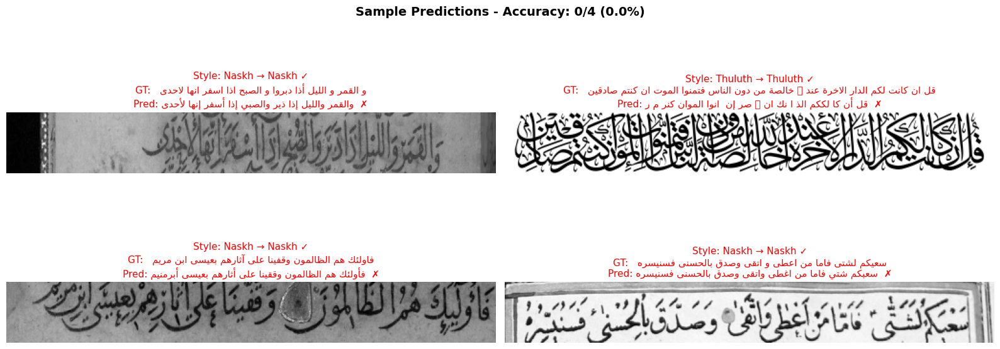


✓ Saved to /content/sample_predictions_arabic.png
  Sample accuracy: 0/4 (0.0%)

PER-CLASS ANALYSIS


Per-class eval:   0%|          | 0/8 [00:00<?, ?it/s]


Class                CER        WER        Style Acc    Samples   
--------------------------------------------------------------
Diwani               0.2834     0.6391     0.2500       24        
Kufic                0.0833     0.3333     0.0000       3         
Muhaquaq             0.0200     0.0833     0.0000       2         
Naskh                0.0838     0.3300     0.9920       374       
Thuluth              0.2870     0.5874     0.4653       101       

RANDOM SAMPLES FROM EACH CLASS


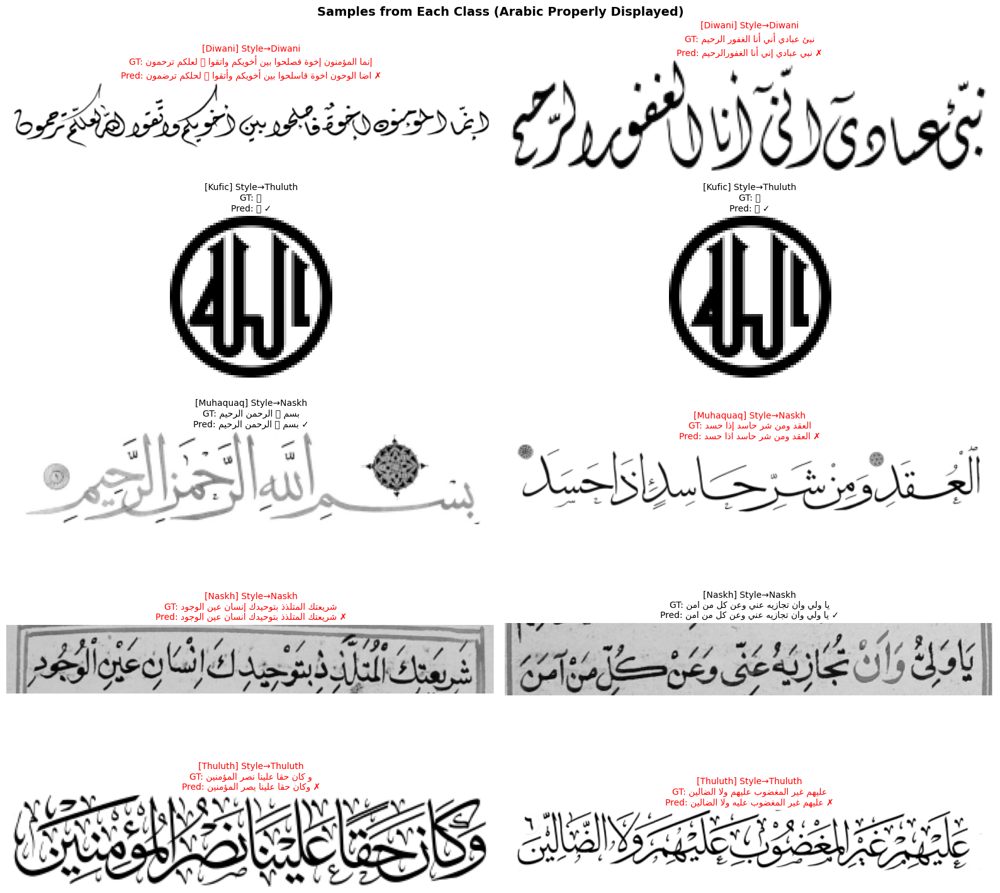


✓ Saved to /content/class_samples_arabic.png

✅ EVALUATION COMPLETE!


In [4]:
# %% BASELINE EVALUATION - Arabic Text Display Fixed
# ====================== Setup / Installs ======================
from google.colab import drive
drive.mount('/content/drive')

# Extract all 3 sets to local storage for faster I/O
import zipfile
import os

DRIVE_BASE = "/content/drive/MyDrive/Full_Dataset/Full_Dataset"
LOCAL_BASE = "/content/dataset"
os.makedirs(LOCAL_BASE, exist_ok=True)

for set_name in ["Set1", "Set2", "Set3"]:
    zip_path = f"{DRIVE_BASE}/{set_name}.zip"
    extract_dir = f"{LOCAL_BASE}/{set_name}"
    if not os.path.exists(extract_dir):  # Only extract if not already done
        if os.path.exists(zip_path):
            print(f"Extracting {set_name}...")
            with zipfile.ZipFile(zip_path, 'r') as zf:
                zf.extractall(LOCAL_BASE)
            print(f"  ✓ {set_name} extracted to {extract_dir}")
        else:
            print(f"  ⚠ {zip_path} not found, skipping...")
    else:
        print(f"  ✓ {set_name} already extracted")

!pip -q install albumentations==1.4.7 editdistance==0.8.1 tqdm arabic-reshaper python-bidi

# ====================== Imports ======================
import time, random, unicodedata, warnings, math, gc
from pathlib import Path
from collections import Counter, defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2, editdistance

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
import albumentations as A
from torchvision import models

# Arabic text display imports
import arabic_reshaper
from bidi.algorithm import get_display

warnings.filterwarnings("ignore", category=UserWarning)
cv2.setNumThreads(0)

# ====================== Reproducibility & Device ======================
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED); torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.benchmark = True
torch.backends.cudnn.deterministic = False
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")
if DEVICE == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Total VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

def human(n): return f"{n:,}"

def autocast_cuda():
    return torch.amp.autocast("cuda", enabled=(DEVICE=="cuda"), dtype=torch.bfloat16)

# ====================== Data Paths ======================
LOCAL_BASE = Path("/content/dataset")
CSV_PATH = Path("/content/drive/MyDrive/Full_Dataset/Full_Dataset/labels_fixed.csv")
assert CSV_PATH.exists(), f"CSV not found: {CSV_PATH}"
print(f"Labels CSV: {CSV_PATH}")

# ====================== Load & Merge All Sets ======================
df = pd.read_csv(CSV_PATH)
assert {'img_name', 'label', 'class'}.issubset(df.columns), f"Missing columns. Found: {df.columns.tolist()}"

def normalize_label(s: str) -> str:
    return unicodedata.normalize("NFC", str(s)).strip()

df['label'] = df['label'].astype(str).apply(normalize_label)

# Build image paths based on Set prefix in img_name
def get_img_path(img_name):
    for set_num in [1, 2, 3]:
        prefix = f"Set{set_num}_"
        if img_name.startswith(prefix):
            actual_name = img_name[len(prefix):]
            return str(LOCAL_BASE / f"Set{set_num}" / "images" / actual_name)
    for set_num in [1, 2, 3]:
        path = LOCAL_BASE / f"Set{set_num}" / "images" / img_name
        if path.exists():
            return str(path)
    return None

df['img_path'] = df['img_name'].apply(get_img_path)

before_filter = len(df)
df = df[df['img_path'].apply(lambda p: p is not None and Path(p).exists())].reset_index(drop=True)
print(f"Images found: {human(len(df))} / {human(before_filter)} ({100*len(df)/before_filter:.1f}%)")

# ====================== Charset ======================
char_counts = Counter()
for s in df['label']:
    for ch in s:
        char_counts[ch] += 1

charset = ['<BLANK>'] + sorted(char_counts.keys(), key=lambda c: (-char_counts[c], ord(c)))
char2idx = {c: i for i, c in enumerate(charset)}
idx2char = {i: c for c, i in char2idx.items()}
BLANK_IDX = 0
print(f"Charset size (incl <BLANK>): {len(charset)}")

# ====================== Style Classes ======================
style_names = sorted(df['class'].fillna("Unknown").unique().tolist())
style2idx = {s: i for i, s in enumerate(style_names)}
idx2style = {i: s for s, i in style2idx.items()}
print(f"Styles ({len(style_names)}): {style_names}")

# ====================== Image Processing ======================
H_TARGET = 64
W_MAX = 512
MEAN, STD = 0.5, 0.5
MIN_PX_PER_CHAR = 8
RTL_REVERSE = True

def encode_label(text, rtl_reverse=True):
    if rtl_reverse:
        text = text[::-1]
    ids = [char2idx[ch] for ch in text if ch in char2idx and ch != '<BLANK>']
    return ids

df['enc_len'] = df['label'].apply(lambda s: len(encode_label(s, RTL_REVERSE)))
before = len(df)
df = df[df['enc_len'] > 0].reset_index(drop=True)
print(f"Filtered empty labels: {human(before)} -> {human(len(df))}")

# ====================== Decode with PROPER Arabic display ======================
def decode_pred(indices, rtl_reverse=RTL_REVERSE):
    """Decode CTC output indices to text."""
    res, prev = [], None
    for idx in indices:
        if idx != BLANK_IDX and idx != prev:
            res.append(idx2char[idx])
        prev = idx
    s = "".join(res)
    return s[::-1] if rtl_reverse else s

def format_arabic_for_display(text):
    """
    Format Arabic text for proper display:
    1. Reshape Arabic letters to connect properly
    2. Apply bidirectional algorithm for correct RTL display
    """
    try:
        # Reshape Arabic text (connects letters properly)
        reshaped = arabic_reshaper.reshape(text)
        # Apply bidi algorithm for correct display order
        display_text = get_display(reshaped)
        return display_text
    except:
        return text

# ====================== Test Split ======================
train_df, test_df = train_test_split(
    df, test_size=0.10, random_state=SEED, stratify=df['class'].fillna("Unknown")
)
print(f"\nTest set: {human(len(test_df))} images")

# ====================== Image Processing Functions ======================
def resize_keep_ar_enforced(gray, h=H_TARGET, label_len=0, min_px_per_char=MIN_PX_PER_CHAR, min_w=16, w_max=W_MAX):
    h0, w0 = gray.shape[:2]
    base_scale = h / float(h0)
    req_w = max(min_w, min(w_max, label_len * min_px_per_char))
    scale_w = req_w / float(w0)
    scale = max(base_scale, scale_w)
    new_w = int(np.clip(np.ceil(w0 * scale), min_w, w_max))
    interp = cv2.INTER_AREA if scale < 1.0 else cv2.INTER_CUBIC
    return cv2.resize(gray, (new_w, h), interpolation=interp)

def pad_width_to_multiple(img, multiple=4, pad_value=255):
    h, w = img.shape
    pad_w = (multiple - (w % multiple)) % multiple
    if pad_w == 0:
        return img
    return cv2.copyMakeBorder(img, 0, 0, 0, pad_w, cv2.BORDER_CONSTANT, value=pad_value)

# ====================== Dataset ======================
class OCRDataset(Dataset):
    def __init__(self, frame: pd.DataFrame, training=False):
        self.df = frame.reset_index(drop=True)
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        row = self.df.iloc[i]
        img = cv2.imread(row['img_path'], cv2.IMREAD_GRAYSCALE)
        if img is None:
            img = np.ones((H_TARGET, 64), dtype=np.uint8) * 255

        label_str = row['label']
        label_ids = encode_label(label_str, RTL_REVERSE)
        style_idx = style2idx[row['class']]

        img = resize_keep_ar_enforced(img, H_TARGET, label_len=len(label_ids))
        img = pad_width_to_multiple(img, multiple=4, pad_value=255)

        img = img.astype(np.float32) / 255.0
        img = (img - MEAN) / STD
        img_t = torch.from_numpy(img)[None, ...]

        return img_t, torch.tensor(label_ids, dtype=torch.long), label_str, torch.tensor(style_idx), row['class'], img_t.shape[-1]

def collate_fn(batch):
    batch = sorted(batch, key=lambda x: x[-1], reverse=True)
    imgs, labels, label_strs, style_idxs, style_names_b, widths = zip(*batch)
    max_w = max(widths)
    bsz = len(imgs)
    padded = torch.full((bsz, 1, H_TARGET, max_w), (0.0 - MEAN) / STD, dtype=torch.float32)
    for i, im in enumerate(imgs):
        w = im.shape[-1]
        padded[i, :, :, :w] = im
    label_lens = torch.tensor([len(l) for l in labels], dtype=torch.long)
    labels_concat = torch.cat(labels, dim=0) if len(labels) and sum(label_lens).item() > 0 else torch.tensor([], dtype=torch.long)
    return padded, labels_concat, label_lens, label_strs, torch.stack(style_idxs), style_names_b, torch.tensor(widths, dtype=torch.long)

# ====================== Model Architecture ======================
try:
    _IMAGENET_WEIGHTS = models.ResNet34_Weights.IMAGENET1K_V1
except:
    _IMAGENET_WEIGHTS = "IMAGENET1K_V1"

class ResNet34OCRBackbone(nn.Module):
    def __init__(self, in_ch=1):
        super().__init__()
        try:
            m = models.resnet34(weights=_IMAGENET_WEIGHTS)
        except TypeError:
            m = models.resnet34(pretrained=True)

        with torch.no_grad():
            w = m.conv1.weight.data
            new_w = w.mean(dim=1, keepdim=True)
        m.conv1 = nn.Conv2d(in_ch, 64, kernel_size=7, stride=(2, 1), padding=3, bias=False)
        with torch.no_grad():
            m.conv1.weight.copy_(new_w)

        m.maxpool = nn.MaxPool2d(kernel_size=3, stride=(2, 1), padding=1)

        def set_layer_height_only(layer):
            b0 = layer[0]
            b0.conv1.stride = (2, 1)
            if b0.downsample is not None and isinstance(b0.downsample, nn.Sequential):
                ds0 = b0.downsample[0]
                if isinstance(ds0, nn.Conv2d):
                    ds0.stride = (2, 1)

        set_layer_height_only(m.layer2)
        set_layer_height_only(m.layer3)
        set_layer_height_only(m.layer4)

        self.stem = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1 = m.layer1
        self.layer2 = m.layer2
        self.layer3 = m.layer3
        self.layer4 = m.layer4
        self.out = nn.AdaptiveAvgPool2d((1, None))

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        fmap = x
        seq = self.out(fmap).squeeze(2).permute(2, 0, 1)
        return seq, fmap

class TemporalGLUBlock(nn.Module):
    def __init__(self, c=512, k=5, dilation=1, p=0.1):
        super().__init__()
        pad = (k - 1) // 2 * dilation
        self.conv = nn.Conv1d(c, 2 * c, kernel_size=k, padding=pad, dilation=dilation)
        self.glu = nn.GLU(dim=1)
        self.drop = nn.Dropout(p)
        self.res = nn.Conv1d(c, c, kernel_size=1)

    def forward(self, x):
        x = x.permute(1, 2, 0)
        y = self.glu(self.conv(x))
        y = self.drop(y) + self.res(x)
        return y.permute(2, 0, 1)

class BiLSTMStack(nn.Module):
    def __init__(self, in_dim, hidden=256, num_layers=2, dropout=0.25):
        super().__init__()
        layers = []
        for i in range(num_layers):
            inp = in_dim if i == 0 else hidden * 2
            layers.append(nn.LSTM(inp, hidden, bidirectional=True, batch_first=False))
            layers.append(nn.Dropout(dropout))
        self.layers = nn.ModuleList(layers)

    def forward(self, x):
        for i in range(0, len(self.layers), 2):
            x, _ = self.layers[i](x)
            x = self.layers[i + 1](x)
        return x

class OCR_MultiTask_V3(nn.Module):
    def __init__(self, num_chars, num_styles, blank_idx=0, aux_weight=0.3):
        super().__init__()
        self.backbone = ResNet34OCRBackbone(in_ch=1)
        self.tcn1 = TemporalGLUBlock(512, k=5, dilation=1, p=0.1)
        self.tcn2 = TemporalGLUBlock(512, k=5, dilation=2, p=0.1)
        self.lstm = BiLSTMStack(in_dim=512, hidden=256, num_layers=2, dropout=0.25)
        self.ctc_head_main = nn.Linear(512, num_chars)
        self.ctc_head_aux = nn.Linear(512, num_chars)
        self.style_head = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)), nn.Flatten(),
            nn.Dropout(0.25),
            nn.Linear(512, max(256, num_styles * 4)), nn.ReLU(True),
            nn.Linear(max(256, num_styles * 4), num_styles)
        )
        self.blank_idx = blank_idx
        self.aux_weight = aux_weight

    def forward(self, x):
        seq_feats, fmap = self.backbone(x)
        tcn_out = self.tcn2(self.tcn1(seq_feats))
        lstm_out = self.lstm(tcn_out)
        ctc_logits_main = self.ctc_head_main(lstm_out)
        ctc_logits_aux = self.ctc_head_aux(tcn_out)
        style_logits = self.style_head(fmap.detach())
        return ctc_logits_main, ctc_logits_aux, style_logits

# ====================== Load Model ======================
print("\n" + "="*60)
print("LOADING PRETRAINED MODEL")
print("="*60)

# Path to checkpoint - adjust based on which model you want to use
MODEL_PATH = "/content/checkpoints/ocr_december_best_ema.pt"

# Alternative paths (uncomment to use):
# MODEL_PATH = "/content/drive/MyDrive/Full_Dataset/Full_Dataset/DECEMBER V2 (100 epochs)/ocr_december_best_ema.pt"
# MODEL_PATH = "/content/drive/MyDrive/Full_Dataset/Full_Dataset/DECEMBER V2 (100 epochs)/ocr_december_best.pt"

num_chars = len(charset)
num_styles = len(style_names)
model = OCR_MultiTask_V3(num_chars, num_styles, blank_idx=BLANK_IDX).to(DEVICE)

ckpt = torch.load(MODEL_PATH, map_location=DEVICE)
model.load_state_dict(ckpt["model"], strict=False)
model.eval()
print(f"✓ Model loaded from: {MODEL_PATH}")
print(f"  Checkpoint metrics: {ckpt.get('metrics', 'N/A')}")

# ====================== Metrics ======================
def cer(ref, hyp):
    return 0.0 if (len(ref) == 0 and len(hyp) == 0) else editdistance.eval(ref, hyp) / max(1, len(ref))

def wer(ref, hyp):
    r, h = ref.split(), hyp.split()
    return 0.0 if (len(r) == 0 and len(h) == 0) else editdistance.eval(r, h) / max(1, len(r))

def ctc_time_lengths(widths):
    return torch.clamp(widths, min=1)

@torch.no_grad()
def greedy_decode_ctc(logits, out_lens):
    max_idxs = logits.softmax(dim=-1).argmax(dim=-1)
    T, B = max_idxs.shape
    dec = []
    for b in range(B):
        L = int(out_lens[b])
        seq = max_idxs[:L, b].tolist()
        dec.append(decode_pred(seq))
    return dec

# ====================== Create Test Loader ======================
test_ds = OCRDataset(test_df, training=False)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, collate_fn=collate_fn,
                         pin_memory=True, num_workers=4)
print(f"Test loader: {len(test_loader)} batches")

# ====================== Evaluation ======================
@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    tot_cer = tot_wer = 0.0
    cnt = 0
    cls_correct = cls_total = 0

    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in tqdm(loader, desc="Evaluating"):
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)

        with autocast_cuda():
            ctc_logits_main, _, style_logits = model(imgs)

        B = imgs.size(0)
        cnt += B

        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        for gt, pr in zip(label_strs, preds):
            tot_cer += cer(gt, pr)
            tot_wer += wer(gt, pr)

        pred_style = style_logits.argmax(dim=1)
        cls_correct += (pred_style == style_idxs).sum().item()
        cls_total += B

    return {
        "cer": tot_cer / cnt if cnt else None,
        "wer": tot_wer / cnt if cnt else None,
        "style_acc": cls_correct / cls_total if cls_total > 0 else None
    }

print("\n" + "="*60)
print("TEST EVALUATION")
print("="*60)
test_metrics = evaluate(model, test_loader)
print(f"\nTEST RESULTS:")
print(f"  - CER: {test_metrics['cer']:.4f}")
print(f"  - WER: {test_metrics['wer']:.4f}")
print(f"  - Style Accuracy: {test_metrics['style_acc']:.4f}")

# ====================== SAMPLE VISUALIZATION WITH PROPER ARABIC DISPLAY ======================
print("\n" + "="*60)
print("SAMPLE PREDICTIONS (Proper Arabic Display)")
print("="*60)

# Setup matplotlib for Arabic font support
plt.rcParams['font.family'] = 'DejaVu Sans'

@torch.no_grad()
def show_samples_arabic(model, loader, k=12):
    """
    Display sample predictions with proper Arabic text rendering:
    - Letters are connected (using arabic_reshaper)
    - Text is displayed right-to-left (using python-bidi)
    """
    model.eval()
    imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths = next(iter(loader))
    imgs = imgs.to(DEVICE)

    ctc_logits_main, _, style_logits = model(imgs)
    preds = greedy_decode_ctc(ctc_logits_main, ctc_time_lengths(widths))
    style_pred = style_logits.softmax(1).argmax(1).cpu().tolist()

    # Calculate grid dimensions
    n_samples = min(k, imgs.size(0))
    n_cols = 2
    n_rows = (n_samples + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 3.5 * n_rows))
    axes = axes.flatten() if n_samples > 1 else [axes]

    correct = 0
    total = 0

    for i in range(n_samples):
        im = imgs[i, 0].cpu().numpy()
        im = np.clip(im * STD + MEAN, 0, 1)

        gt_style = style_names_b[i]
        pr_style = idx2style[style_pred[i]]
        gt_text = label_strs[i]
        pr_text = preds[i]

        # Format for proper Arabic display
        gt_display = format_arabic_for_display(gt_text)
        pr_display = format_arabic_for_display(pr_text)

        match = gt_text == pr_text
        if match:
            correct += 1
        total += 1

        match_symbol = "✓" if match else "✗"
        match_color = "green" if match else "red"
        style_match = "✓" if gt_style == pr_style else "✗"

        axes[i].imshow(im, cmap='gray')
        axes[i].axis('off')

        # Create title with proper Arabic display
        title = f"Style: {gt_style} → {pr_style} {style_match}\n"
        title += f"GT:   {gt_display}\n"
        title += f"Pred: {pr_display}  {match_symbol}"

        axes[i].set_title(title, fontsize=11, color=match_color if not match else 'black',
                         fontfamily='DejaVu Sans', ha='center')

    # Hide unused axes
    for i in range(n_samples, len(axes)):
        axes[i].axis('off')

    plt.suptitle(f"Sample Predictions - Accuracy: {correct}/{total} ({100*correct/total:.1f}%)",
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig("/content/sample_predictions_arabic.png", dpi=150, bbox_inches='tight')
    plt.show()

    print(f"\n✓ Saved to /content/sample_predictions_arabic.png")
    print(f"  Sample accuracy: {correct}/{total} ({100*correct/total:.1f}%)")

# Show samples
show_samples_arabic(model, test_loader, k=4)

# ====================== Per-Class Analysis ======================
print("\n" + "="*60)
print("PER-CLASS ANALYSIS")
print("="*60)

@torch.no_grad()
def per_class_evaluation(model, loader):
    model.eval()
    class_metrics = defaultdict(lambda: {"cer": [], "wer": [], "correct": 0, "total": 0})

    for imgs, labels_concat, label_lens, label_strs, style_idxs, style_names_b, widths in tqdm(loader, desc="Per-class eval"):
        imgs = imgs.to(DEVICE)
        input_lens = ctc_time_lengths(widths).to(DEVICE)
        style_idxs = style_idxs.to(DEVICE)

        with autocast_cuda():
            ctc_logits_main, _, style_logits = model(imgs)

        preds = greedy_decode_ctc(ctc_logits_main, input_lens)
        pred_style = style_logits.argmax(dim=1)

        for i, (gt, pr, cls_name, gt_style_idx, pr_style_idx) in enumerate(
            zip(label_strs, preds, style_names_b, style_idxs.cpu(), pred_style.cpu())):

            c = cer(gt, pr)
            w = wer(gt, pr)
            class_metrics[cls_name]["cer"].append(c)
            class_metrics[cls_name]["wer"].append(w)
            class_metrics[cls_name]["total"] += 1
            if gt_style_idx == pr_style_idx:
                class_metrics[cls_name]["correct"] += 1

    return class_metrics

class_results = per_class_evaluation(model, test_loader)

print(f"\n{'Class':<20} {'CER':<10} {'WER':<10} {'Style Acc':<12} {'Samples':<10}")
print("-" * 62)
for cls_name in sorted(class_results.keys()):
    m = class_results[cls_name]
    avg_cer = np.mean(m["cer"])
    avg_wer = np.mean(m["wer"])
    style_acc = m["correct"] / m["total"] if m["total"] > 0 else 0
    print(f"{cls_name:<20} {avg_cer:<10.4f} {avg_wer:<10.4f} {style_acc:<12.4f} {m['total']:<10}")

# ====================== Random Samples from Each Class ======================
print("\n" + "="*60)
print("RANDOM SAMPLES FROM EACH CLASS")
print("="*60)

@torch.no_grad()
def show_class_samples(model, test_df, n_per_class=2):
    """Show n samples from each class with proper Arabic display."""
    model.eval()

    classes = sorted(test_df['class'].unique())
    n_classes = len(classes)

    fig, axes = plt.subplots(n_classes, n_per_class, figsize=(8 * n_per_class, 3 * n_classes))

    for cls_idx, cls_name in enumerate(classes):
        cls_df = test_df[test_df['class'] == cls_name].sample(n=min(n_per_class, len(test_df[test_df['class'] == cls_name])),
                                                               random_state=SEED)

        for j, (_, row) in enumerate(cls_df.iterrows()):
            if j >= n_per_class:
                break

            # Load and process image
            img = cv2.imread(row['img_path'], cv2.IMREAD_GRAYSCALE)
            if img is None:
                continue

            label_str = row['label']
            label_ids = encode_label(label_str, RTL_REVERSE)

            img_proc = resize_keep_ar_enforced(img, H_TARGET, label_len=len(label_ids))
            img_proc = pad_width_to_multiple(img_proc, multiple=4, pad_value=255)
            img_proc = img_proc.astype(np.float32) / 255.0
            img_proc = (img_proc - MEAN) / STD
            img_t = torch.from_numpy(img_proc)[None, None, ...].to(DEVICE)

            with autocast_cuda():
                ctc_logits_main, _, style_logits = model(img_t)

            input_len = torch.tensor([img_t.shape[-1]], device=DEVICE)
            pred = greedy_decode_ctc(ctc_logits_main, input_len)[0]
            pr_style = idx2style[style_logits.softmax(1).argmax(1).item()]

            # Format for display
            gt_display = format_arabic_for_display(label_str)
            pr_display = format_arabic_for_display(pred)

            match = label_str == pred
            match_sym = "✓" if match else "✗"
            color = "green" if match else "red"

            # Display
            ax = axes[cls_idx, j] if n_per_class > 1 else axes[cls_idx]
            im_show = np.clip(img_proc * STD + MEAN, 0, 1)
            ax.imshow(im_show, cmap='gray')
            ax.axis('off')
            ax.set_title(f"[{cls_name}] Style→{pr_style}\nGT: {gt_display}\nPred: {pr_display} {match_sym}",
                        fontsize=10, color=color if not match else 'black')

    plt.suptitle("Samples from Each Class (Arabic Properly Displayed)", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig("/content/class_samples_arabic.png", dpi=150, bbox_inches='tight')
    plt.show()
    print(f"\n✓ Saved to /content/class_samples_arabic.png")

show_class_samples(model, test_df, n_per_class=2)

print("\n" + "="*60)
print("✅ EVALUATION COMPLETE!")
print("="*60)